# Deep Learning and Neural Networks Second Assignment 2024

## Ferenc Huszár and Nic Lane

### due date: Friday, 15 March 2024, 12:00 PM

Welcome to the second assignment for the Deep Neural Networks module. In this assignment you will explore some of the model architectures we talked about in the second half of lectures, focussing on ConvNets for vision and small Transformers for text.

There are 70 marks given in total for this second assessment ($70\%$ of the total of 100 marks for the course), broken into three sections:
* (C) 15 marks for the guided tasks on ConvNets
* (D) 15 marks for the guided tasks on Transformers
* (E) 40 marks for a mini-project of your choice

#### Compute Resources: Kaggle Notebooks

Since this Assignment benefits from GPU acceleration, we recommend using the [kaggle notebook](https://www.kaggle.com/docs/notebooks) platform. Kaggle notebooks are similar to google colab, but offer a 30 hours/week quota on their GPUs for free. This is plenty of GPU time to get the assignment done, you shouldn't need any more.

However, use your GPU quota sparingly, for example switch to a non-GPU instance when unless you are working on tasks that need a GPU, and terminate your session once you're not working on it. To enable GPUs and Internet access, you need to verify your phone number on your kaggle account. This can be selected in the Notebook options section of the panel to the right of the actual notebook. Please talk to us if any issues arise.

#### Mini-projects

Mini-project tasks are a more exploratory and open-ended, giving you an opportunity to decide which aspect you'd like to focus on. The idea is to introduce you to the form of assessment typical in our Part III/MPhil modules. Mini-projects come with instructions, to indicate the depth of work we expect for certain marks, but you should feel free to deviate from instructions if you have a better idea to explore within the context. There are two options, one with a more theory/maths focus, one with more of an engineering focus.

As a guide, when marking we will take into account three factors:

* **extent of work:** did you do the expected amount of work (you won't get extra marks by doing a lot more than others, this is not a race). We will try to give an indication of this in the module description.
* **correctness/technical quality:** is your solution and description of findings technincally correct, does it demonstrate learning and understanding of the topics we cover?
* **presentation:** How is the mini-project written up? You want the writeup to be short, to the point, well structured. Are figures well formatted, so it's clear what's shown on them (e.g. are there axis labels)?

You can choose whichever project you want to attempt. You can attempt more than one, but we will only mark one. **Please clearly state which of the mini-projects you would like us to mark**, if this is unclear, we will mark whichever appears fist in your submitted notebook.

# C: Convolutional Networks

In these questions we will work with convolutional networks, and in particular residual networks (ResNets) which are networks with skip connections. In order to save time, we won't be training these models ourselves. Pytorch provides pre-*trained* weights for a range of commonly used models in the `torchvision` package, including ResNets of various depth. Most of the pretrained ResNets available are slightly improved versions of those proposed in 'Deep Residual Learning for Image Recognition' by [He et al (2015)](https://arxiv.org/pdf/1512.03385.pdf).

Note: you can request colab to run on a GPU by going to Runtime -> Change runtime type. On Kaggle Notebooks, you can choose a P100 accelerator and use it for up to 30 hours. Once you have a GPU, you can move tensors and models between GPU and CPU using the `.cuda()` and `.cpu()` commands, and create tensors directly on GPU for example by typing `torch.randn((128, 128), device='cuda')`.

## Setting up: Blas the border collie

To start, we will look at whether ResNets of different length can correctly classify my friend's dog Blas as a Border Collie.

In [ ]:
!wget https://caballerojose.com/images/blas.jpg -P blas_the_dog/test

--2024-03-15 08:58:16--  https://caballerojose.com/images/blas.jpg
Resolving caballerojose.com (caballerojose.com)... 185.199.108.153, 185.199.111.153, 185.199.110.153, ...
Connecting to caballerojose.com (caballerojose.com)|185.199.108.153|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 221678 (216K) [image/jpeg]
Saving to: ‘blas_the_dog/test/blas.jpg’

blas.jpg            100%[===================>] 216.48K  --.-KB/s    in 0.03s   

2024-03-15 08:58:16 (8.23 MB/s) - ‘blas_the_dog/test/blas.jpg’ saved [221678/221678]



### Loading an image

We will use the Python Imaging Library (PIL) to load the image. Colab then displays the image in-line if it is the output of the last line in the cell. Hello Blas!

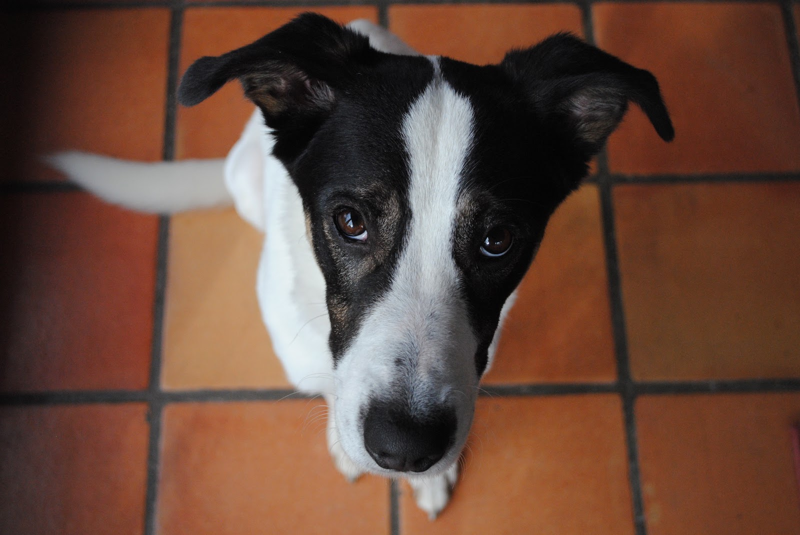

In [ ]:
from PIL import Image
img = Image.open('blas_the_dog/test/blas.jpg')
img.resize((800,535))

### Transformations

ConvNets expect input images to be of a certain size, otherwise the dimensions of the tensors within the network don't work out. We have to resize this image so it is of size $224\times 224$ as the network expects. Secondly, when training neural networks, we often normalise the inputs (substract the mean and divide by the standard deviation). As this model was trained on ImageNet, we have to use the mean and standard deviation from this dataset. Thankfully, we don't have to compute this, as it's included in the [pytorch documentation](https://pytorch.org/vision/0.8/models.html) (as well as elsewhere on the internet).

We will use `transforms` from the `torchvision` module to apply these transformations to the image. We also convert from `PIL.Image` to `torch.Tensor` in the process:

In [ ]:
from torchvision import transforms

transform = transforms.Compose([transforms.Resize(255),
                                transforms.CenterCrop(224),
                                transforms.ToTensor(),
                                transforms.Normalize(
                                    mean=[0.485, 0.456, 0.406],
                                    std=[0.229, 0.224, 0.225]
                                )])

img_t = transform(img)

We can display the transformed image by converting it back to `PIL.Image`. We can see that the image was downsized, cropped to it's centre square region, and the colours are messed up due to normalization.

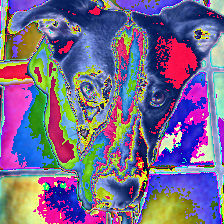

In [ ]:
transforms.ToPILImage()(img_t)

### Loading  the model

Now we are going to load the pre-trained 18-layer ResNet model from the `torchvision` library.

In [ ]:
from torchvision import models

resnet18 = models.resnet18(pretrained=True)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:01<00:00, 34.5MB/s]


Let's see how the model classifies Blas, the border collie. For this, we have to turn the image tensor into a minibatch of 1 example, which practically means adding an extra dimension to the tensor. This can be done using the `unsqueeze` function.

In [ ]:
x = img_t.unsqueeze(0)
y = resnet18(x)
y.size()

torch.Size([1, 1000])

The model's output is a vector of 1000 logits, one for each class in the ImageNet dataset. To interpret this, we have to know what the ImageNet classes are. Also, the logits themselves are less human-readable, so we are going to turn them into probabilities using a `softmax` function. This helper function below will do this for us.

In [ ]:
import requests
import json
from torch.nn.functional import softmax

imagenet_labels_url = 'https://raw.githubusercontent.com/anishathalye/imagenet-simple-labels/master/imagenet-simple-labels.json'
response = requests.get(imagenet_labels_url)
imagenet_class_names = json.loads(response.text)

def top_5_classes(y, class_names = None):
  if class_names==None:
    imagenet_labels_url = 'https://raw.githubusercontent.com/anishathalye/imagenet-simple-labels/master/imagenet-simple-labels.json'
    response = requests.get(imagenet_labels_url)
    class_names = json.loads(response.text)
  p = softmax(y[0,:], dim=0)
  values, indices = p.topk(5)
  return [(class_names[index], value) for index, value in zip(indices.detach().numpy(), values.detach().numpy())]

In [ ]:
top_5_classes(y)

[('bucket', 0.0078050816),
 ('plunger', 0.0072315675),
 ('hook', 0.0070612985),
 ('waste container', 0.005460199),
 ('water bottle', 0.0054413127)]

Oops, the model doesn't seem to recognise Blas. It thinks Blas is a bucket, plunger or hook. This is because in order to use the pretrained models in pytorch, we have to set them to evaluation mode. When training deep neural networks, sometimes the networks work differently at training and test time. For example, when using a technique called dropout, random units in the network may be dropped at training time, but at test time, all units are used and their output is scaled. Similarly, when using batch normalisation, the network works differently in training time and at test time. To set models to evaluation mode we can use the `eval` function.

In [ ]:
resnet18.eval()
y = resnet18(x)
top_5_classes(y)

[('Staffordshire Bull Terrier', 0.18592538),
 ('Cardigan Welsh Corgi', 0.13814482),
 ('American Staffordshire Terrier', 0.13022633),
 ('Basenji', 0.08973349),
 ('Whippet', 0.0894181)]

OK, getting there. At least the model now recognises Blas as a dog, but misses the specific breed. The correct class would be a Border Collie.

## Inspecting networks

For the next questions, you will need to look inside the pre-trained networks, and later, you will start modifying them. Below, we share a few things that will help you learn how models work. First, let's look at what the `resnet18` architecture looks like and how that architecture is represented in pytorch. You can print the model to see a text description of it:

In [ ]:
print(resnet18)

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

Here, modules are listed from top to bottom in order of how they are executed.In a pytorch ResNet, residual blocks are organised into `layers`, each of which contain sequences of residual blocks. You will notice that:
* the number of channels keeps doubling at each layer, in this case from 128 -> 256 -> 512.
* at the same time, the figure size is halved with each layer. The image size is halved by `MaxPool2d` layers as well as strided convolutions where the stride is `2`.
* a `resnet18` is built out of `BasicBlock` building blocks, which are the simple residual block proposed by [He et al, (2015)](https://arxiv.org/abs/1512.03385) which I showed in the lecture. Deeper ResNets, such as `resnet50` use a more complicated `Bottleneck` component instead.
* in pytorch, the linear and nonlinear parts of a layer are separate, i.e. the convolution and subsequent ReLU activation are handled as separate layers.

To access the second convolution layer from the second residual block at the third layer, you can write the following:

In [ ]:
resnet18.layer3[1].conv2

Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)

And you can access parameters of layers like so.

In [ ]:
resnet18.conv1.weight.size()

torch.Size([64, 3, 7, 7])

We can visualise the convolution kernels on the first layer using the code below. In addition to showing how to access weights, you may find some of this code useful as an example of using the `matplotlib.pylab` package for plotting.

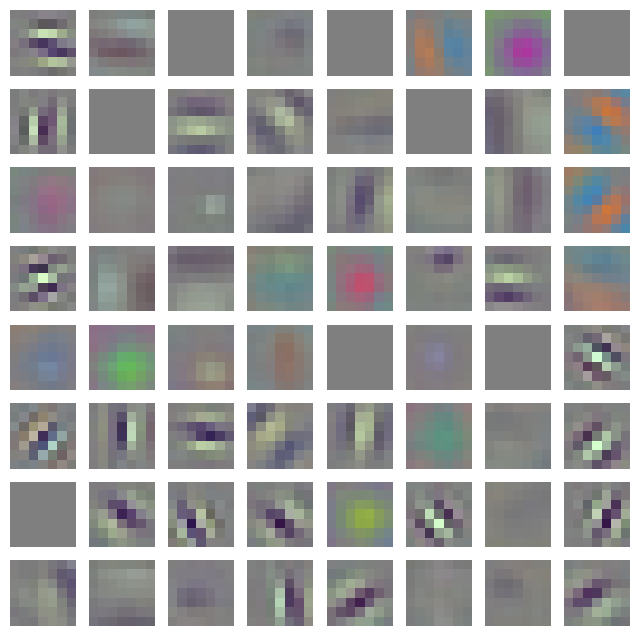

In [ ]:
import numpy as np
from matplotlib import pylab as plt

plt.figure(figsize = (8,8))

weights = resnet18.conv1.weight.detach().numpy()
#normalising weights so a value of 0 becomes gray, and colours stay within [0,1]
weights = weights/(np.abs(weights).max())/2+0.5

#there are 64 convolution kernels, which we will arrange along an 8x8 grid
for i, w in enumerate(weights):
  plt.subplot(8, 8, i+1)
  # we move the colour channel axis to the end, this is where imshow expects it
  plt.imshow(np.moveaxis(w, 0, -1));
  plt.axis('off')

In pytorch, you can inspect the internal workings of the network does by using forward hooks. A forward hook is a python function that gets called whenever the layer is evaluated (i.e. data is passed through the layer). The forward hook function receives both the input and the output of the module. In pytorch, you can add a forward hook using the register_forward_hook function.

For example, in the code below, I attach a hook to a layer, which simply prints something out. Instead of attaching the hook to the resnet18, I first create a `deepcopy` of the model, so the hook gets attached to the copy, but not to the `resnet18` model which I may use later.

In [ ]:
import copy

def useless_hook(module, input, output):
  print('The hook was called.')

model = copy.deepcopy(resnet18)
model.layer3[1].conv2.register_forward_hook(useless_hook)
y = model(x)
y = model(x)

The hook was called.
The hook was called.


## Editing models

Models can be edited rather flexibly in pytorch. Underlying a pytorch `Module` are python `OrderedDict` objects. These are ordered lists of key-value pairs. Each submodule and each parameter has a name, which is the key. Members of the dictionary can be accessed as attributes of the `Module`. Adding a new parameter or layer to a module will add a new key-value pair to this dictionary.

Let's try adding a new operation to our resnet18, which converts the logits to probabilities. We will do this by replacing the final operation by a `Sequential` module, which chains multiple operations together.

In [ ]:
from torch.nn import Softmax, Sequential

model = copy.deepcopy(resnet18)
model.fc = Sequential(
    model.fc,
    Softmax(dim=1)
    )

In [ ]:
#let's see what the model looks like now
print(model)

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

Let's check the model still works and that it outputs a vector of probabilities which therefore sums to one.

In [ ]:
y = model(x)
print(y.sum())

tensor(1.0000, grad_fn=<SumBackward0>)


We can also replace existing layers with other layers. Here, for example, I replace the first convolution layer with a randomly initialized one of the same dimensions. We can check what effect this has on the classification of Blas:

In [ ]:
from torch.nn import Conv2d

model = copy.deepcopy(resnet18)
model.conv1 = Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
y = model(x)
top_5_classes(y)

[('spider web', 0.45553878),
 ('shower curtain', 0.1214019),
 ('window shade', 0.10264486),
 ('lampshade', 0.065079555),
 ('pitcher', 0.0372457)]

Or, if we replace the convolutional layer by the convolutions from the VGG19 network, followed by a MaxPooling, to account for the difference in stride, the network becomes pretty certain that Blas is, in fact, spider web, or possibly a type of spider.

In [ ]:
from torch.nn import MaxPool2d

vgg19 = models.vgg19(pretrained=True)

model = copy.deepcopy(resnet18)
model.conv1 = Sequential(
      vgg19.features[0],
      MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False))
y=model(x)
top_5_classes(y)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth
100%|██████████| 548M/548M [00:07<00:00, 79.6MB/s]


[('spider web', 0.90512764),
 ('barn spider', 0.038777336),
 ('European garden spider', 0.013474084),
 ('window screen', 0.01183889),
 ('wolf spider', 0.0043047303)]

## Question C.1: Looking inside the ResNet

*3 marks*


This question has subtasks:
1. print the number of parameters in each of the operations of the `ResNet18`, and count how many there are in total.
1. print the *shape of the output tensor* after every layer (`layer1` through to `layer4`) within  a `ResNet18`. Note that layer here refers to the entire submodules named a layer inside the Resnet, for example `layer1` refers to the entire substructure labeled `layer1` when you do `print(model)`, not the first convolution operation. *Tip:* you can use a forward hook.
1. Calculate the outputs of each of the layers (`layer1`, `layer2`, etc) in response to the image of Blas the dog and plot them. As this will come in handy later, do this by creating a modified model whose outputs are these intermediate feature maps and subsequent operations are not even applied.

*Tips:*
* use `copy.deepcopy` to create copies of models.
* You can use `tensor.size()` to get the shape.
* you have to use `tensor.detach().numpy()` to detach a pytorch tensor from the computational graph and convert it to a numpy array.
* on a pytorch module you can call `named_children` and `named_parameters` to iterate over layers and parameters, respectively.
* You can easily delete layers from inside the ResNet by replacing them with `Identity` blocks.
* Note that the [ResNet implementation](https://github.com/pytorch/vision/blob/b1123cfd543d35d282de9bb28067e48ebec18afe/torchvision/models/resnet.py#L279) `flattens` tensors before feeding them to the fully connected layer, and this flattening operation cannot be as easily removed. You may have to figure out how to reshape the output to be the correct shape again.
* You should be able to solve these tasks using a few lines of code only.

### Answer C.1

please provide your answers in code cells below (you may use multiple code cells).

### Answer C.1.1

In [ ]:
# list number of parameters in everything
stack = [('resnet18', resnet18)]
while stack:
    name, module = stack.pop()
    stack.extend(reversed([(f'{name}.{childname}', child) for (childname, child) in module.named_children()]))
    tabs = ''.join('\t' for _ in range(4 - len(name) // 8))
    print(f'{name=} {tabs} number of parameters: {sum(p.numel() for p in module.parameters())}')

# print the total number of parameters
print(f'\nTotal number of parameters: {sum(p.numel() for p in resnet18.parameters())}')

name='resnet18' 			 number of parameters: 11689512
name='resnet18.conv1' 			 number of parameters: 9408
name='resnet18.bn1' 			 number of parameters: 128
name='resnet18.relu' 			 number of parameters: 0
name='resnet18.maxpool' 		 number of parameters: 0
name='resnet18.layer1' 			 number of parameters: 147968
name='resnet18.layer1.0' 		 number of parameters: 73984
name='resnet18.layer1.0.conv1' 		 number of parameters: 36864
name='resnet18.layer1.0.bn1' 		 number of parameters: 128
name='resnet18.layer1.0.relu' 		 number of parameters: 0
name='resnet18.layer1.0.conv2' 		 number of parameters: 36864
name='resnet18.layer1.0.bn2' 		 number of parameters: 128
name='resnet18.layer1.1' 		 number of parameters: 73984
name='resnet18.layer1.1.conv1' 		 number of parameters: 36864
name='resnet18.layer1.1.bn1' 		 number of parameters: 128
name='resnet18.layer1.1.relu' 		 number of parameters: 0
name='resnet18.layer1.1.conv2' 		 number of parameters: 36864
name='resnet18.layer1.1.bn2' 		 number of 

### Answer C.1.2

In [ ]:
# clone the model and for each 'operation', register a hook which prints the dimensionality of the output
model = copy.deepcopy(resnet18)

# define a hook which prints the shape of the output tensors
def print_out_dims_hook(module, input, output):
    print(output.size())

# add the hook to the layers
model.layer1.register_forward_hook(print_out_dims_hook)
model.layer2.register_forward_hook(print_out_dims_hook)
model.layer3.register_forward_hook(print_out_dims_hook)
model.layer4.register_forward_hook(print_out_dims_hook)

model(x);

torch.Size([1, 64, 56, 56])
torch.Size([1, 128, 28, 28])
torch.Size([1, 256, 14, 14])
torch.Size([1, 512, 7, 7])


### Answer C.1.3

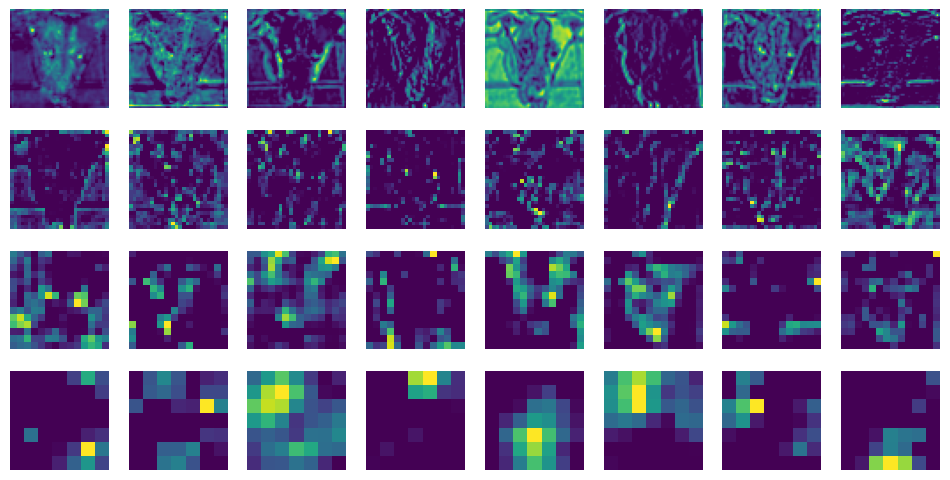

In [ ]:
import torch.nn as nn
import itertools

# define a modified module which only computes the things we care about!
class ModifiedModel(nn.Module):
    def __init__(self):
        super().__init__()
        model = copy.deepcopy(resnet18)
        self.features = nn.Sequential(
            model.conv1,
            model.bn1,
            model.relu,
            model.maxpool,
        )
        self.layer1 = model.layer1
        self.layer2 = model.layer2
        self.layer3 = model.layer3
        self.layer4 = model.layer4

    def forward(self, x):
        y = self.features(x)
        l1 = self.layer1(y)
        l2 = self.layer2(l1)
        l3 = self.layer3(l2)
        l4 = self.layer4(l3)
        return (l1, l2, l3, l4)

modifiedmodel = ModifiedModel()

layerouts = modifiedmodel(x)

plt.figure(figsize = (12,6))

weights = resnet18.conv1.weight.detach().numpy()

# normalising layer outputs so a value of 0 becomes gray, and colours stay within [0,1]
l1, l2, l3, l4 = [layer / np.abs(layer).max() / 2 + 0.5 for layer in map(lambda l: l.detach().numpy(), layerouts)]

# there are 960 channels: I display the first 8 of each layers output
for i, c in enumerate(itertools.chain(l1[0, :8], l2[0, :8], l3[0, :8], l4[0, :8])):
    plt.subplot(4, 8, i+1)
    plt.imshow(c)
    plt.axis('off')

## Question C.2: Feature visualization in ResNet18

*6 marks*

In the previous task you have looked at the values of intermediate features in response to an image. Perhaps this gave you some ideas about what individual features might *mean* or what aspects of an image they respond to with a high activation.

In this question, we ask you to explore this more systematically, using [Feature visualization with Optimization](https://distill.pub/2017/feature-visualization/#optimization). This question is composed of several tasks:

1. Starting from a grey image (e.g. `0.5*torch.ones(...)`), use gradient-based optimization (with no additional regularisation) to find images such that on these resulting images, certain internal activations in the network take maximal (or at least very high) values. Use your code for C.1 to output intermediate activations of units in `layer3`. Create optimal images that maximise:
    * a single activation in the middle (horizontally and vertically) of a chosen feature map/channel.
    * a row of activations along a horizontal line in the feature map, in a single channel
    * the sum of all activations of a single feature map (channel) across the whole image.
    * the sum of all activations across all channels and spatial locations in `layer3`
2. The previous method has likely produced rather grainy results, often with periodic artifcacts, as explained in 'The Enemy of Feature Visualization' section of [the article](https://distill.pub/2017/feature-visualization/#optimization). To obtain more natural looking, and thus more interpretable results, it helps if we add some regularization. A simple regularisation technique is to apply gaussian blur, small rotations or magnification
to your image between gradient steps. This is demonstrated in the post above. Repeat the first task but now with this added regularisation approach.

*Tips:*
* When optimizing the activation in the middle of the image, expect to see a localised pattern that's most intense in the middle.
* Don't forget to apply the right normalisation to the image before feeding it to the network (like we did with the image of Blas).
* Make sure the network is in evaluation mode, and that its parameters are not changed by your optimisation procedure.
*You may want to use the [`torch.no_grad()`](https://pytorch.org/docs/stable/generated/torch.no_grad.html) environment when applying transformations to tensors that are subject to gradient-based optimisation, if you don't want these transformations to become part of the computational graph.
* This will be much faster if you switch to a GPU backend. Make sure that all tensors (input, model, transformations) are moved to the GPU using `.cuda()` for fastest performance.

*Note:*
The feature visualization reference contains very interpretable, and beautiful results. Getting these pretty images is often a result of extensive tweaking of the methods on the basis of subjective criteria. Don't worry if your results are not as pretty as those. What we are looking for is demonstrating an understanding of how to optimize different parts of the image, and using the regularization techniques successfully.

### Answer C.2

### Answer C.2.1

Implementation of feature maximisation via gradient descent. I implement this via SGD with batch size of 1.

100%|██████████| 500/500 [00:04<00:00, 108.81it/s]


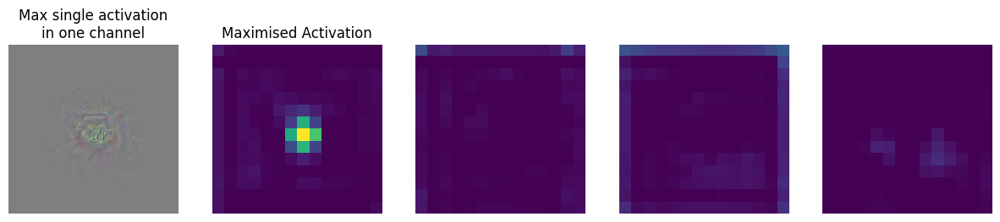

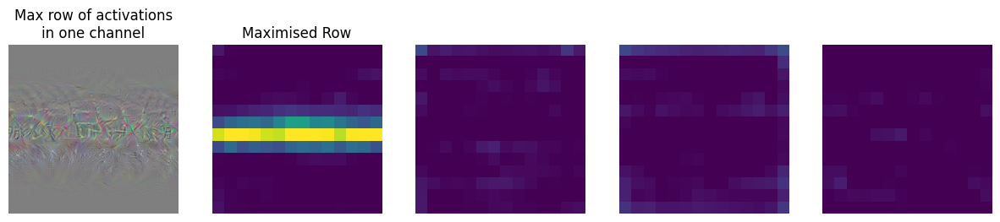

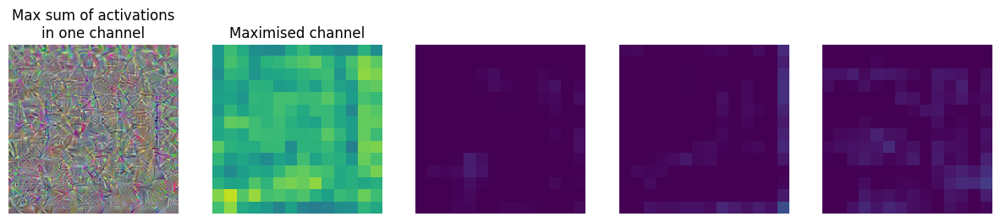

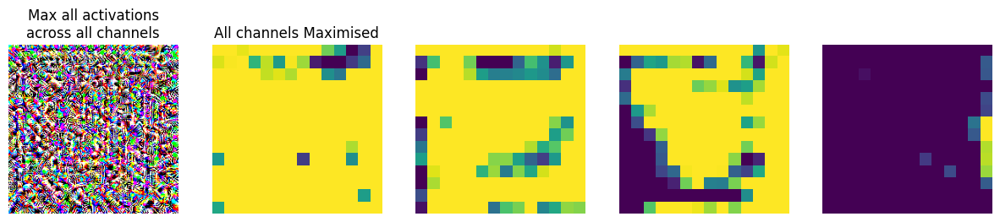

In [ ]:
import torch.optim
from tqdm import trange

transform = transforms.Normalize(
    mean=[0.485, 0.456, 0.406],
    std=[0.229, 0.224, 0.225]
)

model = ModifiedModel().cuda()

model.eval()

channel = 17  # chosen since features are visually interesting
for j, loss_fn, name, h2 in (
    (0, lambda l3: -l3[0, channel, 7, 7], 'Max single activation\nin one channel', 'Maximised Activation'),
    (5, lambda l3: -l3[0, channel, 7, :].sum(), 'Max row of activations\nin one channel', 'Maximised Row'),
    (10, lambda l3: -l3[0, channel].sum(), 'Max sum of activations\nin one channel', 'Maximised channel'),
    (15, lambda l3: -l3.sum(), 'Max all activations\nacross all channels', 'All channels Maximised')
):
    # get an initial vector of the right size
    x = nn.Parameter(0.5 * torch.ones(1, 3, 224, 224).cuda())

    # define the optimiser for the parameters (it's SGD but we are batching with 1 so is equivalent to GD)
    optim = torch.optim.SGD([x], lr=0.01)

    # 'train' the input
    for _ in trange(500):
        optim.zero_grad()
        _, _, l3, _ = model(transform(x))
        loss = loss_fn(l3)
        loss.backward()
        optim.step()

    plt.figure(figsize = (15,12))
    # there are 960 channels: I display 4 of each output including the one we are maximising
    plt.subplot(4, 5, j + 1)
    plt.imshow(np.moveaxis(x.data.detach().cpu().numpy().reshape(3, 224, 224), 0, -1))
    plt.title(name)
    plt.axis('off')
    plt.subplot(4, 5, j + 2)
    plt.imshow(l3[0, channel].detach().cpu().numpy(), vmin=0, vmax=10)
    plt.axis('off')
    plt.title(h2)
    for i, c in enumerate(l3[0, channel + 1:channel + 4].detach().cpu().numpy()):
        plt.subplot(4, 5, j + i + 3)
        plt.imshow(c, vmin=0, vmax=10);  # yellow is 10, blue is 0
        plt.axis('off')

Each row represents the answer to a different task. All images are on the same scale -- where yellow means "$\ge 10$" and dark blue means "$\le 0$".

I conject that the reason channel 3 is less than channel 4 because its stuck in a local maxima.

### Answer C.2.2

The regularisation methods I use (chosen for visually appealing results):
- Gaussian Blur
- Random Rotations
- Random Magnification via zooming into sections of the image randomly
- Adam Optimiser
- (small) Weight Decay

100%|██████████| 500/500 [00:06<00:00, 74.64it/s]


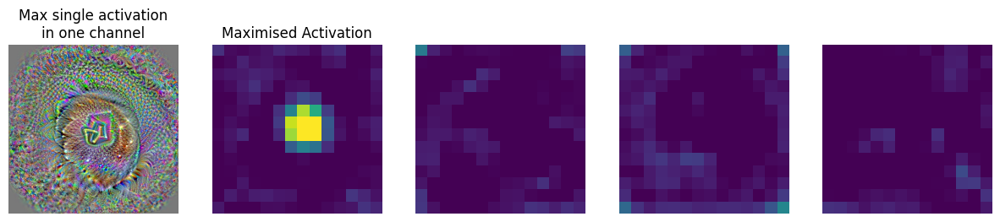

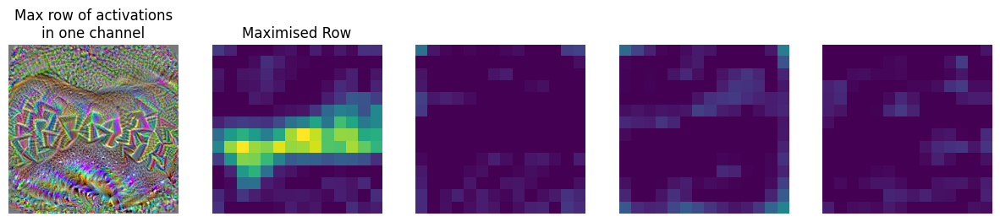

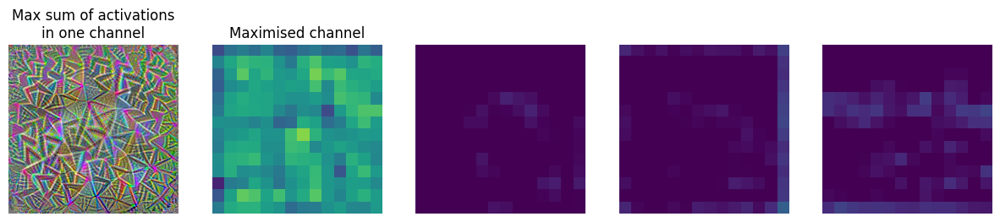

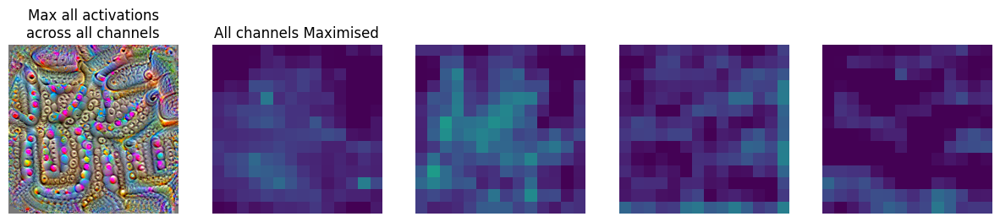

In [ ]:
import torch.optim
from tqdm import trange

transform = transforms.Compose(
    [
        transforms.RandomCrop(224),
        transforms.Normalize(
            mean=[0.485, 0.456, 0.406],
            std=[0.229, 0.224, 0.225]
        ),
        transforms.GaussianBlur(5),
        transforms.RandomRotation(30)
    ]
)

model = ModifiedModel().cuda()

model.eval()

channel = 17  # chosen since features are visually interesting
for j, loss_fn, name, h2 in (
    (0, lambda l3: -l3[0, channel, 7, 7], 'Max single activation\nin one channel', 'Maximised Activation'),
    (5, lambda l3: -l3[0, channel, 7, :].sum(), 'Max row of activations\nin one channel', 'Maximised Row'),
    (10, lambda l3: -l3[0, channel].sum(), 'Max sum of activations\nin one channel', 'Maximised channel'),
    (15, lambda l3: -l3.sum(), 'Max all activations\nacross all channels', 'All channels Maximised')
):
    # get an initial vector -- note its larger s.t. we can randomcrop
    x = nn.Parameter(0.5 * torch.ones(1, 3, 256, 256).cuda())

    # define the optimiser
    optim = torch.optim.AdamW([x], lr=0.01, weight_decay=0.01)

    # 'train' the input
    for _ in trange(500):
        optim.zero_grad()
        _, _, l3, _ = model(transform(x))
        loss = loss_fn(l3)
        loss.backward()
        optim.step()

    plt.figure(figsize = (15,12))

    model.eval()
    # there are 960 channels: I display 4 of each output including the one we are maximising
    plt.subplot(4, 5, j + 1)
    plt.imshow(np.moveaxis(x.data.detach().cpu().numpy().reshape(3, 256, 256), 0, -1))
    plt.title(name)
    plt.axis('off')
    plt.subplot(4, 5, j + 2)
    plt.imshow(l3[0, channel].detach().cpu().numpy(), vmin=0, vmax=5)
    plt.axis('off')
    plt.title(h2)
    for i, c in enumerate(l3[0, channel + 1:channel + 4].detach().cpu().numpy()):
        plt.subplot(4, 5, j + i + 3)
        plt.imshow(c, vmin=0, vmax=5);
        plt.axis('off')

Observe how the aggressive regularisation has decreased the overall magnitude of the features we maximise by overfitting less and "generalising". The result is more interpretable (and visually appealing) features.

**Note**: the images channel maximisation images are now scaled between 0 and 5 rather than 0 and 10.

## Question C.3: Adversarial Examples

*6 marks*

Convolutional networks are shown to be very sensitive to perturbations to their input image. It is possible to change an image very slightly, so slightly that a human wouldn't notice any change, while fooling the network into misclassifying the image.

The following famous example is taken from [Explaining and Harnessing Adversarial Examples](https://arxiv.org/abs/1412.6572) by Goodfellow et al.:

![Illustration of adversarial examples](https://www.tensorflow.org/static/tutorials/generative/images/adversarial_example.png)

Your task is to
1. Implement the fast gradient sign method, and generate an adversarial input to a network of your choice based on the image of Blas.
1. Implement the iterated fast gradient sign method, and generate an adversarial image based on Blas.
1. Document what you find. Was the attack successful?

*Tips:*
* Don't forget that the normalisation step is part of using a network on a natural image.
* As above, things might work faster using GPUs.

### Answer C.3.1

I implement a **targeted** attack -- I aim to misclassify Blas to a particular class. I choose Dumbell. I chose it since it is unrelated to dogs and has moderately low initial probability but still with some probability mass ($\sim 1\%$).

In [ ]:
def top_5_indices(y, class_names = None):
    if class_names==None:
        imagenet_labels_url = 'https://raw.githubusercontent.com/anishathalye/imagenet-simple-labels/master/imagenet-simple-labels.json'
        response = requests.get(imagenet_labels_url)
        class_names = json.loads(response.text)
    p = softmax(y[0,:], dim=0)
    values, indices = p.topk(5)
    return [(class_names[index], index, round(value, 3)) for (index, value) in zip(indices.cpu().detach().numpy(), values.cpu().detach().numpy())]

[('Staffordshire Bull Terrier', 179, 0.186), ('Cardigan Welsh Corgi', 264, 0.138), ('American Staffordshire Terrier', 180, 0.13), ('Basenji', 253, 0.09), ('Whippet', 172, 0.089)]
[('nematode', 111, 0.172), ('spotlight', 818, 0.141), ('match', 644, 0.114), ('lampshade', 619, 0.045), ('digital clock', 530, 0.042)]
[('dumbbell', 543, 0.796), ('Boston Terrier', 195, 0.161), ('French Bulldog', 245, 0.023), ('Cardigan Welsh Corgi', 264, 0.004), ('barbell', 422, 0.004)]


Text(112, 240, 'dumbbell\n p=0.796')

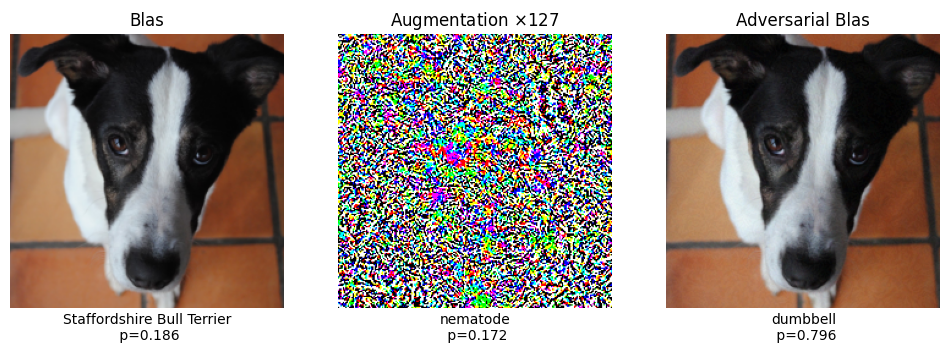

In [ ]:
import torch

to_imagenet_dims = transforms.Compose([
    transforms.Resize(255),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
])
blas = nn.Parameter(to_imagenet_dims(img).cuda().reshape(1, 3, 224, 224).detach())
model = copy.deepcopy(resnet18).cuda()

normalise = transforms.Normalize(
    mean=[0.485, 0.456, 0.406],
    std=[0.229, 0.224, 0.225]
)

model.eval()

loss = model(normalise(blas))[0, 543]
loss.backward()

with torch.no_grad():
    # gradient update + clamping to limit to valid range
    adv_blas = torch.clamp(blas.data + torch.sign(blas.grad) / 127, 0, 1)

# demonstration that this works! We see that blas is classified as a dumbbell! (the class having index 543)
blas_indices = top_5_indices(model(normalise(blas)).detach().cpu())
print(blas_indices)
aug_indices = top_5_indices(model(normalise(torch.sign(blas.grad) / 127)).cpu())
print(aug_indices)
adv_indices = top_5_indices(model(normalise(adv_blas)).detach().cpu())
print(adv_indices)
# note that the single fgsm method only worked for classes that had a probability over around 0.01
plt.figure(figsize = (12,4))
plt.subplot(1, 3, 1)
plt.imshow(np.moveaxis(blas.detach().cpu().numpy().reshape(3, 224, 224), 0, -1))
plt.axis('off')
plt.title('Blas')
plt.text(112, 240, f'{blas_indices[0][0]}\n p={blas_indices[0][2]:.3}', ha='center', va='center')
plt.subplot(1, 3, 2)
plt.imshow(np.moveaxis(torch.sign(blas.grad).detach().cpu().numpy().reshape(3, 224, 224), 0, -1))
plt.axis('off')
plt.title('Augmentation $\\times 127$')
plt.text(112, 240, f'{aug_indices[0][0]}\n p={aug_indices[0][2]:.3}', ha='center', va='center')
plt.subplot(1, 3, 3)
plt.imshow(np.moveaxis(adv_blas.detach().cpu().numpy().reshape(3, 224, 224), 0, -1))
plt.axis('off')
plt.title('Adversarial Blas')
plt.text(112, 240, f'{adv_indices[0][0]}\n p={adv_indices[0][2]:.3}', ha='center', va='center')

### Answer C.3.2

The previous attack only worked for classes which already had *some* probability mass. Notably, it did not work for very low probability predictions. I use Iterated FGSM to generate an adversarial perturbation of Blas which is misclassified to the class which was deemed to be the least likely: Limpkin (a type of bird).

[('Staffordshire Bull Terrier', 179, 0.186), ('Cardigan Welsh Corgi', 264, 0.138), ('American Staffordshire Terrier', 180, 0.13), ('Basenji', 253, 0.09), ('Whippet', 172, 0.089)]
[('Border Collie', 232, 0.127), ('collie', 231, 0.04), ('muzzle', 676, 0.031), ('St. Bernard', 247, 0.022), ('Cardigan Welsh Corgi', 264, 0.022)]
[('llama', 355, 0.049), ('limpkin', 135, 0.045), ('ram', 348, 0.025), ('crane (bird)', 134, 0.024), ('muzzle', 676, 0.019)]
[('limpkin', 135, 0.8), ('great egret', 132, 0.038), ('dowitcher', 142, 0.018), ('crane (bird)', 134, 0.016), ('spoonbill', 129, 0.015)]
[('limpkin', 135, 0.988), ('hornbill', 93, 0.003), ('pelican', 144, 0.002), ('vulture', 23, 0.002), ('crane (bird)', 134, 0.001)]


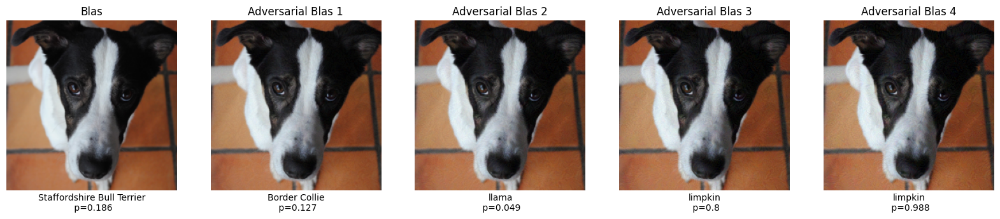

In [ ]:
to_imagenet_dims = transforms.Compose([
    transforms.Resize(255),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
])
blas = nn.Parameter(to_imagenet_dims(img).cuda().reshape(1, 3, 224, 224).detach(), requires_grad=True)
model = copy.deepcopy(resnet18).cuda()

normalise = transforms.Normalize(
    mean=[0.485, 0.456, 0.406],
    std=[0.229, 0.224, 0.225]
)

model.eval()

blas_indices = top_5_indices(model(normalise(blas)).detach().cpu())
print(blas_indices)

n = 4

plt.figure(figsize = (4 + 4 * n,4))
plt.subplot(1, n + 1, 1)
plt.imshow(np.moveaxis(blas.detach().cpu().numpy().reshape(3, 224, 224), 0, -1))
plt.axis('off')
plt.title('Blas')
plt.text(112, 240, f'{blas_indices[0][0]}\n p={blas_indices[0][2]:.3}', ha='center', va='center')

model.eval()

# this works in general! I tested for many classes and demonstrate it on the least likely class: Limpkin
for i in range(4):
    loss = model(normalise(blas))[0, 135]
    loss.backward()

    with torch.no_grad():
        # add + clamp to ensure adv_blas is still a valid input
        blas.data = torch.clamp(blas.data + torch.sign(blas.grad) / 127, 0, 1)
        blas.grad = torch.zeros_like(blas.grad)
    adv_indices = top_5_indices(model(normalise(blas)).detach().cpu())
    print(adv_indices)
    plt.subplot(1, n + 1, i + 2)
    plt.imshow(np.moveaxis(blas.detach().cpu().numpy().reshape(3, 224, 224), 0, -1))
    plt.axis('off')
    plt.title(f'Adversarial Blas {i + 1}')
    plt.text(112, 240, f'{adv_indices[0][0]}\n p={adv_indices[0][2]:.3}', ha='center', va='center')


# Limkin was the least (1000th) most likely classification with initial probability 1.9475761e-08
# in 3 steps; we classified blas as a limkin; and by 4 steps the model was very confident!

### Answer C.3.3

Targeted FGSM:
- the attack was successful if the class we attempt to misclassify to has some probability mass (i.e. > 1%)
- the adversarial images generated were visually indistinguishable from the source image

Targeted Iterated FGSM:
- the attack was successful in all cases
- it was able to get adversarial examples in a *very* low number of steps -- 3
- I demonstrate this by getting Blas misclassified as a Limkin (the least likely class)
- however, the images generated after several timesteps have static which would be visible for a human (c.f. Adversarial blas 4 has visible static)

Between both attacks, all images are still recognisably Blas -- and none look anything like the class they are being misclassified to!

Both attacks were **very** fast and computationally efficient.

In [ ]:
%reset -f

---

# D: Transformers vs PCFGs

In this part of the assignment, you will train simple language models on samples generated from probabilistic context-free grammars (PCFGs). These are just like CFGs (which I assume you know about) but each production rule has an associated probability. Thus, a PCFG defines not only a grammar (set of grammatical sentences), but a probability distribution over sentences.

## Setting up

We will set up this exercise by creating a dataset of strings sampled from a PCFG, and then fitting a simple Markov model to it.


### Creating a dataset

Below, I included a class which wraps a PCFG inside a pytorch `Dataset`. To define the PCFG itself, I install the `pcfg` python module, which is, in turn, based on `nltk`. This library allows us to define a PCFG by writing down production rules in a relatively self-explanatory string, and then draw samples from it.

Please refer to https://github.com/thomasbreydo/pcfg for examples and documentation.

In [ ]:
!pip install pcfg > /dev/null

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
dask 2023.8.1 requires importlib-metadata>=4.13.0, but you have importlib-metadata 3.10.1 which is incompatible.


In [ ]:
import torch
from pcfg import PCFG
from torch.utils.data import TensorDataset
from torch.nn.functional import pad
from torchtext.vocab import build_vocab_from_iterator
from torchtext.functional import to_tensor, truncate
from typing import Tuple

class PCFGDataset(TensorDataset):
    r"""Pytorch Dataset wrapping sentences sampled from a probabilistic
    context-free grammar (PCFG).

    Each sample will be generated from the PCFG supplied, truncated and padded
    to the required length, with characters encoded as distinct integers.

    This dataset contains source and target sequences, where the target sequence
    is the same as the source but shifted by one to the left. This is useful for
    self-supervised next token prediction tasks.

    Parameters
    ----------
    grammar : pcfg.PCFG
        PCFG object typically initialized from a string representing production
        rules
    n_samples : int
        Number of samples drawn from the PCFG. Defaults to 1024.
    seqlength : int
        Length of the sequences after truncation and padding. Defaults to 128.
    padchar : str
        Character used to pad strings. Defaults to a space character.

    Attributes
    ----------
    tensors: Tuple[torch.Tensor, ...]
        Pair of tensors representing source and target sequences, where the
        target sequence is the same as the source but shifted to the left by
        one.
    """
    tensors: Tuple[torch.Tensor, ...]

    def __init__(self, grammar:PCFG, n_samples:int=1024, seqlength:int=128, padchar:str=' ') -> None:
        sentences = [sentence.replace(' ', '') for sentence in grammar.generate(n_samples)]
        vocab = build_vocab_from_iterator(''.join(sentences)+padchar)
        self.vocab = vocab
        indices = [vocab([c for c in sentence]) for sentence in sentences]
        T = to_tensor(truncate(indices, max_seq_len=seqlength+1), padding_value=vocab[padchar])
        B, L = T.shape
        T = pad(T, (0, seqlength+1-L), 'constant', vocab[padchar])
        X = T[:, :-1]
        Y = targets = T[:, 1:]
        self.tensors = (X, Y.contiguous())

    def __getitem__(self, index:int):
        return tuple(tensor[index] for tensor in self.tensors)

    def __len__(self):
        return self.tensors[0].size(0)

    def decode_tensor(self, t:torch.Tensor):
      """Decodes a tensor of integers into strings. Useful for printing model
      generations."""
      itos = self.vocab.get_itos()
      return [''.join([itos[i] for i in sequence]) for sequence in t.tolist()]

    def get_vocab_size(self):
      """Returns size of vocabulary."""
      return len(self.vocab)

    def head(self, n: int):
      """Prints the string representation of the first n datapoints."""
      print('\n'.join(self.decode_tensor(self[:n][0])))

Let's create a mildly interesting dataset with this, using a rainbows and unicorns version of a $b^na^mb^{2n}$ grammar, which generates a block of 🌈s followed by a block of 🦄s, followed by a second block of 🌈s that is twice as long as the first. (if you dislike the emojis chosen here, feel free to change them to any other unicode symbols).

In [ ]:
toy_grammar = PCFG.fromstring("""
S -> "🌈" S "🌈🌈" [0.5] | A [0.5]
A -> "🦄" A [0.5] | "🦄" [0.5]
""")

toy_dataset = PCFGDataset(toy_grammar)

toy_dataset.head(10)

🌈🌈🌈🦄🦄🦄🦄🌈🌈🌈🌈🌈🌈                                                                                                                   
🦄🦄🦄                                                                                                                             
🌈🌈🌈🦄🦄🌈🌈🌈🌈🌈🌈                                                                                                                     
🌈🦄🦄🦄🌈🌈                                                                                                                          
🌈🦄🌈🌈                                                                                                                            
🌈🌈🌈🌈🦄🦄🌈🌈🌈🌈🌈🌈🌈🌈                                                                                                                  
🦄                                                                                                                               
🌈🦄🦄🌈🌈                                                                                            

### A simple Markov-model

Now we're going to create a simple discrete Markov chain, and fit it to our data. A Markov model makes a probabilistic prediction of the next token considering the last token only, thus:

$$
p(x_{t+1} \vert x_{1}, \ldots, x_t, \theta) = p(x_{t+1} \vert x_t, \theta) = \phi(\theta_{x_{t}, x_{t+1}}),
$$

where $\theta$ is a $V\times V$ matrix, $V$ represents the vocabulary size, i.e. the number of distinct values $x_t$ can take, and $\phi$ is the logistic sigmoid.

If you watch Andrej Karpathy's video [Let's build GPT: from scratch, in code, spelled out](https://www.youtube.com/watch?v=kCc8FmEb1nY), this is the same as what he refers to as the `BigramLangaugeModel`.

In [ ]:
from torch.nn.functional import cross_entropy, softmax

class DiscreteMarkovModel(torch.nn.Module):
  r"""Pytorch Module that implements a discrete markov chain with `vocab_size`
    discrete states.

    Parameters
    ----------
    vocab_size : int
        Number of states/vocabulary entries.
  """
  def __init__(self, vocab_size:int):
    super().__init__()
    self.embedding = torch.nn.Embedding(vocab_size, vocab_size)

  def forward(self, input:torch.Tensor, target:torch.Tensor):
    r"""Evaluates logits for the next token, as well as the cross entropy
    between these predictions and the actual target sequence observations.

    Parameters
        ----------
        input:
            torch integer tensor of size batchsize times sequence length.
        target:
            The second parameter.

        Returns
        -------
        logits: torch.Tensor
            Tensor containing logits for next token prediction.
        loss: torch.Tensor
            Tensor wrapping scalar loss for cross-entropy loss.
    """
    logits = self.embedding(input)

    B, L, V = logits.shape
    loss = cross_entropy(logits.contiguous().view(B*L, V), target.contiguous().view(B*L))

    return logits, loss

  def generate(self, input, num_new_tokens=1):
    input = input.detach()

    for _ in range(num_new_tokens):
      logits, _ = self(input, input)

      p = softmax(logits[:, -1, :], dim=-1)

      new_tokens = torch.multinomial(p, num_samples=1)

      input = torch.concatenate([input, new_tokens], dim=1).contiguous()

    return input

We now look at what a randomly initialized model generates:

In [ ]:
from torch.utils.data import random_split

markov_model = DiscreteMarkovModel(toy_dataset.get_vocab_size())
markov_model = markov_model.cuda()

prefixes = toy_dataset[:10][0][:, :1].cuda()
generated_tensor = markov_model.generate(prefixes, num_new_tokens=20)

print('\n'.join(toy_dataset.decode_tensor(generated_tensor)))

🌈 🦄🌈 🌈 🌈 🦄🌈🌈 🦄🌈🌈 🌈🌈 🌈
🦄🌈 🦄 🦄🌈 🦄🦄🌈 🦄🌈 🦄🌈 🦄🦄🌈
🌈 🦄🌈 🦄🦄🌈 🌈 🌈 🌈 🦄 🦄🌈 🌈
🌈 🦄🌈🌈  🦄 🦄🌈 🌈 🌈 🌈 🦄🌈 
🌈 🦄🌈 🌈 🌈🌈🌈🌈 🌈   🦄🌈  🦄
🌈   🦄 🌈🌈  🦄 🦄🌈 🦄🦄🌈  🦄
🦄🌈 🦄🌈 🌈  🦄🌈  🌈  🌈 🦄  
🌈 🌈 🌈  🌈🌈 🌈🌈 🦄🦄🌈🌈 🦄🦄🌈
🦄🦄🦄🦄🌈 🌈 🌈 🌈 🦄🌈🌈 🌈 🦄 🌈
🦄🌈 🌈 🌈  🌈  🦄🦄🌈🌈 🦄  🌈 


Clearly, the model's output doesn't look anything like our training data. Let's try training the model using a simple pytorch training loop.

In [ ]:
from torch.optim import Adam
from torch.utils.data import DataLoader
from tqdm import trange

batch_size=256
learning_rate = 1e-2
toy_dataset.tensors = tuple(tensor.cuda() for tensor in toy_dataset.tensors)
train_loader = DataLoader(toy_dataset, batch_size)
optimizer = Adam(markov_model.parameters(), lr=learning_rate)
for _ in trange(1000):
    for x, y in train_loader:
        optimizer.zero_grad()
        _, loss = markov_model(x, y)
        loss.backward()
        optimizer.step()

100%|██████████| 1000/1000 [00:29<00:00, 34.28it/s]


Let's generate some output from the trained model.

In [ ]:
prefixes = toy_dataset[:10][0][:, :1].cuda()
generated_tensor = markov_model.generate(prefixes, num_new_tokens=20)

print('\n'.join(toy_dataset.decode_tensor(generated_tensor)))

🌈                    
🦄🌈                   
🌈🌈                   
🌈🌈🌈🌈🌈🌈🌈              
🌈🦄                   
🌈🦄🦄🌈                 
🦄🦄🦄🌈                 
🌈🌈🌈🦄🌈🌈🦄🦄🦄🦄🦄🦄         
🦄🦄🦄🦄🦄🦄🦄              
🦄🌈🦄🌈🌈🌈🌈🌈🌈🦄🌈🌈🌈🦄🦄🦄🦄    


## Question D.1: Model evaluation

*3 marks*

The generated strings above look more reasonable than the random ones before, but most of the time they don't follow the rules. (This is not surprising as a Markov model has no memory). Let's quantify the performance as we develop our models.

1. Write code that evaluates the cross-entropy loss on a held-out test/validation dataset
1. Write code that evaluates the probability that a generated sentence is grammatical (i.e. that it is a valid member of the language). I'll call this $\mathbb{P}(\mathcal{G})$.
1. Plot training loss, validation loss, as well as $\mathbb{P}(\mathcal{G})$ as training progresses.

*Tips:*
* It's possible to overthink step 2 - don't. For clarity, the Monte Carlo method of generating several random samples then checking how often a sample is grammatical is accepted.
* you might find it easier to wrap this code into a function as you'll use it later.
* feel free to make use training libraries such as pytorch lightning or ignite, but don't submit excessive output logs, and instead include your own plots as requested.

### Answer D.1

please add answer in the code cell(s) below:

### Answer D.1.1

In [ ]:
val_dataset = PCFGDataset(toy_grammar)
val_dataset.tensors = tuple(tensor.cuda() for tensor in val_dataset.tensors)
val_loader = DataLoader(val_dataset, batch_size)

def test_cse(model, val_loader=val_loader):
    cum_loss = 0
    total = 0
    for x, y in val_loader:
        _, loss = model(x, y)
        cum_loss += loss.item() * y.size(0)
        total += y.size(0)
    # weighting by number of targets deals with non-constant batch size
    return cum_loss / total

test_cse(markov_model, val_loader)

0.037354569882154465

### Answer D.1.2

In [ ]:
import re


def prob_grammatical(model, val_data):
    # generate prefixes
    model = model.cuda()
    prefixes = val_data[:, 0].reshape(-1, 1)
    generated_tensor = model.generate(prefixes.cuda(), num_new_tokens=63)

    # work out the % of prefixes which are valid
    num_valid = 0
    # pythons re library can match some CFGs (such as the rainbow and unicorn language) if we use backreferences
    regex = re.compile(r'(🌈*)🦄+\1\1 *')

    for sequence in toy_dataset.decode_tensor(generated_tensor):
        num_valid += 1 if regex.fullmatch(sequence) else 0
    return num_valid / generated_tensor.size(0)

# demonstration of backreferences recognising a cfg
regex = re.compile(r'(🌈*)🦄+\1\1 *')

assert regex.fullmatch('🌈🦄🌈') is None
assert regex.fullmatch('🌈🦄🌈🌈')
assert regex.fullmatch('🌈🦄🌈🌈🌈') is None
assert regex.fullmatch('🌈🌈🌈🌈🦄🦄🦄🌈🌈🌈🌈🌈🌈🌈') is None
assert regex.fullmatch('🌈🌈🌈🌈🦄🦄🦄🌈🌈🌈🌈🌈🌈🌈🌈')
assert regex.fullmatch('🦄')
assert regex.fullmatch('🦄🦄🦄🦄')

### Answer D.1.3

In [ ]:
!pip install pytorch_lightning > /dev/null

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=100` reached.


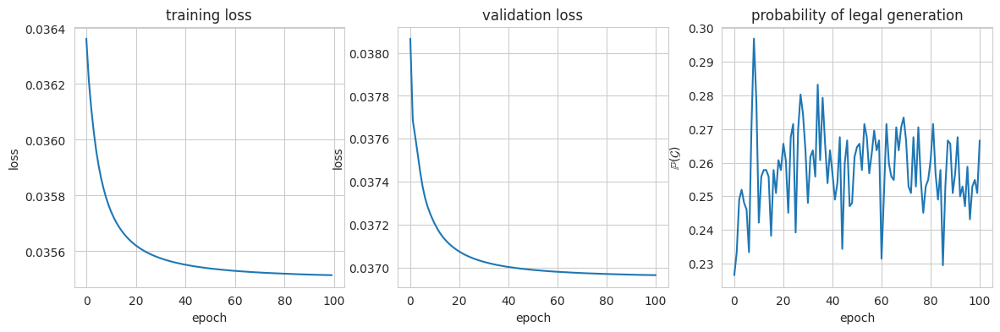

In [ ]:
import pytorch_lightning as pl
import copy
from matplotlib import pylab as plt
import seaborn as sns
sns.set_style('whitegrid')
import numpy as np


class TrainModel(pl.LightningModule):
    def __init__(self, model, *args, **kwargs):
        super().__init__(*args, **kwargs)
        self.model = copy.deepcopy(model)
        self.tot_train = 0
        self.train_losses = []
        self.train_batch_losses = []
        self.tot_val = 0
        self.val_losses = []
        self.val_batch_losses = []
        self.pg_batch = []
        self.pg = []

    def forward(self, x, y=None):
        return self.model(x, y)

    def training_step(self, batch, batch_idx):
        x, y = batch
        _, loss = self(x, y)
        self.train_batch_losses.append(loss.item() * y.size(0))
        self.tot_train += y.size(0)
        return loss

    def validation_step(self, batch, batch_idx):
        x, y = batch
        _, loss = self(x, y)
        self.val_batch_losses.append(loss.item() * y.size(0))
        self.pg_batch.append(prob_grammatical(self.model, x) * x.size(0))
        self.tot_val += y.size(0)

    def on_train_epoch_end(self):
        self.train_losses.append(sum(self.train_batch_losses) / self.tot_train)
        self.train_batch_losses = []
        self.tot_train = 0

    def on_validation_epoch_end(self):
        self.val_losses.append(sum(self.val_batch_losses) / self.tot_val)
        self.pg.append(sum(self.pg_batch) / self.tot_val)
        self.pg_batch = []
        self.val_batch_losses = []
        self.tot_val = 0

    def on_fit_end(self):
        plt.figure(figsize = (14,4))

        model.eval()
        plt.subplot(1, 3, 1)
        plt.plot(np.arange(len(self.train_losses)), self.train_losses)
        plt.xlabel('epoch')
        plt.ylabel('loss')
        plt.title('training loss')

        plt.subplot(1, 3, 2)
        plt.plot(np.arange(len(self.val_losses)), self.val_losses)
        plt.xlabel('epoch')
        plt.ylabel('loss')
        plt.title('validation loss')

        plt.subplot(1, 3, 3)
        plt.plot(np.arange(len(self.pg)), self.pg)
        plt.xlabel('epoch')
        plt.ylabel('$\\mathbb{P}(\\mathcal{G})$')
        plt.title('probability of legal generation')

    def configure_optimizers(self):
        optim = torch.optim.Adam(self.parameters(), lr=0.01)
        return optim


class ToyDatamodule(pl.LightningDataModule):
    def __init__(self, grammar, batch_size, *args, **kwargs):
        super().__init__(*args, **kwargs)
        self.grammar = grammar
        self.batch_size = batch_size

    def setup(self, stage: str):
        match stage:
            case 'fit':
                self.train_dataset = PCFGDataset(self.grammar)
                self.train_dataset.tensors = tuple(tensor.cuda() for tensor in self.train_dataset.tensors)
                self.val_dataset = PCFGDataset(self.grammar)
                self.val_dataset.tensors = tuple(tensor.cuda() for tensor in self.val_dataset.tensors)
            case 'test':
                self.test_dataset = PCFGDataset(self.grammar)
                self.test_dataset.tensors = tuple(tensor.cuda() for tensor in self.test_dataset.tensors)

    def train_dataloader(self):
        return DataLoader(self.train_dataset, self.batch_size)

    def val_dataloader(self):
        return DataLoader(self.val_dataset, self.batch_size)

    def test_dataloader(self):
        return DataLoader(self.test_dataset, self.batch_size)

from pytorch_lightning.callbacks import RichProgressBar


trainer = pl.Trainer(
    max_epochs = 100,
    enable_model_summary = False,
    enable_checkpointing=False,
    callbacks=[RichProgressBar()],
    log_every_n_steps = 1,
)
model = TrainModel(markov_model)
datamodule = ToyDatamodule(toy_grammar, 128)

trainer.fit(model, datamodule)

## Question D.2: Train a Transformer

*6 marks*

Now that we have evaluated the performance of our (rather naive) baseline model, let's build a shallow decoder-only transformer and see if it does better.

1. Define a shallow decoder-only transformer model using `torch` layer types. Start with the smallest model you think works.
1. Verify and demonstrate that your model uses causal attention correctly: Input at time $t$ should only influence output at time $s$ only if $t\leq s$. In the [RNN notes](https://hackmd.io/QrkitKUITGySbLAzkakzYw), we used backpropagation to check the influence of input at time $t$ on the output at time $T$ - this same idea can be used here.
1. Train the transformer model on the rainbows and unicorns language.
1. Evaluate the model, including $\mathbb{P}(\mathcal{G})$ and contrast with the Markov model.

Notes:
* A decoder-only transfomer is composed of token and position embeddings as the first operation, these are followed by causal transformer layers, finally a linear readout head outputs logits in the same format as the Markov-model.
* By causal transformer layer I mean one that contains a Masked Self-Attention layer (with a triangular mask so each token only aggregates information from the past but not the future), a feed forward layer, layer normalization and skip connections.
* The original transformer used layer normalization after the other operations, later it's been observed that it's better to normalize before the operations. The pytorch layers have a flag for this, you can try it both ways.
* Note that the `TransformerEncoderLayer` supports attention masking. The `TransformerDecoderLayer` also includes cross-attention which is not needed here. So although you're building a decoder-only model, you may find that `TransformerEncoderLayer` is the layer to use.
* I created the dataset so the first dimension of the tensors is the batch, the second dimension is position in the sequence. You may have to use the `batch_first` flag to tell layers to expect input in this format.
* If you really struggle with this, try a simpler dataset, or use an RNN or other architecture instead.

### Answer D.2:

### Answer D.2.1

I start by defining the model. I define a causal decoder-only model which uses a sinusoidal positional embedding. The depth of the model is a hyperparameter which I then pass in.

In [ ]:
import copy
import torch.nn as nn
import torch.nn.functional as F


class PositionalEmbedding(nn.Module):
    def __init__(self, embedding_dim: int, max_len: int = 128):
        super().__init__()
        self.embedding_dim = embedding_dim
        self.max_len = max_len

    def forward(self, x):
        positions = torch.zeros(x.size(-2), self.embedding_dim).cuda()
        positions[:, 0::2] = torch.sin(
            torch.arange(0, x.size(-2)).reshape(-1, 1) / (self.max_len ** (torch.arange(0, self.embedding_dim, 2).reshape(1, -1) / self.embedding_dim))
        )
        positions[:, 1::2] = torch.cos(
            torch.arange(0, x.size(-2)).reshape(-1, 1) / (self.max_len ** (torch.arange(0, self.embedding_dim - 1, 2).reshape(1, -1) / self.embedding_dim))
        )
        if x.dim() == 3:
            positions = positions.reshape(1, *positions.size())
        return x + positions

class ShallowTransformer(nn.Module):
    def __init__(self, vocab_size: int, embedding_dim: int = 3, nhead: int = 3, nlayer: int = 3, dim_feedforward: int = 32, pos_max_len: int = 128, dropout=0.2):
        super().__init__()

        # a constant embedding (randomly initialised)
        self.embedding = nn.Embedding(vocab_size, embedding_dim)

        # positional encoding
        self.position = PositionalEmbedding(embedding_dim, pos_max_len)

        # multihead attention + forward layer
        self.decoders = nn.ParameterList(
            [
                nn.TransformerEncoderLayer(d_model = embedding_dim, nhead = nhead, batch_first=True, dim_feedforward=dim_feedforward, dropout=dropout)
                for _ in range(nlayer)
            ]
        )
        self.fc = nn.Linear(embedding_dim, vocab_size)

    def forward(self, x):
        y = self.embedding(x)
        y = self.position(y)

        src_mask = nn.Transformer.generate_square_subsequent_mask(x.size(1), 'cuda')
        for decoder in self.decoders:
            y = decoder(y, is_causal=True, src_mask=src_mask)
        y = self.fc(y)
        return y

    def generate(self, x, num_new_tokens: int):
        x = x.clone().detach()
        for _ in range(num_new_tokens):
            x_new = self(x)
            x = torch.cat([x, torch.multinomial(F.softmax(x_new[:, -1, :], dim=-1), num_samples=1)], dim=1)
        return x


model = ShallowTransformer(toy_dataset.get_vocab_size()).cuda()

x, y = next(iter(val_loader))

# generations from an untrained network
model(x)
print('\n'.join(toy_dataset.decode_tensor(model.generate(x[:10, :1], 30))))

🦄🦄 🌈 🦄 🦄 🦄🦄 🌈 🦄 🦄 🦄  🦄🌈🦄🌈🦄🌈 🌈 🌈
🦄🌈  🦄 🦄 🦄 🌈🦄 🦄🌈 🦄 🦄   🦄🦄🌈 🦄 🌈🌈🦄
🦄🦄🌈 🦄  🌈 🦄 🦄 🌈🦄 🌈🌈 🌈🌈   🌈 🌈 🦄🦄 
🌈🦄 🦄🌈🦄 🌈🌈 🦄🦄 🌈🦄🦄 🦄  🦄🌈  🌈🌈🌈 🌈🦄 
🦄 🦄 🌈 🦄🌈 🦄🌈  🌈 🌈 🦄 🌈🌈🌈 🌈 🦄 🌈 🌈🦄
🌈 🦄 🌈🦄  🦄 🌈 🌈 🦄 🌈 🦄🦄🌈   🦄 🌈 🦄 🦄
🌈 🌈 🦄 🌈🦄  🦄 🌈 🌈🌈 🌈🦄🦄🦄 🦄🦄 🌈 🦄🦄 🌈
🌈🦄 🌈 🦄 🦄 🦄 🌈🦄 🌈 🌈🦄  🦄 🦄 🦄🦄 🦄  🦄
🦄🌈 🦄 🌈🦄 🦄🦄🦄 🦄 🦄🌈🌈   🌈🌈 🦄 🌈🌈 🦄 🦄
🌈 🌈 🦄🌈🌈🦄 🦄 🦄🌈 🦄 🦄   🦄 🦄 🦄🦄 🦄 🦄🦄


### Answer D.2.2

I now demonstrate causality in the model. I do this by randomly generating three batches sequences $x_1$, $x_2$ and $x_3$ with $x_2 \ne x_3$. With (untrained) model $m$, I fix random number generation and validate that:
$$
    \nabla_\theta m(x_1 \parallel x_2)[:, :|x_1|] = \nabla_\theta m(x_1 \parallel x_3)[:, :|x_1|]
$$
This demonstrates that the first $i$ outputs are *not affected* by the last $n - i$ outputs.

I then run a sanity-check to ensure that the inputs *do* affect the outputs by verifying that:
$$
    \nabla_\theta m(x_1 \parallel x_2) \ne \nabla_\theta m(x_1 \parallel x_3)
$$

To sanity-test, I then run this experiment 100 times.

In [ ]:
import pytorch_lightning as pl
import logging

# suppress 100 "set seed..." messages
log = logging.getLogger("lightning_fabric")
log.propagate = False
log.setLevel(logging.ERROR)


def causal_test(transformer: nn.Module, n: int = 100):
    """
    the core idea is that we have two sequences x₁ and x₂
    such that x₁[:i] = x₂[:i] and x₁[i:] != x₂[i:]
    we then evaluate the transformer on both to get y₁ and y₂
    then have a loss function dependent only on y₁[:i] and y₂[:i]
    we then backprop and check that the gradients in all weights are identical!
    as a sanity test, we then check that the gradients if we use a loss function dependent on all of y₁ and y₂ are NOT identical
    """

    # copy transformers
    transformer1 = copy.deepcopy(transformer)
    transformer2 = copy.deepcopy(transformer)

    # save current random seed for use in the tests
    for seed in torch.randint(2 ** 32 - 1, size=(n,)):
        # create x₁ and x₂
        x, y = next(iter(val_loader))
        x1 = torch.cat((x, torch.randint_like(x, torch.min(x).long(), torch.max(x).long())), dim=0)
        x2 = torch.cat((x, torch.randint_like(x, torch.min(x).long(), torch.max(x).long())), dim=0)

        # simple test
        assert not torch.equal(x1, x2), "The sequences were randomly initialised to the same vector"
        assert torch.equal(x1[:x.size(0)], x2[:x.size(0)]), "The sequences do not share a prefix"

        seed = seed.item()

        transformer1.zero_grad()
        transformer2.zero_grad()

        # backprop and check gradients are the same
        pl.seed_everything(seed)
        y1 = transformer1(x1)

        loss1 = y1[:x.size(0)].sum()
        loss1.backward()

        pl.seed_everything(seed)
        y2 = transformer2(x2)

        loss2 = y2[:x.size(0)].sum()
        loss2.backward()

        # use torch.allclose because floating point equality is unreliable
        # sometimes the gradients are ≈ 2e-7 apart in one parameter
        # I attribute this to floating point precision so have used a tolerance of 1e-5
        assert all(torch.allclose(param1.grad, param2.grad, atol=1e-5) for param1, param2 in zip(transformer1.parameters(), transformer2.parameters())), "Models are not causal!"

        transformer1.zero_grad()
        transformer2.zero_grad()

        # backprop and check gradients are different for different inputs
        pl.seed_everything(seed)
        y1 = transformer1(x1)

        loss1 = y1.sum()
        loss1.backward()

        pl.seed_everything(seed)
        y2 = transformer2(x2)

        loss2 = y2.sum()
        loss2.backward()
        assert any(not torch.allclose(param1.grad, param2.grad, atol=1e-5) for param1, param2 in zip(transformer1.parameters(), transformer2.parameters())), "Models are not dependent on the output"

    # return true if all n random tests passed
    return True


transformer = ShallowTransformer(toy_dataset.get_vocab_size()).cuda()
assert causal_test(transformer, n=100)

### Answer D.2.3 & D.2.4

I now train and evaluate the transformer model.

I start by training "the smallest model which works".

Then, I use optuna to search over model architectures and find the model which has the highest probability of generating a valid sequence.

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=50` reached.


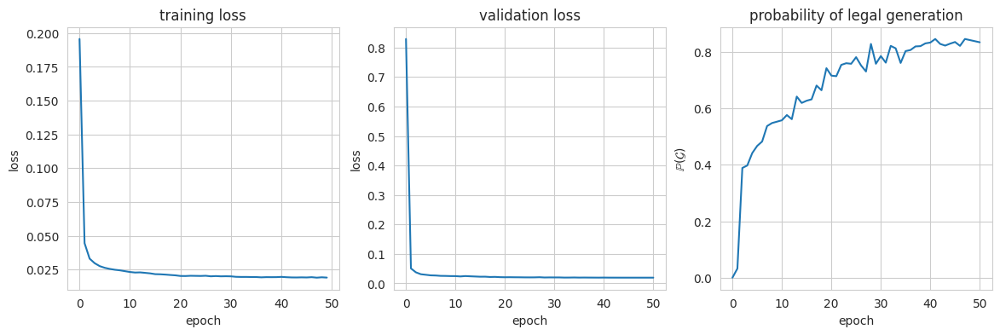

In [ ]:
import torch.nn.functional as F


# define the trainer for the transformer model
class TrainTransformerModel(pl.LightningModule):
    def __init__(self, model: nn.Module, max_epochs: int, *args, **kwargs):
        super().__init__(*args, **kwargs)
        self.model = model
        self.max_epochs = max_epochs
        self.tot_train = 0
        self.train_losses = []
        self.train_batch_losses = []
        self.tot_val = 0
        self.val_losses = []
        self.val_batch_losses = []
        self.pg_batch = []
        self.pg = []

    def forward(self, x, y=None):
        # proxy call onto the models forward function
        return self.model(x)

    def generate(self, *args, **kwargs):
        # proxy call onto the models generation
        return self.model.generate(*args, **kwargs)


    def training_step(self, batch, batch_idx):
        # return the crossentropy and log loss weighted by number of examples in the batch
        x, y = batch
        logits = self(x)
        loss = F.cross_entropy(logits.reshape(-1, logits.size(-1)), y.flatten())
        self.train_batch_losses.append(loss.item() * y.size(0))
        self.tot_train += y.size(0)
        return loss

    def validation_step(self, batch, batch_idx):
        # log crossentropy and validation probability
        x, y = batch
        logits = self(x)
        loss = F.cross_entropy(logits.reshape(-1, logits.size(-1)), y.flatten())
        self.val_batch_losses.append(loss.item() * y.size(0))
        self.pg_batch.append(prob_grammatical(self.model, x) * x.size(0))
        self.tot_val += y.size(0)

    def on_train_epoch_end(self):
        # log the loss for this batch -- sum of losses for each example in this epoch divided by the number of examples
        self.train_losses.append(sum(self.train_batch_losses) / self.tot_train)
        self.train_batch_losses = []
        self.tot_train = 0

    def on_validation_epoch_end(self):
        # log the loss for this batch -- sum of losses for each example in this epoch divided by the number of examples
        self.val_losses.append(sum(self.val_batch_losses) / self.tot_val)
        self.pg.append(sum(self.pg_batch) / self.tot_val)
        self.pg_batch = []
        self.val_batch_losses = []
        self.tot_val = 0

    def on_fit_end(self):
        # plot training and validation losses and generation probabilities
        plt.figure(figsize = (14,4))

        plt.subplot(1, 3, 1)
        plt.plot(np.arange(len(self.train_losses)), self.train_losses)
        plt.xlabel('epoch')
        plt.ylabel('loss')
        plt.title('training loss')

        plt.subplot(1, 3, 2)
        plt.plot(np.arange(len(self.val_losses)), self.val_losses)
        plt.xlabel('epoch')
        plt.ylabel('loss')
        plt.title('validation loss')

        plt.subplot(1, 3, 3)
        plt.plot(np.arange(len(self.pg)), self.pg)
        plt.xlabel('epoch')
        plt.ylabel('$\\mathbb{P}(\\mathcal{G})$')
        plt.title('probability of legal generation')

    def configure_optimizers(self):
        # use Adam with CosineAnnealing
        optim = torch.optim.Adam(self.parameters(), lr=0.01)
        scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optim, T_max=self.max_epochs)
        return [optim], [scheduler]


from pytorch_lightning.callbacks import RichProgressBar


max_epochs = 50

# arbitrary hyperparameters
transformer = ShallowTransformer(toy_dataset.get_vocab_size(), embedding_dim=32, dim_feedforward=32, nhead=4, nlayer=1, dropout=0.1).cuda()

model = TrainTransformerModel(transformer, max_epochs).cuda()
datamodule = ToyDatamodule(toy_grammar, batch_size=128)

trainer = pl.Trainer(
    max_epochs = max_epochs,
    enable_model_summary = False,
    enable_checkpointing=False,
    callbacks=[RichProgressBar()],
    log_every_n_steps = 1,
)
trainer.fit(model, datamodule)

We observe that this very simple transformer model is able to represent the function much better than the `DiscreteMarkovModel` was able to. Specifically, even with one layer, we are able to achieve a probability $\approx 0.85$ of generating a valid sequence. This demonstrates that the model has learnt the function very well.

Below, I output examples of sequences generated by the model. We see that *many* (but not all) of the sequences generated are valid sequences in the language -- and moreover that many are nontrivial and that the mdoel roughly follows the distribution of the dataset.

In [ ]:
# demonstrate the sequences generated by the "smallest model which works"
prefixes = toy_dataset[:20][0][:, :1].cuda()
model = model.cuda()
generated_tensor = model.generate(prefixes, 32)

print('\n'.join(toy_dataset.decode_tensor(generated_tensor)))

🌈🌈🌈🦄🦄🦄🦄🦄🌈🌈🌈🌈🌈                    
🦄                                
🌈🦄🦄🌈🌈                            
🌈🌈🦄🦄🌈🌈🌈🌈                         
🌈🦄🌈🌈🌈🌈                           
🌈🌈                               
🦄🦄🦄🦄🦄🦄🦄🦄🦄🦄                       
🌈🦄🦄🦄🌈🌈                           
🦄                                
🦄                                
🌈🌈🦄🦄🌈🌈🌈🌈                         
🌈🌈🌈🌈🌈🌈🌈🦄🌈🌈🌈                      
🦄🦄                               
🌈🌈🌈🦄🌈🌈🌈🌈🌈🌈                       
🦄                                
🦄                                
🦄🦄                               
🌈🦄🌈🌈                             
🦄                                
🦄🦄                               


To push the generalisation ability of the transformer on this dataset, I automate a hyperparameter search to find the *best* model which works. I find transformers which have probability $>0.9$ of generating valid sequences. I find that larger models with high dropout generally have the best performance; moreover I find that more heads makes a large impact.

In [ ]:
!pip install optuna > /dev/null

In [ ]:
import optuna

datamodule = ToyDatamodule(toy_grammar, 128)

# I observed that the model was sensitive to hyperparameters! I therefore decided to use optuna to run a hyperparameter search
class OptunaTrainTransformerModel(pl.LightningModule):
    def __init__(self, model: nn.Module, max_epochs: int, *args, **kwargs):
        super().__init__(*args, **kwargs)
        self.max_epochs = max_epochs
        self.model = model

    def forward(self, x, y=None):
        return self.model(x)

    def training_step(self, batch, batch_idx):
        x, y = batch
        logits = self(x)
        loss = F.cross_entropy(logits.reshape(-1, logits.size(-1)), y.flatten())
        return loss

    def configure_optimizers(self):
        optim = torch.optim.Adam(self.parameters(), lr=0.01)
        scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optim, T_max=self.max_epochs)
        return [optim], [scheduler]

    def generate(self, *args, **kwargs):
        return self.model.generate(*args, **kwargs)


def objective(trial):
    # to reduce the search space; I set embedding_dim = dim_feedforward; can only take values
    dims = trial.suggest_int('dims', 4, 6)

    nhead = trial.suggest_int('heads', 2, 4)

    # nlayer = 2--4
    nlayer = trial.suggest_int('layers', 2, 4)

    # dropout
    dropout = trial.suggest_float('dropout', 0.05, 0.4)

    max_epochs = 40 # observe convergence after 30-40 epochs

    transformer = ShallowTransformer(toy_dataset.get_vocab_size(), embedding_dim=2 ** dims, dim_feedforward=2 ** dims, nhead=2 ** nhead, nlayer=nlayer, pos_max_len=64).cuda()
    model = OptunaTrainTransformerModel(transformer, max_epochs).cuda()

    trainer = pl.Trainer(
        max_epochs = max_epochs,
        enable_model_summary = False,
        enable_checkpointing=False,
        callbacks=[],
        log_every_n_steps = 10000,
    )
    trainer.fit(model, datamodule)

    # probability of a correct generation is the metric we want to maximise
    nbatches = 16
    bsize = 128
    pg = 0
    for x in torch.randint(2, size=(nbatches, bsize, 1)).cuda():
        pg += prob_grammatical(transformer, x) / nbatches
    return pg


# for compute reasons I do not repeat after the initial run
# study = optuna.create_study(direction='maximize')
# study.optimize(objective, n_trials=50)
# print(study.best_params)
# print(optuna.importance.get_param_importances(study))

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=100` reached.


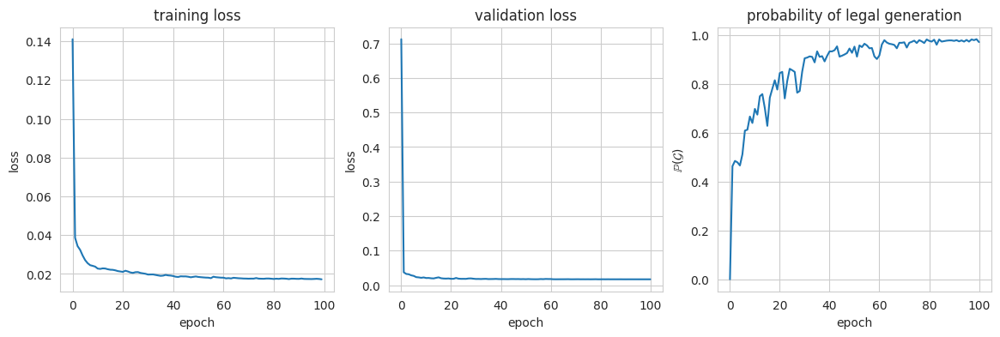

In [ ]:
# we observe that 64 dimensions with 16 heads, 2 layers and higher dropout leads to VERY high generation accuracy. I plug these hyperparameters into a model.
# since the model also has very low validation loss, I assert it is not overfitting the training data

# increase epochs for "good measure"
max_epochs = 100

transformer = ShallowTransformer(toy_dataset.get_vocab_size(), embedding_dim=64, dim_feedforward=64, nhead=16, nlayer=2, pos_max_len=64, dropout=0.35).cuda()

model = TrainTransformerModel(transformer, max_epochs).cuda()
datamodule = ToyDatamodule(toy_grammar, batch_size=128)

trainer = pl.Trainer(
    max_epochs = max_epochs,
    enable_model_summary = False,
    enable_checkpointing=False,
    callbacks=[RichProgressBar()],
    log_every_n_steps = 1,
)
trainer.fit(model, datamodule)

In [ ]:
prefixes = toy_dataset[:30][0][:, :1].cuda()
model = model.cuda()
generated_tensor = model.generate(prefixes, 32)

print('\n'.join(toy_dataset.decode_tensor(generated_tensor)))

🌈🌈🌈🦄🌈🌈🌈🌈🌈🌈                       
🦄                                
🌈🌈🦄🌈🌈🌈🌈                          
🌈🌈🌈🦄🦄🦄🌈🌈🌈🌈🌈🌈                     
🌈🌈🌈🌈🦄🌈🌈🌈🌈🌈🌈🌈🌈                    
🌈🌈🦄🦄🌈🌈🌈🌈                         
🦄🦄                               
🌈🦄🦄🌈🌈                            
🦄🦄                               
🦄🦄🦄🦄                             
🌈🦄🦄🌈🌈                            
🌈🌈🌈🦄🦄🦄🦄🌈🌈🌈🌈🌈🌈                    
🦄                                
🌈🦄🦄🦄🦄🦄🌈🌈                         
🦄🦄🦄🦄🦄                            
🦄🦄                               
🦄🦄🦄                              
🌈🌈🦄🌈🌈🌈🌈                          
🦄🦄                               
🦄                                
🌈🌈🦄🦄🌈🌈🌈🌈                         
🌈🦄🌈🌈                             
🦄                                
🦄🦄🦄🦄🦄                            
🦄🦄🦄🦄🦄🦄                           
🦄                                
🌈🦄🦄🦄🌈                            
🌈🌈🌈🌈🌈🌈🦄🦄🌈🌈🌈🌈🌈🌈🌈🌈🌈🌈🌈🌈             
🦄                                
🦄🦄🦄🦄          

#### Comparison to Markov Model

The markov model is only able to learn the model and achieve a 25-30% probability of valid generation. This is because it is not expressive enough to represent the generation function which is used for the model. Instead, we observe it quickly converges to a suboptimal solution which is the best approximation it can represent. We see that the Markov model learns properties such as "spaces always follow spaces" but is unable to learn the rule general $🌈^n🦄^m🌈^{2n}\_^*$.

While, the transformer converges to a *much* better solution -- with a probability of legal generation reaching 85% for the simple model and achieving over 90% for the larger model with tuned hyperparameters. This is because the *attention mechanism allows the transformer to look back at previous tokens and thus learn to approximate the true distribution much better*. In short: the transformer is *physically able to represent* the function we are learning because attention makes it very expressive.

This demonstrates that the transformer is a *much* more expressive model than the markov chain!

---

## Question D.3: Think like a Transformer, Generalize like a Transformer

*6 marks*

Introduced in [Thinking like Transformers](https://arxiv.org/abs/2106.06981), RASP is a lazy functional programming language that describes computations similar to what a transformer can implement. [RASPy](https://github.com/srush/raspy?tab=readme-ov-file) is a python implementation of this language.

1. Write three RASP programs, each outputting the probability that the next token is a 🌈, a 🦄, or a `" "`(used to denote end of sequence and as a padding character), respectively. For example, for the token sequence "🌈🌈🦄🦄🌈🌈🌈🌈" the three programs should output `[0.5, 0.5, 0.5, 0.5, 1.0, 1.0, 1.0, 0.0]` for the probability that the next token is 🌈, `[0.5, 0.5, 0.5, 0.5, 0.0, 0.0, 0.0, 0.0]` for the probability that the next token is 🦄, and `[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0]` for the probability that the next token is `" "`, respectively. Your RASP code should also be "causal", in that only tokens seen until time $t$ should influence the output at position $t$.
2. Test that your implementation produces valid probability values on valid inputs, and generate samples from your RASP language model.
3. Investigate what happens when you ask your Transformer, or your RASP language model to complete invalid prefixes, such as "🌈🦄🌈🦄". What does the Transformer do? What does your RASP language model do (you may need to renormalize probabilities so they sum to 1). What conclusions can you draw from this? Keep your answer compact.

### Answer D.3

### Answer D.3.1

In [ ]:
!pip install -qqq git+https://github.com/chalk-diagrams/chalk git+https://github.com/srush/RASPy > /dev/null

In [ ]:
import raspy as rp

I now implement the rasp programs. They all guarantee causality by the application of a causal mask. This can be seen visually by the fact that in every gird, the top right half is white.

In [ ]:
# function to get unicorn probabilities
def prob_unicorn(pretty=True):
    key = rp.key(rp.tokens)
    query = rp.query(rp.where(rp.tokens == '🦄', '#', '🦄'))
    attention = key == query
    causal_mask = rp.key(rp.indices) <= rp.query(rp.indices)

    # 1 iff not unicorn occuring after a unicorn
    mat = (attention & causal_mask).value(1)

    if pretty:
        mat = rp.where(mat > 0, 0, '½')  # ½ for presentation purposes
    else:
        mat = rp.where(mat > 0, 0, 0.5)
    return mat

# function to get blankspace probabilities
def prob_space(large=1000, pretty=True):
    # large is some big number -- larger than the longest sequence
    # search for unicorns
    causal_mask = rp.key(rp.indices) <= rp.query(rp.indices)
    before = rp.key(rp.indices) < rp.query(rp.indices)
    x = (rp.query('🦄') == rp.key(rp.tokens)) & causal_mask

    # replace with indices
    x = x.value(rp.indices)
    # send 0 to infinity!
    is_large = rp.where(x == 0, large, 0)
    x = x + is_large

    # get min index of unicorn
    x = ((rp.key(x) <= rp.query(x)) & before).value(1)
    x = x + is_large

    # we have the minimum index of any unicorn! We use this to count the rainbows!
    x = ((rp.key(x) == rp.query(0)) & causal_mask).value(rp.indices) + is_large
    # x is large if there are no unicorns; and the index of the first unicorn otherwise!

    # now we need to count the total number of rainbows!
    y = ((rp.key(rp.tokens) == rp.query('🌈')) & causal_mask).value(1)

    # now check whether we have exactly three times as many rainbows as occurred before the first unicorn
    pspace = rp.where(y == x + x + x, 1, 0)

    # add a special case for when there are zero rainbows
    if pretty:
        pspace = rp.where((y == 0) & (rp.tokens == '🦄'), '½', rp.where((y == 0) & (rp.tokens == ' '), 1, pspace))
    else:
        pspace = rp.where((y == 0) & (rp.tokens == '🦄'), 0.5, rp.where((y == 0) & (rp.tokens == ' '), 1, pspace))

    return pspace

# function to get rainbow probabilities
def prob_rainbow(large=1000, pretty=True):
    # "1 - p(unicorn) - p(blankspace)"
    p = (rp.key(rp.indices) == rp.query(rp.indices)).value(1) - (prob_unicorn(pretty=False) + prob_space(large, pretty=False))
    if pretty:
        return rp.where(p == 0.5, '½', p)
    else:
        return p

Observe that the probabilities generated match the desired probabilities!

In [ ]:
prob_rainbow().input('🌈🌈🦄🦄🌈🌈🌈🌈')

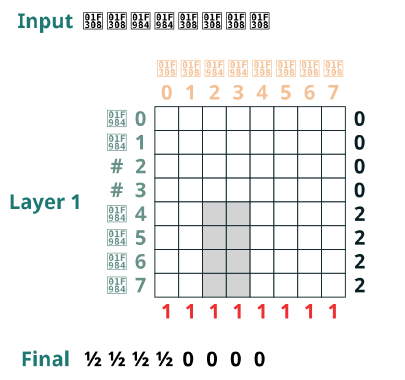

In [ ]:
prob_unicorn().input('🌈🌈🦄🦄🌈🌈🌈🌈')

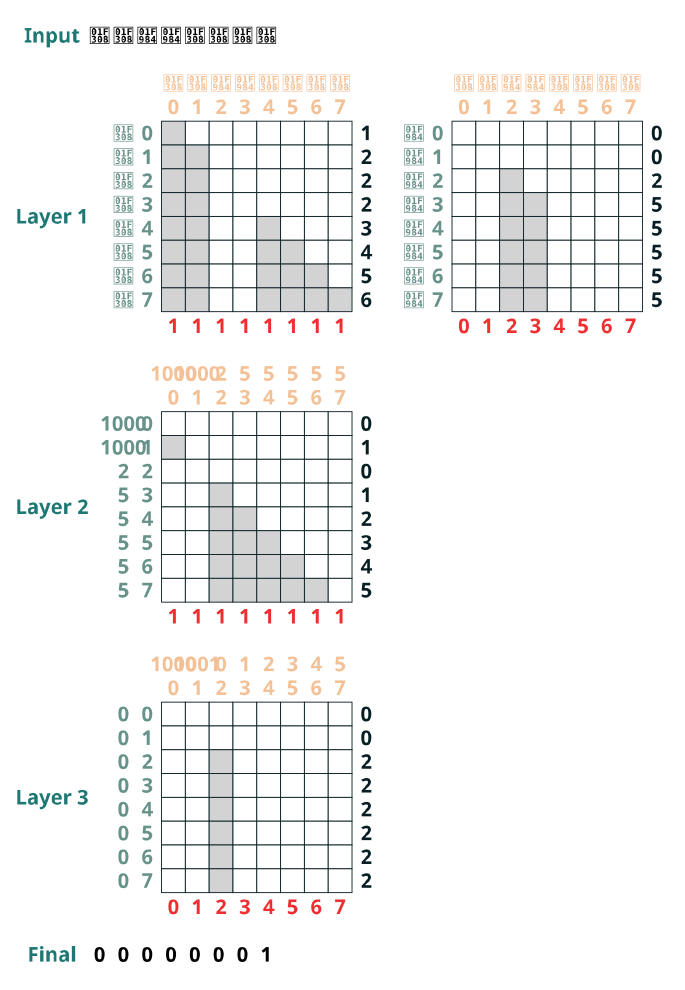

In [ ]:
prob_space().input('🌈🌈🦄🦄🌈🌈🌈🌈')

### Answer D.3.2

- define a language model which uses RASP to generate probabilities -- it proxies forward onto the RASP functions defined above
- evaluate this language model on thee *entire* rainbows and unicorns validation dataset
- check that probabilities are all nonzero, sum to one and the probability of the *correct* prediction is always nonzero
- use RASPLM to generate sequences

In [ ]:
import random

class RASPLM(nn.Module):
    def __init__(self, maxlen=128):
        super().__init__()
        # precompile the computation graphs
        self.rainbow = prob_rainbow(large=10 * maxlen, pretty=False)
        self.unicorn = prob_unicorn(pretty=False)
        self.space = prob_space(large = 10 * maxlen, pretty=False)

    def forward(self, x: str):
        # return value is the rainbow and unicorn function defined above
        return list(zip(self.rainbow.input(x).toseq(), self.unicorn.input(x).toseq(), self.space.input(x).toseq()))

    def generate(self, xs: list[str], gen_len):
        # generation chooses randomly using the probabilities of each token as weights
        ys = []
        for x in xs:
            y = x
            for _ in range(gen_len):
                y = y + random.choices(['🌈', '🦄', ' '], weights=lm(y)[-1], k=1)[0]
            ys.append(y)
        return ys

In [ ]:
lm = RASPLM()
broken = False
ϵ = 0.00001 # avoid floating point equality
for i, (x, y) in enumerate(val_loader):
    for j, (seq, next_seq) in enumerate(zip(toy_dataset.decode_tensor(x), y)):
        lmseq = lm(seq)
        for char_p, next_char in zip(lmseq, next_seq):
            assert abs(sum(char_p) - 1) < ϵ
            assert abs(char_p[next_char]) > ϵ
            assert all(c > -ϵ for c in char_p)
# thus we have RASPLM has the following properties (on valid data):
# - probabilities which sum to 1
# - nonzero probability of the true character
# - no negative probabilities

In [ ]:
import random

# observe the RASPLM only generates valid sequences!
# and it generates sequences according to the same distibution as the data generation process

lm = RASPLM()
num_sequences = 20
length = 30
prefixes = [*('🌈' for _ in range(num_sequences // 2)), *('🦄' for _ in range(num_sequences // 2))]
gen_seq = []
print('\n'.join(lm.generate(prefixes, 30)))

🌈🌈🌈🦄🦄🦄🦄🌈🌈🌈🌈🌈🌈                  
🌈🌈🦄🦄🦄🦄🦄🦄🌈🌈🌈🌈                   
🌈🌈🦄🌈🌈🌈🌈                        
🌈🌈🌈🦄🌈🌈🌈🌈🌈🌈                     
🌈🦄🦄🦄🌈🌈                         
🌈🌈🌈🦄🌈🌈🌈🌈🌈🌈                     
🌈🦄🌈🌈                           
🌈🦄🦄🦄🌈🌈                         
🌈🌈🦄🌈🌈🌈🌈                        
🌈🌈🦄🦄🌈🌈🌈🌈                       
🦄🦄🦄🦄                           
🦄                              
🦄🦄🦄🦄                           
🦄                              
🦄🦄                             
🦄🦄🦄                            
🦄🦄🦄🦄                           
🦄🦄                             
🦄🦄                             
🦄                              


We observe that the RASPLM generates only valid strings; and that the distribution of the strings generated seems to well-match the distribution of the strings generated by the original data generation process.

### Answer D.3.3

In [ ]:
# generate invalid prefixes and iterate if any happen to be valid

import random

n_sequences = 30
gen_length = 15

randseq = torch.randint(3, (n_sequences, 5)).cuda()


def any_valid(randseq):
    valid = torch.zeros(randseq.size(0))
    for i, seq in enumerate(randseq):
        r = torch.count_nonzero(randseq == 0).item()
        u = torch.count_nonzero(randseq == 1).item()
        s = torch.count_nonzero(randseq == 2).item()
        valid[i] = (r % 3 == 0) and torch.all(seq[:r // 3] == 0) and torch.all(seq[r // 3:u + r // 3] == 1) and torch.all(seq[u + r // 3:u + r] == 1) and torch.all(seq[u + r:] == 2)
    return valid

# guarantee that *no* prefixes are valid
valid = any_valid(randseq)
while torch.any(valid):
    randseq[valid] = torch.randint_like(randseq[valid], 3)
    valid = any_valid(randseq)

print('\n'.join(toy_dataset.decode_tensor(model.generate(randseq, 15))))

🌈🦄  🌈🦄🦄🌈            
🦄🌈🦄🌈🌈               
🦄🌈🦄🌈                
🦄🌈🦄🌈                
 🦄🌈 🌈               
🌈🌈 🦄🦄🌈🌈🌈🌈🌈🌈🌈        
🌈🌈  🌈🦄🦄🌈🌈🌈🌈🌈🌈🌈      
 🌈                  
🌈 🦄🌈                
🦄🦄🌈🌈🦄               
🌈🌈🌈 🌈🦄🦄🌈🌈🌈🌈🌈🌈🌈      
  🦄🦄                
🦄🦄🌈🦄🌈               
🌈 🌈 🌈🌈🌈🌈🦄🌈🌈🌈🌈🌈🌈🌈🌈🌈🌈🌈
🦄🌈🦄🦄🌈               
🌈  🌈🦄🦄🦄🌈🌈🦄🌈🌈🌈       
🦄🦄🦄 🦄               
🌈🦄 🦄🦄🌈🌈🌈🌈           
🌈🦄🦄                 
🌈🦄  🌈🦄🦄🌈            
🌈 🌈 🦄🌈🌈🌈🌈🦄🌈🌈🌈       
   🦄🌈🌈🌈🌈            
🦄🦄 🌈🦄               
🦄 🌈🌈🦄               
🌈 🦄 🌈🦄🌈🦄            
🦄🌈 🦄                
🦄 🌈🌈🌈🌈              
   🦄                
 🦄  🌈               
 🌈🌈🦄🦄🌈🌈🦄🦄🌈🌈🌈🌈🌈🌈     


In [ ]:
import random

# redefine the model to explicitly normalise
class RASPLM(nn.Module):
    def __init__(self, maxlen=128):
        super().__init__()
        self.rainbow = prob_rainbow(large=10 * maxlen, pretty=False)
        self.unicorn = prob_unicorn(pretty=False)
        self.space = prob_space(large = 10 * maxlen, pretty=False)

    def forward(self, x: str):
        return list(zip(self.rainbow.input(x).toseq(), self.unicorn.input(x).toseq(), self.space.input(x).toseq()))

    def generate(self, xs: list[str], gen_len):
        ys = []
        for x in xs:
            y = x
            for _ in range(gen_len):
                # add explicit normalisation
                # if there is some p < 0 then subtract it from all other probabilities (i.e. make it the new zero)
                # then normalise by the sum of all probabilities
                ws = lm(y)[-1]
                lo = min(ws)
                if lo < 0:
                    ws = [w - lo for w in ws]
                ps = [w / sum(ws) for w in ws]
                y = y + random.choices(['🌈', '🦄', ' '], weights=ps, k=1)[0]
            ys.append(y)
        return ys

lm = RASPLM()

print('\n'.join(lm.generate(toy_dataset.decode_tensor(randseq), 15)))

🌈🦄  🌈🌈              
🦄🌈🦄🌈🌈🌈🌈🌈            
🦄🌈🦄🌈 🌈🌈🌈🌈           
🦄🌈🦄🌈 🌈🌈🌈🌈           
 🦄🌈 🌈🌈              
🌈🌈 🦄🦄🌈🌈🌈🌈🌈🌈🌈        
🌈🌈  🌈🦄🌈🌈🌈🌈🌈🌈🌈🌈🌈🌈🌈🌈  
 🌈   🦄🦄🌈🌈🌈🌈🌈🌈🌈🌈🌈🌈🌈🌈🌈
🌈 🦄🌈 🌈🌈🌈🌈           
🦄🦄🌈🌈🦄🌈              
🌈🌈🌈 🌈🦄🌈🌈🌈🌈🌈🌈🌈🌈🌈🌈🌈   
  🦄🦄                
🦄🦄🌈🦄🌈🌈              
🌈 🌈 🌈🦄🦄🌈🌈🌈🌈🌈🌈🌈🌈🌈🌈🌈🌈 
🦄🌈🦄🦄🌈🌈🌈🌈🌈           
🌈  🌈🦄🦄🌈🌈🌈🌈🌈🌈🌈🌈🌈🌈    
🦄🦄🦄 🦄               
🌈🦄 🦄🦄🦄🌈🌈            
🌈🦄🦄  🌈🌈             
🌈🦄  🌈🌈              
🌈 🌈 🦄🌈🌈🌈🌈🌈🌈🌈🌈🌈🌈     
   🦄🌈🌈🌈🌈🌈🌈🌈🌈🌈       
🦄🦄 🌈🦄🌈🌈             
🦄 🌈🌈🦄🌈🌈🌈🌈🌈🌈🌈🌈🌈🌈     
🌈 🦄 🌈🌈🌈🌈🌈           
🦄🌈 🦄 🌈🌈🌈🌈🌈🌈🌈🌈       
🦄 🌈🌈🌈🌈🌈🌈🌈🌈🌈🌈🌈🌈🌈🌈🌈🌈🌈🌈
   🦄                
 🦄  🌈🌈🌈             
 🌈🌈🦄🦄🌈🌈🌈🌈🌈🌈🌈        


#### Conclusions

The transformer often quickly terminates invalid sequences with spaces.

The RASPLM continues sequences of spaces; but otherwise often predicts 🌈.

The sequences generated by the transformer and by RASP are very different. This indicates that although the transformer *can* learn the function computed by RASPLM; it does not learn the exact same function.

In [ ]:
%reset -f

---

# E: Mini-Project

*40 marks*

Please **choose one** of the proposed mini-project options below. Add as many text and code cells under the heading as you'd like. You may attempt more than one, but we will only mark one: please write below which mini-project you'd like to get marked on:

**I would like my solution for mini-project "E.2: Needle in a Haystack" to be marked.**

## E.1: The Natural Next Step

In Assignment 1, you explored the importance of parametrizations of DNNs. Different parametrizations can behave differently under gradient descent and may lead to qualitatively different solutions. In this mini-project, you will look at how we can further understand, mitigate or remove the influence of parametrization.

This mini-project option is **more theory-focussed**, and asks you to experiment with Natural Gradient Descent (NGD) and related methods. We provide you with [some notes on NGD](https://hackmd.io/@fhuszar/H1-t95X3T) and some resources linked from there that explain how it is derived.

### Questions to Explore

You should not do all of these (you will notice they add up to more than 40 marks), these are just given as indication of the number of marks awarded for certain amount of work. You should 'build your own miniproject'.

* Explore Adaptive Learning Rates *(~10 marks)*
  * In Question A.5 of Assignment 1, you explored how using different optimizers affects training from equivalent initialisations. If you used Adam, you should have observed a smaller difference effect than when using SGD. *Discuss/illustrate mathematically why this happens. Can you design and implement a new optimiser based on your observations that is uneffected by the reparametrisation in A.5.2? Can you connect this to NGD?
*  Implement NGD for the toy problem in A.5 *(~30 marks for thorough solution)*
  * Follow the outline of the algorithm given in the notes, implement NGD. Use your algorithm on the toy task from Question A.5 and show that NGD displays invariance to reparametrisation. A couple notes:
    * There are multiple ways to compute the Fisher information matrix or the natural gradient. Your implementation does **not** need to be super efficient, but if you choose a very inefficient version, perhaps comment on how it could be made more efficient, or what the main bottlenecks are.
    * It's fine if you implement NGD specifically for this shallow MLP architecture, and if it does not work generally for arbitrary architectures. That said, we do encourage you to think about using generic automatic differentiation tools.
* Try an [open source implementation](https://github.com/n-gao/pytorch-kfac) of an optimizer like K-FAC. Reason about whether K-FAC is invariant to this specific kind of reparametrization in this specific architecture. *(~15 marks for a thorough exploration)*
* Prove the invariance of Natural Gradient Flow under smooth, differentiable reparametrisations *(~10 marks)*
* Discuss or illustrate the merits of using Fisher information averaged over test vs training data. *(max ~10 marks)*

## E.2 Needle in a Haystack

Modern language models can handle increasingly long context length (longest prefix sequence the model can ingest and probability distribution of the next token). How do we know the model can efficiently handle such a long context?
In the [Needle In A Haystack (NIAH) ](https://github.com/gkamradt/LLMTest_NeedleInAHaystack) evaluation a small piece of text containing a specific fact or secret is placed within a long block of text, and the model is prompted to retrieve this fact. A good model should perform accurately irrespective of how long this block of thext is, and where the fact is embedded in it.

In this more **engineering-focussed** mini-project you will study models using a toy problem that follows the needle-in-a-haystack paradigm, and evaluate various small neural networks on how well they perform at this task.

### Questions you can explore:

You should not do all of these (you will notice they add up to more than 40 marks), these are just given as indication of the number of marks awarded for certain amount of work. You should 'build your own miniproject'.

* Create toy dataset(s) where in each example some information (needle) is embedded inside a longer random string (haystack) in some non-ambiguous way, and the goal is to retrieve the needle from the haystack. The task should not be too trivial or too difficult, and it's fine to use a simple setting such as binary strings or PCFGs. It is up to you to specify the problem further. *(max ~5 marks)*
* Train a model and evaluate its performance as a function of haystack size and needle location within the haystack, generating a plot similar to NIAH evaluation. Investigate length extrapolation: How well does the trained model do when evaluated on longer contexts than it has seen during training. *(max ~5 marks)*
* Train and compare multiple different architectures (RNNs, 1D ConvNets). Illustrate
and discuss strengths and weaknesses of each for this kind of task *(max ~10 marks)*
* Use RASP to implement the needle retrieval task, demonstrate that your code works. *(max ~10 marks)*
* Hardwire a solution into a neural network that solves the needle-in-a-haystack retrieval task *(max ~10 marks)*
* Implement [efficient transformer](https://arxiv.org/abs/2009.06732) layer(s) of your choice that allow for higher context windows, and demonstrate their performance on your NIAH toy task. *(~20 marks for a very thorough treatment)*
* Implement an adversarial attack showing that embedding certain distractors in the haystack can hurt (or help) retrieval of the needle. *(~15 marks for a thorough treatment)*

### E.2 Outline

My miniproject aims to investigate the *expressive power* of sequence classification models in comparison to the power of finite automata; with the high-level aim of lower-bounding the languages these sequence classification models can recognise in the Chomsky Hierarchy. Specifically, I create needle-in-a-haystack toy datasets containing needles which are regular; context free; and context sensitive with the aim of determining which models are able to learn to approximate the corresponding DFA/PDA/LBFAs and generalise well.

#### Work Completed

- Created 3 datasets, with progressively more difficult-to-recognise needles
- Trained a RNN, GRNN and Transformer on each of these datasets
- Used RASP to hardcode the retrieval task for the first two datasets
- Hardcoded a solution into an RNN for the first two datasets
- Implemented Linformer and Sparse Transformer
- Implemented adversarial attacks against the sequence-to-sequence models

I train transformers, RNNs and GRNNs on the datasets and show which are; and are not able to recognise the languages.

After empirical results, I set out to provide semi-formally demonstrate lower bounds on the power of the ML models by explicitly providing constructions (and RASP programs) which perfectly recognise the toy datasets I create.

An important question for transformers is whether efficient transformer approximations limit the expressive power of the transformer. To determine this, I implement and repeat my evaluation for two types of efficient transformer architectures: sparse transformers and linformers.

Finally, to demonstrate that the evaluated architectures are *actually* learning the desired representations, I use techniques from adversarial ML to search for adversarial examples; and adversarial suffixes which I use to evaluate the robustness of the models.

## Datasets

#### High-level Summary

I design dictionary lookup tasks with keys belonging to increasingly more complex languages in higher formal grammars.
- The first datasets key is regular and can be recognised by a DFA
- The second datasets key is context free can be recognised by a PDA but not a DFA
- The third datasets key is context sensitive and can be recognised by a LBFA but not a PDA

#### Dataset Specification

These datasets are designed to be *minimal* examples which require features not learnable by lower-level automaton whilst simultaneously being simple enough to be easy-to-generate.

The key for the ith dataset is:
1. A random sequence of characters containing key $🔑$ which occurs once. The model should output the symbol immediately after this key. *i.e.* $ABABCAB🔑CBA \mapsto C$
2. A random sequence of characters containing a key of the form $🗝️^n🔑^n$ where $🔑$ and $🗝️$ can occur elsewhere in the dataset -- but there is only one sequence matching $🗝️^n🔑^n$ (without preceding $🗝️$s) for $n, m \ge 1$. *i.e.* $AB🗝️🗝️🔑ABCAB🗝️🗝️🔑🔑CBA \mapsto C$
3. A random sequence of characters containing a key of the form $🗝️^n🔑^n🗝️^n$ where $🔑$ and $🗝️$ can occur elsewhere in the dataset -- but there is only one sequence matching $🗝️^n🔑^n🗝️^n$ (without preceding $🗝️$s). *i.e.* $AB🗝️🗝️🔑🗝️🗝️ABCAB🗝️🗝️🔑🔑🗝️🗝️CBA \mapsto C$

#### Implementation Summary

The datasets are all of length `seqlength` with no filler characters. All datasets consist of a random sequence of bits with the key inserted in a random position chosen uniformly.

For the more complicated datasets; PDADataset and LBFADataset, I then implement a vectorised PDA and LBFA respectively which walks through the dataset and removes any random occurrences of valid keys elsewhere in the dataset.

In [ ]:
from torch.utils.data import TensorDataset
import torch

# dictionary lookup dataset with a key 🔑 belonging to a regular language
class DFADataset(TensorDataset):
    tensors: tuple[torch.Tensor, ...]
    num_classes = 5

    def __init__(self, n_samples:int=1024, seqlength:int=128, pos: tuple[int, int]=None) -> None:
        X = torch.randint(4, (n_samples, seqlength))

        if pos is None:
            # key is in a random position
            I = torch.randint(seqlength - 1, (n_samples, 1))
        else:
            # key is in the range [pos[0], pos[1]]
            I = torch.randint(*pos, (n_samples, 1))
        X[torch.arange(n_samples), I.flatten()] = 4

        # target is the symbol immediately following the key if the key is present; else 4
        Y = ((torch.ones_like(X) * torch.arange(seqlength).reshape(1, -1) <= I) * 4) + ((torch.ones_like(X) * torch.arange(seqlength).reshape(1, -1) > I) * X[torch.arange(n_samples), I.flatten() + 1].reshape(-1, 1))

        self.tensors = (X, Y)

In [ ]:
# dictionary lookup dataset with a key 🗝️^n🔑^n belonging to a context free language
class PDADataset(TensorDataset):
    tensors: tuple[torch.Tensor, ...]
    num_classes = 6

    def __init__(self, n_samples:int=1024, seqlength:int=128, pos: tuple[int, int]=None, mu:int=2,) -> None:
        X = torch.randint(5, (n_samples, seqlength))

        # n, m ~ Exp(1/mu)
        n = torch.clamp((mu * torch.Tensor.exponential_(torch.ones(n_samples, 1))).long(), torch.tensor(1), torch.tensor(seqlength // 2 - 1))

        # generate a legal position to start the key
        if pos is None:
            # initial position of the key is a random position anywhere in the sequence
            I = (torch.rand(n_samples, 1) * (seqlength - 2 * n)).floor().long().reshape(-1, 1)
        else:
            # initiala position of the key is in [pos[0], pos[1]]
            I = torch.clamp(torch.randint(*pos, (n_samples, 1)), torch.tensor(0), (seqlength - 2 * n - 1)).reshape(-1, 1)

        # create sequences of the form 🗝️^n🔑^n
        arr = torch.arange(seqlength).reshape(1, -1).expand(n_samples, seqlength)

        X[(I <= arr) & (arr < I + n)] = 3
        X[(I + n <= arr) & (arr < I + 2 * n)] = 4

        # remove spurious prepended sequences
        X[(0 <= arr) & (arr == I - 1)] = torch.randint_like(X[(0 <= arr) & (arr == I - 1)], 3)

        cnt = torch.zeros(n_samples, dtype=torch.long)
        state = torch.zeros(n_samples, dtype=torch.long)
        label = torch.full((n_samples, ), 5)

        # run a vectorised state machine, which recognises the key and removes spurious sequences of the form 🗝️^n🔑^m by re-randomising the nth 🔑
        for i in range(seqlength):
            # case 0,1,2
            mask = X[:, i] <= 2
            cnt[mask] = 0
            state[mask] = 0

            # case 3
            mask = (X[:, i] == 3)
            cnt[mask & (state != 1)] = 0
            state[mask] = 1
            cnt[mask] += 1

            # case 4
            state[(X[:, i] == 4) & (state == 1)] = 2
            cnt[state == 2] -= 1

            # spurious sequence of the form 🗝️^n🔑^n
            spurious = (X[:, i] == 4) & (state == 2) & (cnt == 0) & (i != I + 2 * n - 1).flatten()
            state[spurious] = 0
            cnt[spurious] = 0
            X[spurious, i] = torch.randint_like(X[spurious, i], 3)

        # the key is the symbol immediately following the sequence of the form 🗝️^n🔑^n and is 5 if the key is not present yet
        Y = (arr >= I + 2 * n) * X[torch.arange(n_samples), (I + 2 * n).flatten()].reshape(-1, 1)
        Y[arr < I + 2 * n] = 5

        self.tensors = (X, Y)

In [ ]:
# dictionary lookup dataset with a key 🗝️^n🔑^n🗝️^n belonging to a context free language
class LBFADataset(TensorDataset):
    tensors: tuple[torch.Tensor, ...]
    num_classes = 6

    def __init__(self, mu:int=2, n_samples:int=1024, seqlength:int=128, pos: tuple[int, int]=None) -> None:
        X = torch.randint(5, (n_samples, seqlength))

        # n, m ~ Exp(1/3)
        n = torch.clamp((mu * torch.Tensor.exponential_(torch.ones(n_samples, 1))).long(), torch.tensor(1), torch.tensor(seqlength // 3 - 1))

        # generate a legal position to start the key
        if pos is None:
            I = (torch.rand(n_samples, 1) * (seqlength - 3 * n)).floor().long().reshape(-1, 1)
        else:
            I = torch.clamp(torch.randint(*pos, (n_samples, 1)), torch.tensor(0), (seqlength - 3 * n - 1)).reshape(-1, 1)

        # create sequences of the form 🗝️^n🔑^m
        arr = torch.arange(seqlength).reshape(1, -1).expand(n_samples, seqlength)
        X[(I <= arr) & (arr < I + n)] = 3
        X[(I + n <= arr) & (arr < I + 2 * n)] = 4
        X[(I + 2 * n <= arr) & (arr < I + 3 * n)] = 3

        # remove spurious prepended sequences
        X[(0 <= arr) & (arr == I - 1)] = torch.randint_like(X[(0 <= arr) & (arr == I - 1)], 3)

        cnt1 = torch.zeros(n_samples, dtype=torch.long)
        cnt2 = torch.zeros(n_samples, dtype=torch.long)
        cnt3 = torch.zeros(n_samples, dtype=torch.long)
        state = torch.zeros(n_samples, dtype=torch.long)

        # run a vectorised state machine, removing spurious sequences of the form 🗝️^n🔑^n🗝️^n by re-randomising the 2nth 🗝️
        for i in range(seqlength):
            # state 0
            mask = (state == 0) & (X[:, i] != 3)
            cnt1[mask] = 0
            cnt2[mask] = 0
            cnt3[mask] = 0
            state[mask] = 0

            mask = (state == 0) & (X[:, i] == 3)
            state[mask] = 1
            cnt1[mask] = 1

            # state 1
            mask = (state == 1) & (X[:, i] <= 2)
            state[mask] = 0
            cnt1[mask] = 0

            mask = (state == 1) & (X[:, i] == 3)
            cnt1[mask] += 1

            mask = (state == 1) & (X[:, i] == 4)
            cnt2[mask] = 1
            state[mask] = 2

            # state 2
            mask = (state == 2) & (X[:, i] <= 2)
            state[mask] = 0
            cnt1[mask] = 0
            cnt2[mask] = 0

            mask = (state == 2) & (X[:, i] == 3)
            state[mask] = 3
            cnt3[mask] = 1

            mask = (state == 2) & (X[:, i] == 4)
            cnt2[mask] += 1

            # state 3
            mask = (state == 3) & (X[:, i] <= 2)
            state[mask] = 0
            cnt1[mask] = 0
            cnt1[mask] = 0
            cnt3[mask] = 0

            mask = (state == 3) & (X[:, i] == 3)
            cnt3[mask] += 1

            mask = (state == 4) & (X[:, i] == 4)
            state[mask] = 2
            cnt1[mask] = cnt3[mask]
            cnt2[mask] = 1
            cnt3[mask] = 0

            # spurious sequence of the form 🗝️^n🔑^n🗝️^n
            mask = (cnt1 == cnt2) & (cnt2 == cnt3) & (cnt1 > 0) & (i != I + 3 * n - 1).flatten()
            state[mask] = 0
            cnt1[mask] = 0
            cnt2[mask] = 0
            cnt3[mask] = 0
            X[mask, i] = torch.randint_like(X[mask, i], 3)

        Y = (arr >= I + 3 * n) * X[torch.arange(n_samples), (I + 3 * n).flatten()].reshape(-1, 1)
        Y[arr < I + 3 * n] = 5

        self.tensors = (X, Y)

## Models

For initial evaluation of the expressive power, I construct models. I start my investigation with an RNN, a GRNN and a transformer.

In [ ]:
import torch.nn as nn


class SimpleRNN(nn.RNN):
    def __init__(self, in_dims:int = 5, out_dims:int = 5, nlayer: int = 2, dim: int = 64):
        super().__init__(input_size = dim, hidden_size = dim, num_layers = nlayer, nonlinearity='relu', batch_first=True)
        # relu nonlinearity is chosen since its easier to hardcode later

        self.embedding = nn.Embedding(num_embeddings=in_dims, embedding_dim=dim)

        self.fc = nn.Linear(dim, out_dims)

    def forward(self, x):
        self.flatten_parameters()
        return self.fc(super().forward(self.embedding(x))[0])

In [ ]:
class SimpleGRNN(nn.GRU):
    def __init__(self, in_dims: int = 5, out_dims: int = 5, nlayer: int = 2, dim: int = 64):
        super().__init__(input_size = dim, hidden_size = dim, num_layers = nlayer, batch_first=True)
        self.embedding = nn.Embedding(num_embeddings=in_dims, embedding_dim=dim)

        self.fc = nn.Linear(dim, out_dims)

    def forward(self, x):
        self.flatten_parameters()
        return self.fc(super().forward(self.embedding(x))[0])

In [ ]:
import torch.nn.functional as F


class PositionalEmbedding(nn.Module):
    def __init__(self, embedding_dim: int, max_len: int = 128):
        super().__init__()
        self.embedding_dim = embedding_dim
        self.max_len = max_len

    def forward(self, x):
        positions = torch.zeros(x.size(-2), self.embedding_dim).to('cpu' if x.get_device() == -1 else x.get_device())
        positions[:, 0::2] = torch.sin(
            torch.arange(0, x.size(-2)).reshape(-1, 1) / (self.max_len ** (torch.arange(0, self.embedding_dim, 2).reshape(1, -1) / self.embedding_dim))
        )
        positions[:, 1::2] = torch.cos(
            torch.arange(0, x.size(-2)).reshape(-1, 1) / (self.max_len ** (torch.arange(0, self.embedding_dim - 1, 2).reshape(1, -1) / self.embedding_dim))
        )
        if x.dim() == 3:
            positions = positions.reshape(1, *positions.size())
        return x + positions


class SimpleTransformer(nn.Module):
    def __init__(self, in_dims:int = 5, out_dims:int = 5, nlayer=3, dim=64, nhead=4, maxlen=128):
        super().__init__()
        self.embedding = nn.Embedding(num_embeddings=in_dims, embedding_dim=dim)
        self.positional_embedding = PositionalEmbedding(embedding_dim=dim, max_len=maxlen)
        self.decoders = nn.ParameterList(
            (
                nn.TransformerEncoderLayer(nhead=nhead, d_model = dim, dim_feedforward=dim, batch_first=True)
                for _ in range(nlayer)
            )
        )
        self.fc = nn.Linear(dim, out_dims)

    def forward(self, x):
        y = self.embedding(x)
        y = self.positional_embedding(y)
        src_mask = nn.Transformer.generate_square_subsequent_mask(x.size(1), 'cuda')
        for decoder in self.decoders:
            y = decoder(y, is_causal=True, src_mask=src_mask)
        y = self.fc(y)
        return y

---

### Train the models

Next, train the models. I train them on each dataset; plot their performance and plot their generalisation performance.

I hypothesise that models will generalise well on datasets which can be recognised by an automata they can approximate; but will generalise poorly on datasets for which this is not the case. I aim to discover *which* automata can be approximated by which models

I start by defining the training and plotting code. I use `pytorch_lightning` for this.

In [ ]:
!pip install pytorch_lightning > /dev/null
!pip install torchmetrics > /dev/null

In [ ]:
import pytorch_lightning as pl
from torch.utils.data import DataLoader
import torch.nn.functional as F
import torchmetrics
import torch


class PLModule(pl.LightningModule):
    def __init__(self, model, epochs, num_classes, optimkwargs={'lr': 0.001}):
        super().__init__()
        self.model = model
        self.epochs = epochs
        self.acc = torchmetrics.Accuracy(task='multiclass', num_classes=num_classes)
        self.train_num = 0
        self.batch_train_loss = 0
        self.batch_train_acc = 0
        self.val_num = 0
        self.batch_val_loss = 0
        self.batch_val_acc = 0
        self.train_loss = []
        self.train_acc = []
        self.val_loss = []
        self.val_acc = []
        self.optimkwargs = optimkwargs

    def forward(self, x):
        return self.model(x)

    def training_step(self, batch, batch_idx):
        x, y = batch
        logits = self(x)
        loss = F.cross_entropy(logits.reshape(-1, logits.size(-1)), y.flatten())
        acc = self.acc(logits.reshape(-1, logits.size(-1)), y.flatten())
        self.batch_train_loss += loss.item() * y.numel()
        self.batch_train_acc += acc.item() * y.numel()
        self.train_num += y.numel()
        return loss

    def on_train_epoch_end(self):
        self.train_loss.append(self.batch_train_loss / self.train_num)
        self.train_acc.append(self.batch_train_acc / self.train_num)
        self.batch_train_loss = 0
        self.batch_train_acc = 0
        self.train_num = 0

    def validation_step(self, batch, batch_idx):
        x, y = batch
        logits = self(x)
        self.val_loss.append(F.cross_entropy(logits.reshape(-1, logits.size(-1)), y.flatten()).item())
        self.val_acc.append(self.acc(logits.reshape(-1, logits.size(-1)), y.flatten()).item())

    def test_step(self, batch, batch_idx):
        x, y = batch
        logits = self(x)
        loss = F.cross_entropy(logits.reshape(-1, logits.size(-1)), y.flatten())
        accuracy = self.acc(logits.reshape(-1, logits.size(-1)), y.flatten())
        self.log('test acc', accuracy)
        self.log('test loss', loss)
        return loss

    def configure_optimizers(self):
        optimizer = torch.optim.Adam(self.parameters(), **self.optimkwargs)
        scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max = self.epochs)
        return [optimizer], [scheduler]


class PLDatamodule(pl.LightningDataModule):
    def __init__(self, dataset, n_samples: int = 1024, seqlength: int=128, batch_size: int=128, test_size: int = 1024):
        super().__init__()
        self.dataset = dataset
        self.n_samples = n_samples
        self.seqlength = seqlength
        self.batch_size = batch_size
        self.test_size = test_size

    def setup(self, stage: str):
        if stage == 'fit':
            self.train_data = self.dataset(n_samples = self.n_samples, seqlength = self.seqlength)
            self.val_data = self.dataset(n_samples = self.test_size, seqlength = self.seqlength)
        elif stage == 'test':
            self.test_data = self.dataset(n_samples = self.test_size, seqlength = self.seqlength)

    def train_dataloader(self):
        return DataLoader(self.train_data, batch_size=self.batch_size, num_workers=2)

    def val_dataloader(self):
        return DataLoader(self.val_data, batch_size=self.test_size, num_workers=2)

    def test_dataloader(self):
        return DataLoader(self.test_data, batch_size=self.test_size, num_workers=2)

In [ ]:
from pytorch_lightning.callbacks import RichProgressBar
from matplotlib import pylab as plt
import seaborn as sns
sns.set_style('whitegrid')
import numpy as np
from tqdm import trange
from matplotlib.colors import LinearSegmentedColormap

def train_and_plot_graphs(model: nn.Module, dataset, max_epochs = 100, n_samples=1024):
    """
    This function takes a model, a function to a dataset, the size of the dataset and the number of epochs to train for.
    It then trains the model for that number of epochs on the specified dataset, plots the train and validation loss during training;
    as well as the accuracy on the NIAH task (at the end of the sequence).
    """

    plmodel = PLModule(
        model,
        epochs=max_epochs,
        num_classes=dataset.num_classes,
        optimkwargs={'lr': 0.001}
    )

    datamodule = PLDatamodule(dataset, n_samples=n_samples, seqlength=128, batch_size=128)

    trainer = pl.Trainer(
        max_epochs = max_epochs,
        enable_model_summary = False,
        enable_checkpointing=False,
        callbacks=[RichProgressBar()],
    )

    trainer.fit(
        model=plmodel,
        datamodule=datamodule,
    )

    trainer.test(
        model=plmodel,
        datamodule=datamodule
    )

    acc_fn = torchmetrics.Accuracy(task='multiclass', num_classes=dataset.num_classes)

    acc_grid = torch.zeros((8, 10))

    plt.figure(figsize = (16,4))

    plt.subplot(1, 3, 1)
    plt.plot(np.arange(len(plmodel.train_loss)), plmodel.train_loss, label='Training')
    plt.plot(np.arange(len(plmodel.val_loss)), plmodel.val_loss, label='Validation')
    plt.xlabel('epoch')
    plt.ylabel('loss')
    plt.title('Loss')
    plt.legend()

    plt.subplot(1, 3, 2)
    plt.plot(np.arange(len(plmodel.train_acc)), plmodel.train_acc, label='Training')
    plt.plot(np.arange(len(plmodel.val_acc)), plmodel.val_acc, label='Validation')
    plt.xlabel('epoch')
    plt.ylabel('accuracy')
    plt.title('Accuracy')
    plt.legend()

    model.eval()

    model = model.cuda()

    for i, seqlength in enumerate(map(lambda x: 2 ** x, trange(4, 12))):
        for j, position in enumerate(map(lambda x: (seqlength * x) // 10, range(10))):
            if seqlength >= 512:
                size = 20 # todo change to 20
                batch = 10
            else:
                size = 100 # todo change to 10
                batch = 10
            xs, ys = dataset(n_samples = size, seqlength = seqlength, pos=(position, position + seqlength // 10)).tensors
            for x, y in zip(xs.reshape(batch, size // batch, seqlength).cuda(), ys.reshape(batch, size // batch, seqlength).cuda()):
                logits = model(x)
                acc_grid[i, j] += acc_fn(logits[:, -1].cpu(), y[:, -1].cpu()) / batch

    cmap = LinearSegmentedColormap.from_list("custom_cmap", ["#F0496E", "#EBB839", "#0CD79F"])

    plt.subplot(1, 3, 3)
    sns.heatmap(
        acc_grid.transpose(0, 1),
        fmt="g",
        cmap=cmap,
        cbar_kws={'label': 'Score'},
        vmin=0,
        vmax=1
    )
    plt.title('NIAH fact retrieval accuracy\n across context lengths')
    plt.xticks(ticks=list(i + 0.5 for i in range(8)), labels=[f'{2 ** i}' for i in range(4, 12)], rotation=45)
    plt.yticks(ticks=list(i + 0.5 for i in range(10)), labels=[f'{i}%' for i in range(5, 105, 10)], rotation=0)
    plt.tight_layout()
    plt.xlabel('Context Length (#Tokens)')
    plt.ylabel('Placed Fact Document Depth')

---

Now that we've defined the training code; lets train the RNN, the GRNN and the Transformer on the datasets. Lets see how well they do and examine whether they are able to recognise formal languages in the specified complexity classes; starting with a regular language.

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

The mean magnitude of gradients is: 0.000262347370153293


/usr/local/lib/python3.10/dist-packages/pytorch_lightning/loops/fit_loop.py:298: The number of training batches (8)
is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you 
want to see logs for the training epoch.

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=100` reached.


INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test acc          │    0.7560958862304688     │
│         test loss         │    0.4233687222003937     │
└───────────────────────────┴───────────────────────────┘

100%|██████████| 8/8 [00:02<00:00,  2.68it/s]


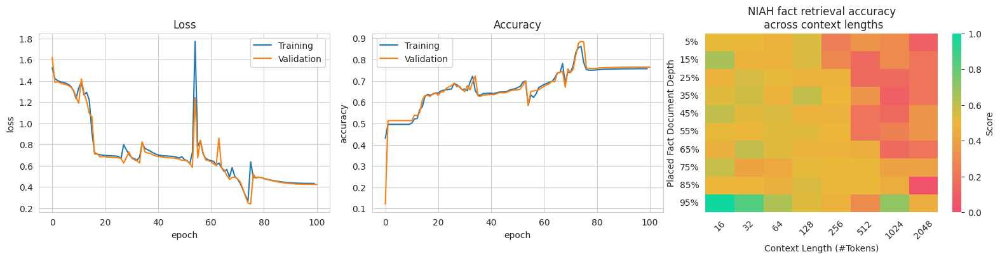

In [ ]:
rnn_dfa = SimpleRNN(dim = 128, nlayer = 5).cuda()  # RNNs CAN learn the function (proven later by hardwiring) but it's not consistent
xs, ys = DFADataset(n_samples=10).tensors
rnn_dfa.train()
rnn_dfa.zero_grad()
F.cross_entropy(rnn_dfa(xs.cuda()).flatten(0, 1), ys.cuda().flatten()).backward()
print(f"The mean magnitude of gradients is: {torch.cat([p.grad.flatten() for p in rnn_dfa.parameters()]).abs().mean().item()}")
train_and_plot_graphs(rnn_dfa, DFADataset, max_epochs=100)  # note that to get an RNN which learns the function required a much larger model and many more epochs
del rnn_dfa

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=100` reached.


INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test acc          │    0.9999008178710938     │
│         test loss         │    0.02870488353073597    │
└───────────────────────────┴───────────────────────────┘

100%|██████████| 8/8 [00:02<00:00,  3.39it/s]


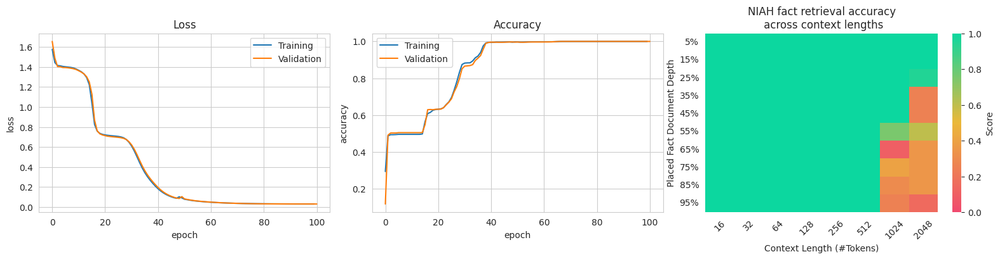

In [ ]:
grnn_dfa = SimpleGRNN(dim = 32, nlayer = 3)
train_and_plot_graphs(grnn_dfa, DFADataset, max_epochs=100)

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=100` reached.


INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test acc          │    0.9974288940429688     │
│         test loss         │   0.018502606078982353    │
└───────────────────────────┴───────────────────────────┘

100%|██████████| 8/8 [00:03<00:00,  2.20it/s]


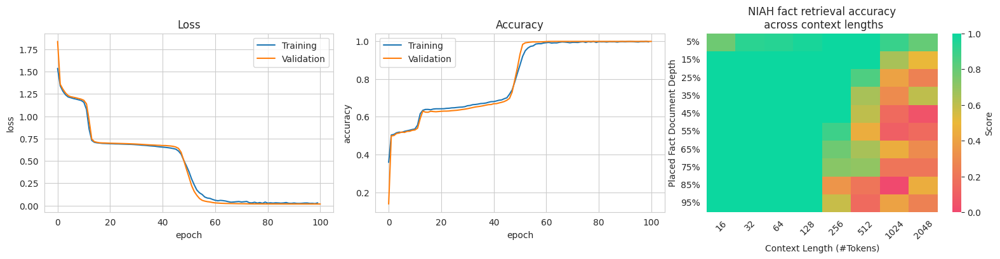

In [ ]:
transformer_dfa = SimpleTransformer(dim = 32, nlayer = 3, maxlen=128)
train_and_plot_graphs(transformer_dfa, DFADataset)

This is unexpected -- I expected transformers to generalise to longer context lengths easier than GRNNs! Instead, they have an immediate accuracy drop when passed inputs longer than those they were trained on. I investigate whether using a positional embedding over a longer length leads to better generalisation to longer context lengths.

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=100` reached.


INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test acc          │            1.0            │
│         test loss         │   0.003342842683196068    │
└───────────────────────────┴───────────────────────────┘

100%|██████████| 8/8 [00:03<00:00,  2.21it/s]


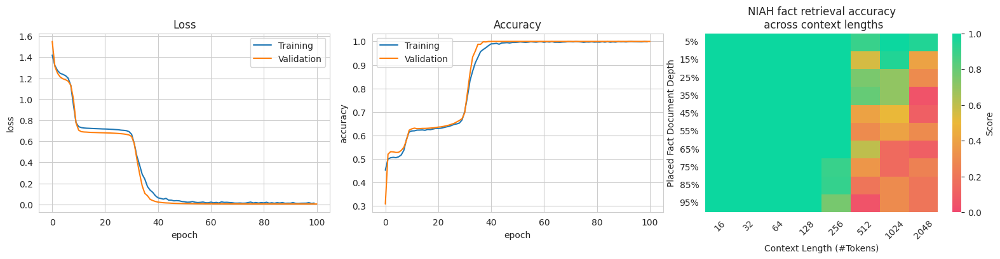

In [ ]:
transformer_dfa = SimpleTransformer(dim = 32, nlayer = 3, maxlen=512)
train_and_plot_graphs(transformer_dfa, DFADataset)
del transformer_dfa

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

/usr/local/lib/python3.10/dist-packages/pytorch_lightning/loops/fit_loop.py:298: The number of training batches (8)
is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you 
want to see logs for the training epoch.

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=100` reached.


INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test acc          │            1.0            │
│         test loss         │   0.0027767117135226727   │
└───────────────────────────┴───────────────────────────┘

100%|██████████| 8/8 [00:04<00:00,  1.97it/s]


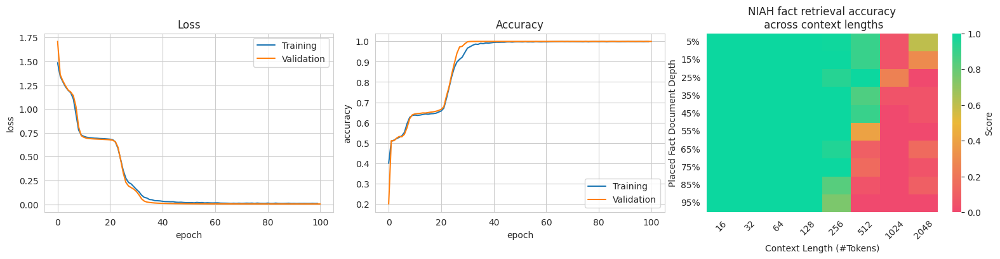

In [ ]:
transformer_dfa = SimpleTransformer(dim = 32, nlayer = 3, maxlen=1024)
train_and_plot_graphs(transformer_dfa, DFADataset)

#### Findings

We observe that RNNs, GRNNs and Transformers are all *physically able* to learn to recognise the DFA langauge. This is unsurprising since it's a rather simple sanity task.

*Critically* we observe that the RNN has great difficultly with this dataset in general. This is demonstrated by the fact that it doesn't *usually* converge to desirable solutions -- often getting stuck at 60-70% accuracy! During testing, it did converge to 95%+ accuracy sometimes, demonstrating that they can learn the DFA.

Surprisingly, the GRNN is generalising to longer sequence lengths better than the Transformer. This performance difference can be decreased by using longer positional embeddings -- however overly long positional embeddings mean the transformer can have some difficulty *i.e.* in establishing the immediate predecessor of a node.

I conject that this is because the sequence is by design modellable by a DFA -- and the GRNN architecture well-approximates the structure of a DFA. This allows it to model a DFA easier than a transformer -- which does not contain recurrence and so does not naturally model a DFA.

---

#### PDA Dataset

Next, I apply the models to the PDADataset. This dataset is more complicated -- and as such, *none* of the models were able to generalise with 1024 samples. In light of this, I increase the number of samples to 2048 -- which was enough for the transformer and GRNN to converge and generalise. However, once more, the RNN did not learn the function...

Since this dataset has non-constant length keys, I write a new function which tests the performance of models with longer keys to observe how well models generalise to different key lengths (key length is distributed exponentially with mean 2; I repeat evaluation with means 5 and 10).

In [ ]:
def plot_graphs_mu(model: nn.Module, dataset):

    acc_fn = torchmetrics.Accuracy(task='multiclass', num_classes=dataset.num_classes)

    acc_grid = torch.zeros((8, 10))

    plt.figure(figsize = (11,4))

    for i, seqlength in enumerate(map(lambda x: 2 ** x, trange(4, 12))):
        for j, position in enumerate(map(lambda x: (seqlength * x) // 10, range(10))):
            if seqlength >= 512:
                size = 20
                batch = 10
            else:
                size = 100
                batch = 10
            xs, ys = dataset(n_samples = size, seqlength = seqlength, pos=(position, position + seqlength // 10), mu=5).tensors
            for x, y in zip(xs.reshape(batch, size // batch, seqlength).cuda(), ys.reshape(batch, size // batch, seqlength).cuda()):
                logits = model(x)
                acc_grid[i, j] += acc_fn(logits[:, -1].cpu(), y[:, -1].cpu()) / batch

    cmap = LinearSegmentedColormap.from_list("custom_cmap", ["#F0496E", "#EBB839", "#0CD79F"])

    plt.subplot(1, 2, 1)
    sns.heatmap(
        acc_grid.transpose(0, 1),
        fmt="g",
        cmap=cmap,
        cbar_kws={'label': 'Score'},
        vmin=0,
        vmax=1
    )
    plt.title('NIAH fact retrieval accuracy\n across context lengths for $\\mu=5$')
    plt.xticks(ticks=list(i + 0.5 for i in range(8)), labels=[f'{2 ** i}' for i in range(4, 12)], rotation=45)
    plt.yticks(ticks=list(i + 0.5 for i in range(10)), labels=[f'{i}%' for i in range(5, 105, 10)], rotation=0)
    plt.tight_layout()
    plt.xlabel('Context Length (#Tokens)')
    plt.ylabel('Placed Fact Document Depth')

    acc_grid = torch.zeros((8, 10))

    for i, seqlength in enumerate(map(lambda x: 2 ** x, trange(4, 12))):
        for j, position in enumerate(map(lambda x: (seqlength * x) // 10, range(10))):
            if seqlength >= 512:
                size = 20 # todo change to 20
                batch = 10
            else:
                size = 100 # todo change to 10
                batch = 10
            xs, ys = dataset(n_samples = size, seqlength = seqlength, pos=(position, position + seqlength // 10), mu=10).tensors
            for x, y in zip(xs.reshape(batch, size // batch, seqlength).cuda(), ys.reshape(batch, size // batch, seqlength).cuda()):
                logits = model(x)
                acc_grid[i, j] += acc_fn(logits[:, -1].cpu(), y[:, -1].cpu()) / batch

    cmap = LinearSegmentedColormap.from_list("custom_cmap", ["#F0496E", "#EBB839", "#0CD79F"])

    plt.subplot(1, 2, 2)
    sns.heatmap(
        acc_grid.transpose(0, 1),
        fmt="g",
        cmap=cmap,
        cbar_kws={'label': 'Score'},
        vmin=0,
        vmax=1
    )
    plt.title('NIAH fact retrieval accuracy\n across context lengths for $\\mu=10$')
    plt.xticks(ticks=list(i + 0.5 for i in range(8)), labels=[f'{2 ** i}' for i in range(4, 12)], rotation=45)
    plt.yticks(ticks=list(i + 0.5 for i in range(10)), labels=[f'{i}%' for i in range(5, 105, 10)], rotation=0)
    plt.tight_layout()
    plt.xlabel('Context Length (#Tokens)')
    plt.ylabel('Placed Fact Document Depth')

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

/usr/local/lib/python3.10/dist-packages/pytorch_lightning/loops/fit_loop.py:298: The number of training batches 
(16) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if
you want to see logs for the training epoch.

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=100` reached.


INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test acc          │    0.5927810668945312     │
│         test loss         │    1.0098155736923218     │
└───────────────────────────┴───────────────────────────┘

100%|██████████| 8/8 [00:13<00:00,  1.66s/it]


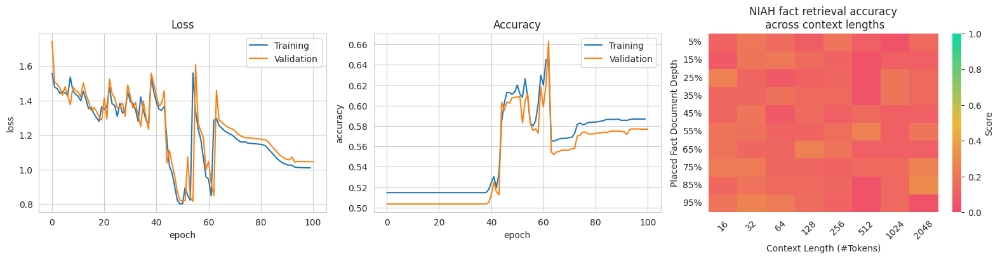

In [ ]:
rnn_pda = SimpleRNN(dim=128, nlayer=5, out_dims=6)
train_and_plot_graphs(rnn_pda, PDADataset, max_epochs=100, n_samples=2048)
del rnn_pda

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=100` reached.


INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test acc          │    0.9999618530273438     │
│         test loss         │   0.0035691955126821995   │
└───────────────────────────┴───────────────────────────┘

100%|██████████| 8/8 [00:14<00:00,  1.77s/it]


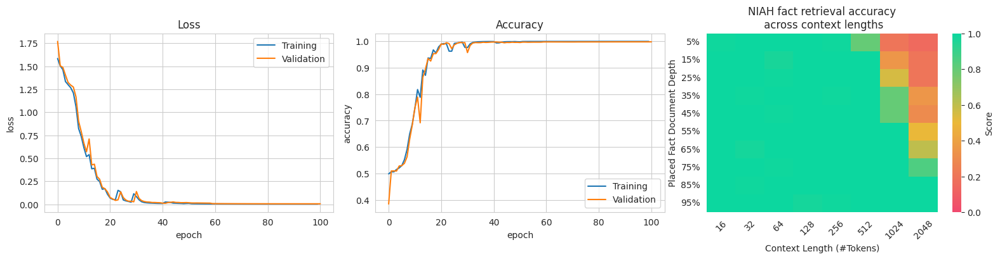

In [ ]:
grnn_pda = SimpleGRNN(nlayer=5, out_dims=6)
train_and_plot_graphs(grnn_pda, PDADataset, n_samples=2048)

100%|██████████| 8/8 [00:13<00:00,  1.65s/it]


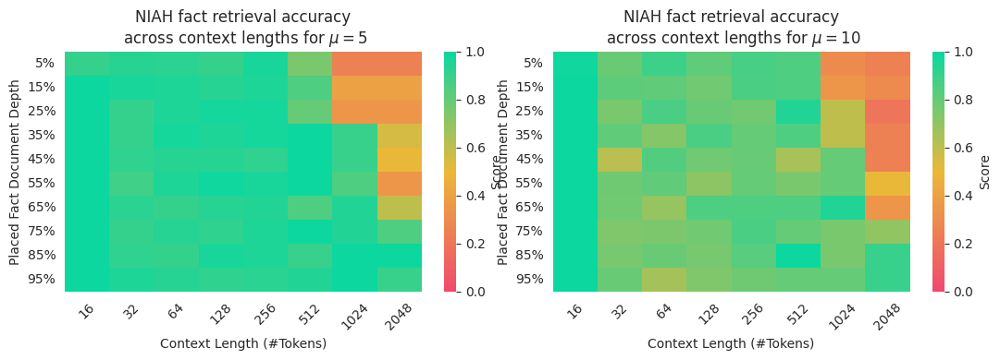

In [ ]:
plot_graphs_mu(grnn_pda, PDADataset)
del grnn_pda

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=100` reached.


INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test acc          │    0.9265975952148438     │
│         test loss         │    0.20636039972305298    │
└───────────────────────────┴───────────────────────────┘

100%|██████████| 8/8 [00:15<00:00,  1.88s/it]


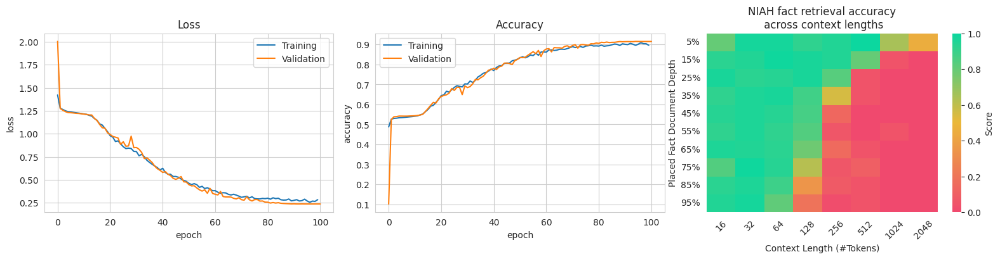

In [ ]:
transformer_pda = SimpleTransformer(nlayer=5, out_dims=6, maxlen=512)
train_and_plot_graphs(transformer_pda, PDADataset, n_samples=2048)

100%|██████████| 8/8 [00:15<00:00,  1.88s/it]


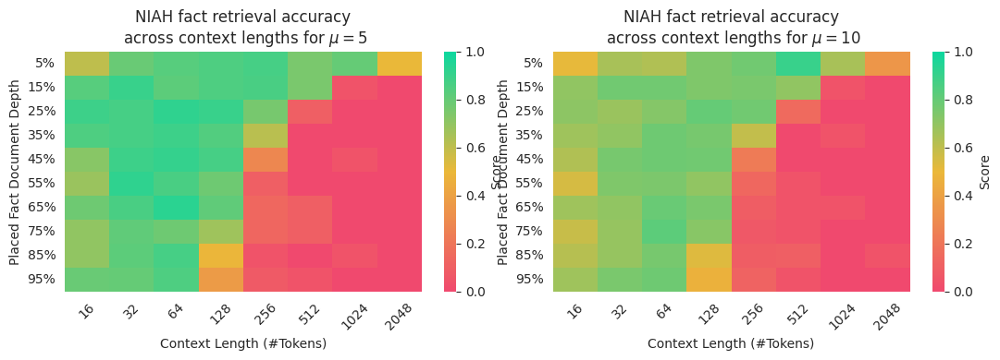

In [ ]:
plot_graphs_mu(transformer_pda, PDADataset)
del transformer_pda

##### Findings

We observe that (once again) RNNs do not learn the function -- they are reduced to completely random guessing.

We observe that both transformers and GRNNs are able to learn the function -- however GRNNs generalise substantially better on longer contexts for this dataset than the transformer does!

Finally, we test the models on different data which is still part of the language they are trained to recognise (keys from the same grammar but with length drawn from a different distribution). We find that neither GRNNs, nor transformers retain high performance but or neither generalise *well*. But, we do find that the GRNN generalises better.

From this we can conclude that both GRNNs and transfomers can *approximate* the computation of a PDAs.

GRNNs have explicit recurrence which encouraged them to explicitly model a state machine and allowing them to generalise better to longer sequences -- however this recurrence did not cause them to learn a function which recognised triggers from the distribution perfectly.

---

#### LBFA Dataset

Finally, we test the models on the most complicated dataset of all. This dataset is "solvable" only by a linear-bounded finite automaton. This is complicated and as such, it's unlikely that any model will learn the dataset at all. I expect that *none* of the models will be able to generalise well.

Since the RNN was unable to generalise on the previous datasets, I do not repeat experiments with it.

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=100` reached.


INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test acc          │     0.99664306640625      │
│         test loss         │   0.015471873804926872    │
└───────────────────────────┴───────────────────────────┘

100%|██████████| 8/8 [00:27<00:00,  3.47s/it]


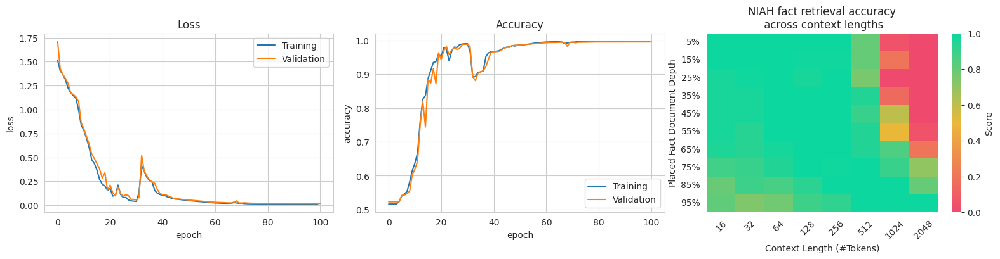

In [ ]:
grnn_lbfa = SimpleGRNN(nlayer=8, out_dims=6)
train_and_plot_graphs(grnn_lbfa, LBFADataset, max_epochs=100, n_samples=2048)

100%|██████████| 8/8 [00:26<00:00,  3.31s/it]


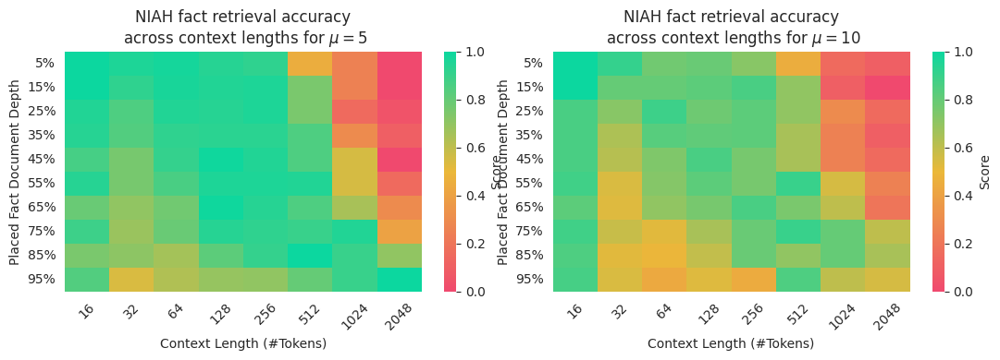

In [ ]:
plot_graphs_mu(grnn_lbfa, LBFADataset)
del grnn_lbfa

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=100` reached.


INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test acc          │      0.9224853515625      │
│         test loss         │    0.2488967478275299     │
└───────────────────────────┴───────────────────────────┘

100%|██████████| 8/8 [00:30<00:00,  3.76s/it]


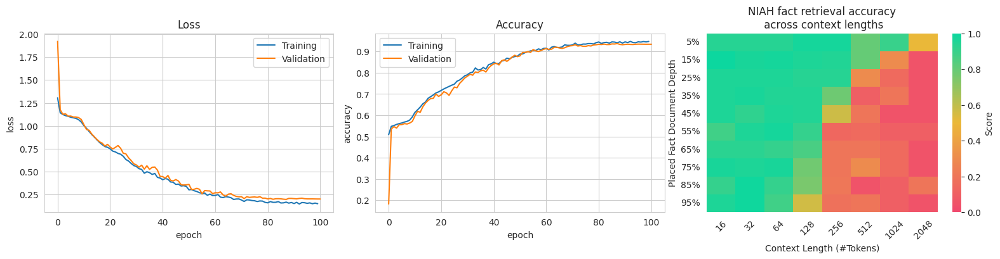

In [ ]:
transformer_lbfa = SimpleTransformer(nlayer=8, out_dims=6, maxlen=512)
train_and_plot_graphs(transformer_lbfa, LBFADataset, n_samples=2048)

100%|██████████| 8/8 [00:30<00:00,  3.84s/it]


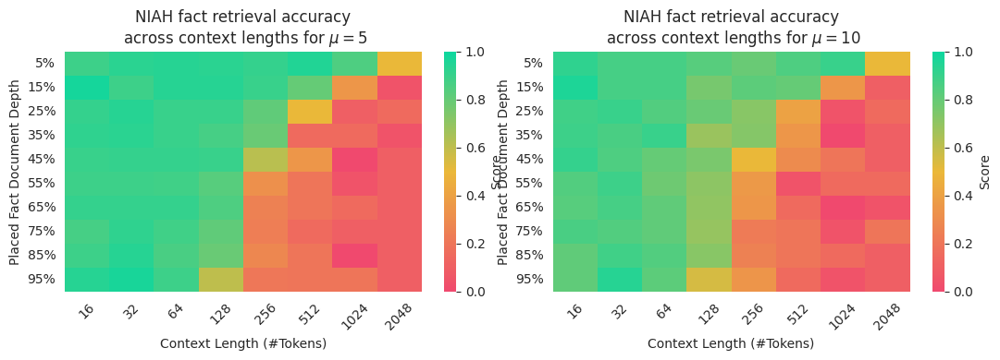

In [ ]:
plot_graphs_mu(transformer_lbfa, LBFADataset)
del transformer_lbfa

##### Findings

We find that both models are able to approximate this context sensitive grammar -- however, they were unable to learn the distribution. This is demonstrated by the limited extrapolation performance; and the low accuracy when presented with keys in the language which were drawn from a different distribution.

From this, we can conclude that GRNNs struggle to recognise context sensitive languages -- and transformers stuggle to generalise to longer sequences in this case.

However, we find that the transformer generalised well to new triggers: indicating that it learnt to compute a similar function to a LBFA. It struggled with longer context lengths, but generalised fairly well when asked to work with keys which were in the grammar but unlike those in the training data.

From this, we have demonstrated that transformers can be trained to approximate the computation of some LBFA on some grammars which are context sensitive but not context free.

### RASP Implementation

I now start the next stage of the project. This involves formally providing lower bounds on the complexity of the formal grammars that the networks can recognise. This is done by providing RASPy implementations which recognise the languages specified; and hardwiring solutions for RNNs.

In [ ]:
!pip install -qqq git+https://github.com/chalk-diagrams/chalk git+https://github.com/srush/RASPy
import raspy as rp

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done


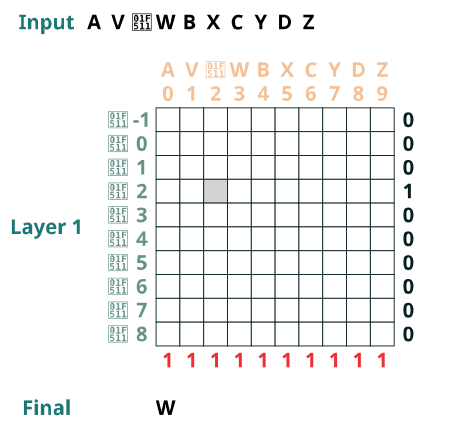

In [ ]:
def dfadatasetlookup(tokens: str):
    preceding = rp.key(rp.indices) == rp.query(rp.indices - 1)
    after_key = ((rp.query('🔑') == rp.key(rp.tokens)) & preceding).value(1)
    return (after_key * rp.tokens).input('AV🔑WBXCYDZ')

dfadatasetlookup('AV🔑WBXCYDZ')

In [ ]:
# in light of https://arxiv.org/pdf/2210.10749.pdf which allows models with width/depth dependent on the dataset length, I demonstrate a lookup task with width O(n)
# note that there also exists a solution of depth O(lg n) -- in this case formed by a vectorised binary search for the length of a^nb^n using bitwise operations for conditinals
def pdadatasetlookup(tokens: str):
    # 🗝️ is not understood properly by python... replace it with κ
    # note this now means κ cannot occur in the sequence
    tokens = tokens.replace('🗝️', 'κ')

    # causal_mask
    before = rp.key(rp.indices) < rp.query(rp.indices)

    # number of preceding 🗝️s
    cnt_as = ((rp.key(rp.tokens) == rp.query('κ')) & before).value(1).name('previous 🗝️s')

    # number of preceding 🗝️s on an index with value 🗝️
    mask_as = rp.where(rp.tokens == 'κ', cnt_as, -1)

    # 1 a valid starting index
    a_before_not_a = (((rp.query(rp.indices - 1) == rp.key(rp.indices)) & (rp.query('κ') != rp.key(rp.tokens))).value(1).name('prev is 🗝️')) * rp.where(rp.tokens == 'κ', 1, 0)
    # number of preceding 🔑s
    cnt_bs = ((rp.query('🔑') == rp.key(rp.tokens)) & before).value(1).name('previous 🔑s')
    # number of preceding 🔑s on an index with value 🔑
    mask_bs = rp.where(rp.tokens == '🔑', cnt_bs, -1)

    valid_acc = None

    for i in range(1, len(tokens)):
        # occurs i before -- implies causality
        ibefore = rp.query(rp.indices - i) == rp.key(rp.indices)
        # return ibefore.value(1).input(tokens)

        # every symbol between them is 🗝️
        diff_as = ((ibefore & (rp.query(mask_as - i) == rp.key(mask_as))).value(1).name('diff in 🗝️s') | ((rp.indices - i + 1 == 0) & (rp.tokens == 'κ'))) * ((rp.query(rp.indices - i + 1) == rp.key(rp.indices)) & (rp.query(1) == rp.key(a_before_not_a | ((rp.indices == 0) & (rp.tokens == 'κ'))))).value(1).name('valid start 2i earlier')
        # ✓

        # every symbol between them is 🔑
        diff_bs = (ibefore & (rp.query(mask_bs - i) == rp.key(mask_bs))).value(1).name('dif in 🔑s')

        # is_valid
        valid = (ibefore & (rp.query(1) == rp.key(diff_as))).value(1) * diff_bs

        if valid_acc is not None:
            valid_acc = valid_acc + valid
        else:
            valid_acc = valid

    # this is 1 iff there is a valid prefix
    is_value = ((rp.query(rp.indices - 1) == rp.key(rp.indices)) & (rp.query(1) == rp.key(valid_acc))).value(1)

    # if any previous values are 1 then take their value!
    value = ((rp.key(rp.indices) <= rp.query(rp.indices)) & (rp.query(1) == rp.key(is_value))).value(rp.tokens)

    return value.input(tokens)

pdadatasetlookup('A🗝️🗝️🗝️🔑🔑🔑BCA')

---

## Hardwire

Now, we ask whether the limitations of the RNN were due to a fundamental inability to learn the language -- or an inability to *train it* to learn the language.

I hardcode an RNN to achieve 100% performance on the task -- this demonstrates that the poor performance of the RNN was due to training difficulties rather than a fundamental limitation of the architecture.

Since we have empirically demonstrated that both GRNNs and Transformers are able to learn the language, I do not hardcode them.

In [ ]:
import torch.nn.functional as F

rnndh = SimpleRNN(nlayer=2)

with torch.no_grad():
    rnndh.embedding.weight.data = torch.zeros_like(rnndh.embedding.weight.data)
    rnndh.embedding.weight.data[torch.arange(5), torch.arange(5)] = 1
    # ✓

    rnndh.weight_ih_l0.data = torch.zeros_like(rnndh.weight_ih_l0.data)
    rnndh.weight_ih_l0.data[torch.arange(5), torch.arange(5)] = 1
    rnndh.weight_ih_l0.data[4, 4] += 1
    # ✓

    rnndh.bias_ih_l0.data = torch.zeros_like(rnndh.bias_ih_l0.data)
    rnndh.bias_ih_l0.data[:5] = -1
    rnndh.weight_hh_l0.data = torch.zeros_like(rnndh.weight_hh_l0.data)
    rnndh.weight_hh_l0.data[:5, 4] = 1
    rnndh.bias_hh_l0.data = torch.zeros_like(rnndh.bias_hh_l0.data)
    # ✓

    rnndh.weight_ih_l1.data = torch.zeros_like(rnndh.weight_ih_l1.data)
    rnndh.weight_ih_l1.data[:4, :4] = -1
    rnndh.weight_ih_l1.data[torch.arange(4), torch.arange(4)] = 1
    rnndh.weight_ih_l1.data[:4, 4] = -1
    rnndh.weight_ih_l1.data[4:8, 4] = 1
    rnndh.weight_hh_l1.data = torch.zeros_like(rnndh.weight_hh_l1.data)
    rnndh.weight_hh_l1.data[torch.arange(4), torch.arange(4)] = 1
    rnndh.weight_hh_l1.data[4:, :4] = -1
    rnndh.weight_hh_l1.data[4 + torch.arange(4), torch.arange(4)] = 0
    rnndh.bias_ih_l1.data = torch.zeros_like(rnndh.bias_ih_l1.data)
    rnndh.bias_hh_l1.data = torch.zeros_like(rnndh.bias_hh_l1.data)
    # ✓

    rnndh.fc.weight.data = torch.zeros_like(rnndh.fc.weight.data)
    rnndh.fc.weight.data[torch.arange(4), torch.arange(4)] = 1
    rnndh.fc.weight.data[torch.arange(4), 4:8] = -1
    rnndh.fc.weight.data[torch.arange(4), torch.arange(4) + 4] = 1
    rnndh.fc.bias.data = torch.zeros_like(rnndh.fc.bias.data)
    rnndh.fc.bias.data[4] = 0.5
    # ✓

acc_fn = torchmetrics.Accuracy(task='multiclass', num_classes=5)

# batch × 5 and 8 × 8
dfadataset = DFADataset(n_samples=1024, seqlength=128)

x, y = dfadataset.tensors
print(f'hardwired accuracy: {acc_fn(rnndh(x).reshape(-1, 5), y.flatten()).item()}')
del rnndh

hardwired accuracy: 1.0


In [ ]:
rnnph = SimpleRNN(nlayer=4, out_dims=6)

with torch.no_grad():
    rnnph.embedding.weight.data = torch.zeros_like(rnnph.embedding.weight.data)
    rnnph.embedding.weight.data[torch.arange(5), torch.arange(5)] = 1

    rnnph.weight_ih_l0.data = torch.zeros_like(rnnph.weight_ih_l1.data)
    rnnph.weight_ih_l0.data[torch.arange(5), torch.arange(5)] = 1
    rnnph.weight_ih_l0.data[5:7, :5] = -1000 # torch.inf
    rnnph.weight_ih_l0.data[5, 3] = 1
    rnnph.weight_ih_l0.data[6, 4] = 1
    rnnph.weight_ih_l0.data[9, 4] = -1

    rnnph.weight_hh_l0.data = torch.zeros_like(rnnph.weight_hh_l0.data)
    rnnph.weight_hh_l0.data[torch.arange(5, 7), torch.arange(5, 7)] = 1
    rnnph.weight_hh_l0.data[[7, 8], [5, 6]] = 1

    rnnph.bias_ih_l0.data = torch.zeros_like(rnnph.bias_ih_l0.data)
    rnnph.bias_hh_l0.data = torch.zeros_like(rnnph.bias_hh_l0.data)
    rnnph.bias_hh_l0.data[9] = 1
    # ✓

    rnnph.weight_ih_l1.data = torch.zeros_like(rnnph.weight_ih_l1.data)
    rnnph.weight_ih_l1.data[torch.arange(5), torch.arange(5)] = 1
    rnnph.weight_ih_l1.data[5, 7] = 1
    rnnph.weight_ih_l1.data[5, 9] = -1000
    rnnph.weight_ih_l1.data[6, 6] = 1

    rnnph.weight_hh_l1.data = torch.zeros_like(rnnph.weight_hh_l1.data)
    rnnph.weight_hh_l1.data[5, 5] = 1

    rnnph.bias_ih_l1.data = torch.zeros_like(rnnph.bias_ih_l1.data)
    rnnph.bias_hh_l1.data = torch.zeros_like(rnnph.bias_hh_l1.data)
    # ✓

    rnnph.weight_ih_l2.data = torch.zeros_like(rnnph.weight_ih_l2.data)
    rnnph.weight_ih_l2.data[torch.arange(5), torch.arange(5)] = 1
    rnnph.weight_ih_l2.data[[5, 6], [5, 6]] = 1
    rnnph.weight_ih_l2.data[[5, 6, 7], [6, 5, 5]] = -1

    rnnph.weight_hh_l2.data = torch.zeros_like(rnnph.weight_hh_l2.data)
    rnnph.bias_ih_l2.data = torch.zeros_like(rnnph.bias_ih_l2.data)
    rnnph.bias_hh_l2.data = torch.zeros_like(rnnph.bias_hh_l2.data)
    rnnph.bias_ih_l2.data[7] = 1
    # ✓

    rnnph.weight_ih_l3.data = torch.zeros_like(rnnph.weight_ih_l3.data)
    rnnph.weight_ih_l3.data[torch.arange(5), torch.arange(5)] = 1
    rnnph.weight_ih_l3.data[[5, 5, 5], [5, 6, 7]] = -1

    rnnph.weight_hh_l3.data = torch.zeros_like(rnnph.weight_hh_l3.data)
    rnnph.weight_hh_l3.data[6, 5] = 1
    rnnph.weight_hh_l3.data[7:12, 6] = 1
    rnnph.weight_hh_l3.data[torch.arange(7,12), torch.arange(5)] = 1
    rnnph.weight_hh_l3.data[torch.arange(12,17), torch.arange(7,12)] = 1
    rnnph.weight_hh_l3.data[torch.arange(12,17), torch.arange(12,17)] = 1

    rnnph.bias_ih_l3.data = torch.zeros_like(rnnph.bias_ih_l3.data)
    rnnph.bias_ih_l3.data[5] = 1

    rnnph.bias_hh_l3.data = torch.zeros_like(rnnph.bias_hh_l3.data)
    rnnph.bias_hh_l3.data[7:12] = -1
    # ✓

    rnnph.fc.weight.data = torch.zeros_like(rnnph.fc.weight.data)
    rnnph.fc.weight.data[torch.arange(5), torch.arange(5)] = 1
    rnnph.fc.weight.data[:5, 6] = 2
    rnnph.fc.weight.data[[0,1,2,3,4,0,1,2,3,4], [7,8,9,10,11,12,13,14,15,16]] = 3

    rnnph.fc.bias.data = torch.zeros_like(rnnph.fc.bias)
    rnnph.fc.bias.data[:5] = -1
    rnnph.fc.bias.data[5] = 1


rnnph.eval()
def rnn(xs: list[int], h0=None, h1=None, h2=None, h3=None):
    # unrolled 4 layer RNN for debugging
    if h0 is None:
        h0 = torch.zeros(64)
    if h1 is None:
        h1 = torch.zeros(64)
    if h2 is None:
        h2 = torch.zeros(64)
    if h3 is None:
        h3 = torch.zeros(64)
    l0 = lambda x0, h0: F.relu(F.linear(F.embedding(torch.tensor(x0), rnnph.embedding.weight.data), rnnph.weight_ih_l0.data, rnnph.bias_ih_l0.data) + F.linear(h0, rnnph.weight_hh_l0.data, rnnph.bias_hh_l0.data))
    l1 = lambda x1, h1: F.relu(F.linear(x1, rnnph.weight_ih_l1.data, rnnph.bias_ih_l1.data) + F.linear(h1, rnnph.weight_hh_l1.data, rnnph.bias_hh_l1.data))
    l2 = lambda x2, h2: F.relu(F.linear(x2, rnnph.weight_ih_l2.data, rnnph.bias_ih_l2.data) + F.linear(h2, rnnph.weight_hh_l2.data, rnnph.bias_hh_l2.data))
    l3 = lambda x3, h3: F.relu(F.linear(x3, rnnph.weight_ih_l3.data, rnnph.bias_ih_l3.data) + F.linear(h3, rnnph.weight_hh_l3.data, rnnph.bias_hh_l3.data))
    fc = lambda x4: F.linear(x4, rnnph.fc.weight.data, rnnph.fc.bias.data)
    for x in xs:
        h0 = l0(x, h0)
        print(h0[:9])
        h1 = l1(h0, h1)
        print(h1[:7])
        h2 = l2(h1, h2)
        print(h2[:8])
        h3 = l3(h2, h3)
        print(h3[:18])
        print(fc(h3))
        print()


acc_fn = torchmetrics.Accuracy(task='multiclass', num_classes=6)

# batch × 5 and 8 × 8
dfadataset = PDADataset(n_samples=1024, seqlength=128)

x, y = dfadataset.tensors
print(f'hardwired accuracy: {acc_fn(rnnph(x).reshape(-1, 6), y.flatten()).item()}')
del rnnph

hardwired accuracy: 1.0


---

### FSMs to solve the datasets

Here, to demonstrate that the problems are solvable by the FSMs we claim solve them; I implement an FSM of each type which recognises the language.

In [ ]:
import torch.nn as nn


class DFA(nn.Module):
    def __init__(self, a: int): # a is the int to accept
        super().__init__()
        # M = (Q, Σ, δ, s, F)
        self.Q = {
            'initial', # initial state
            'seen',    # last symbol was 🔑
            'accept',  # output 0
            'reject',
        }
        self.Σ = {0, 1, 2, 3, 4}
        self.δ = {
            **{
                ('initial', x): 'initial' for x in self.Σ - {4}
            },
            ('initial', 4): 'seen',
            **{
                ('seen', x): 'reject' for x in self.Σ - {a}
            },
            ('seen', a): 'accept',
            **{
                ('accept', x): 'accept' for x in self.Σ
            },
            **{
                ('reject', x): 'reject' for x in self.Σ
            },
        }
        self.s = 'initial'
        self.F = {'accept'}

    def forward(self, seq):
        state = self.s
        for char in seq:
            state = self.δ[state, char.item()]
        return state in self.F

class DFAClassifier(nn.Module):
    def __init__(self):
        super().__init__()
        self.class0 = DFA(0)
        self.class1 = DFA(1)
        self.class2 = DFA(2)
        self.class3 = DFA(3)

    def forward(self, x):
        y = torch.zeros_like(x[:, -1])
        for i, seq in enumerate(x):
            match self.class0(seq), self.class1(seq), self.class2(seq), self.class3(seq):
                case True, False, False, False:
                    y[i] = 0
                case False, True, False, False:
                    y[i] = 1
                case False, False, True, False:
                    y[i] = 2
                case False, False, False, True:
                    y[i] = 3
                case False, False, False, False:
                    y[i] = 4
                case _:
                    assert False
        return y

x, y = DFADataset().tensors
preds = DFAClassifier()(x)
assert torch.all(preds == y[:, -1]).item()

In [ ]:
from itertools import product

class PDA(nn.Module):
    def __init__(self, a: int): # a is the int to accept
        super().__init__()
        # M = (Q, Σ, Γ, δ, s, Z, F)
        self.Q = {
            'initial', # initial state
            'inc',     # seen 🗝️^k
            'dec',     # seen 🗝️^n🔑^k
            'accept',  # seen 🗝️^n🔑^ns
            'reject',  # seen 🗝️^n🔑^na for a ≠ s
        }
        self.Σ = {0, 1, 2, 3, 4}
        self.Γ = {'⊥', '✓'}
        self.δ = {
            **{
                ('initial', x, γ): ('initial', γ) for x, γ in set(product(self.Σ, self.Γ)) - {(3, '⊥')}
            },
            ('initial', 3, '⊥'): ('inc', '✓⊥'),
            **{
                ('inc', x, γ): ('initial', '⊥') for x, γ in set(product(self.Σ, self.Γ)) - {(3, '✓'), (4, '✓')}
            },
            ('inc', 3, '✓'): ('inc', '✓✓'),
            ('inc', 4, '✓'): ('dec', ''),
            **{
                ('dec', x, '✓'): ('initial', '⊥') for x in self.Σ - {3, 4}
            },
            ('dec', 3, '✓'): ('inc', '✓⊥'),
            ('dec', 4, '✓'): ('dec', ''),
            **{
                ('dec', x, '⊥'): ('reject', '⊥') for x in self.Σ - {a}
            },
            ('dec', a, '⊥'): ('accept', '⊥'),
            **{
                ('accept', x, γ): ('accept', γ) for x, γ in set(product(self.Σ, self.Γ))
            },
            **{
                ('reject', x, γ): ('reject', γ) for x, γ in set(product(self.Σ, self.Γ))
            },
        }
        self.s = 'initial'
        self.Z = '⊥'
        self.F = {'accept'}

    def forward(self, seq):
        state = self.s
        stack = [self.Z]
        for char in seq:
            state, diff = self.δ[state, char.item(), stack.pop()]
            stack.extend(reversed(diff))
        return state in self.F

class PDAClassifier(nn.Module):
    def __init__(self):
        super().__init__()
        self.class0 = PDA(0)
        self.class1 = PDA(1)
        self.class2 = PDA(2)
        self.class3 = PDA(3)
        self.class4 = PDA(4)

    def forward(self, x):
        y = torch.zeros_like(x[:, -1])
        for i, seq in enumerate(x):
            match self.class0(seq), self.class1(seq), self.class2(seq), self.class3(seq), self.class4(seq):
                case True, False, False, False, False:
                    y[i] = 0
                case False, True, False, False, False:
                    y[i] = 1
                case False, False, True, False, False:
                    y[i] = 2
                case False, False, False, True, False:
                    y[i] = 3
                case False, False, False, False, True:
                    y[i] = 4
                case a, b, c, d:
                    assert False
        return y

x, y = PDADataset(seqlength=20).tensors
preds = PDAClassifier()(x)
assert torch.all(preds == y[:, -1]).item()

---

### Efficient Attention

We now turn our attention to efficient transformers. Specifically, we ask whether more efficient implementations of transformers limit their computational expressivity or affect the functions they can learn.

As seen in Figure 1 of [Efficient Transformers: A Survey](https://arxiv.org/pdf/2009.06732.pdf), we have that there are a wide range of transformer architectures. To this end, I use this to guide which transformers to implement and attempted to implement transformers from different categories.

<img src="attachment:d090c808-ff09-4ced-8c43-924a7b4c7f6b.png" width="500"/>

I implement two types of efficient transformer and benchmark them on the previous tasks to determine whether their efficiency limits their expressivity:
- [Linformer](https://arxiv.org/abs/2006.04768)
- [Sparse Transformer](https://arxiv.org/abs/1904.10509)

#### Linformer

I implement a Linformer to investigate whether the expressivity is limited.

I find that the linformer performs *very* poorly on the DFA dataset, partially due to the lack of a causal mask. I start by implementing the linformer myself; and after this negative result, I take an open source implementation and validate that their implementation suffers has the same performance.

In [ ]:
import torch.nn.functional as F
import torch.nn as nn
import torch


class PositionalEmbedding(nn.Module): # ✓
    def __init__(self, embedding_dim: int, max_len: int = 128):
        super().__init__()
        self.embedding_dim = embedding_dim
        self.max_len = max_len

    def forward(self, x):
        positions = torch.zeros(x.size(-2), self.embedding_dim).to('cpu' if x.get_device() == -1 else x.get_device())
        positions[:, 0::2] = torch.sin(
            torch.arange(0, x.size(-2)).reshape(-1, 1) / (self.max_len ** (torch.arange(0, self.embedding_dim, 2).reshape(1, -1) / self.embedding_dim))
        )
        positions[:, 1::2] = torch.cos(
            torch.arange(0, x.size(-2)).reshape(-1, 1) / (self.max_len ** (torch.arange(0, self.embedding_dim - 1, 2).reshape(1, -1) / self.embedding_dim))
        )
        if x.dim() == 3:
            positions = positions.reshape(1, *positions.size())
        return x + positions


class LinformerMultiheadAttention(nn.Module):
    def __init__(self, d_model, nhead, k = 256, seqlength = 128, dropout = 0.1):
        super().__init__()
        assert not d_model % nhead, 'd_model must be divisible by nhead'
        self.d_model = d_model
        self.nhead = nhead
        self.seqlength = seqlength
        self.k = k
        self.d_head = self.d_model // self.nhead

        self.query = nn.Identity() # nn.Linear(self.d_model, self.d_head * self.nhead, False)
        self.key = nn.Identity() # nn.Linear(self.d_model, self.d_head * self.nhead, False)
        self.value = nn.Linear(self.d_model, self.d_head * self.nhead, False)

        self.e = nn.Linear(seqlength, k, False)
        self.f = nn.Linear(seqlength, k, False)

        self.dropout = nn.Dropout(dropout)
        self.fc = nn.Linear(self.d_head * self.nhead, self.d_model)

    def forward(self, x):
        assert x.size(-2) <= self.seqlength, 'the sequence length for linformers is fixed'

        qs = self.query(x).reshape(x.size(0), x.size(-2), self.nhead, -1).transpose(1, 2)
        if x.size(-2) < self.seqlength:
            ks = (self.e.weight[:, :x.size(-2)] @ self.key(x)).reshape(x.size(0), self.k, -1, self.d_head).transpose(1, 2).expand(-1, self.nhead, -1, -1)
            vs = (self.f.weight[:, :x.size(-2)] @ self.key(x)).reshape(x.size(0), self.k, -1, self.d_head).transpose(1, 2).expand(-1, self.nhead, -1, -1)
        else:
            ks = (self.e.weight @ self.key(x)).reshape(x.size(0), self.k, -1, self.d_head).transpose(1, 2).expand(-1, self.nhead, -1, -1)
            vs = (self.f.weight @ self.key(x)).reshape(x.size(0), self.k, -1, self.d_head).transpose(1, 2).expand(-1, self.nhead, -1, -1)

        y = (self.dropout(F.softmax(qs @ ks.transpose(-1, -2) / self.d_head ** 0.5, dim=-1)) @ vs).transpose(1, 2).reshape(x.size(0), x.size(-2), -1)
        y = self.fc(y)

        return y


class LinformerEncoderLayer(nn.Module):
    def __init__(self, nhead: int, d_model: int, seqlength: int, k: int, dim_feedforward: int = 2048, dropout: float = 0.1, norm_first: bool = False):
        super().__init__()
        self.self_attn = LinformerMultiheadAttention(d_model, nhead, k, seqlength, dropout=dropout)
        self.linear1 = nn.Linear(d_model, dim_feedforward, bias=False)
        self.dropout = nn.Dropout(dropout)
        self.linear2 = nn.Linear(dim_feedforward, d_model, bias=False)

        self.norm_first = norm_first
        self.norm1 = nn.LayerNorm(d_model, eps=1e-5, bias=False)
        self.norm2 = nn.LayerNorm(d_model, eps=1e-5, bias=False)
        self.dropout1 = nn.Dropout(dropout)
        self.dropout2 = nn.Dropout(dropout)

    def forward(self, x):
        if self.norm_first:
            x = x + self._sa_block(self.norm1(x))
            x = x + self._ff_block(self.norm2(x))
        else:
            x = self.norm1(x + self._sa_block(x))
            x = self.norm2(x + self._ff_block(x))
        return x

    def _sa_block(self, x):
        x = self.self_attn(x)
        return self.dropout1(x)

    def _ff_block(self, x):
        x = self.linear2(self.dropout(F.relu(self.linear1(x))))
        return self.dropout2(x)


class SimpleLinformer(nn.Module):
    def __init__(self, n_tokens:int = 5, d_model:int = 64, num_classes: int = 5, nlayer=3, nhead=4, k=1024, seqlength=128, dim_feedforward=None):
        super().__init__()
        if dim_feedforward is None:
            dim_feedforward = d_model
        self.embedding = nn.Embedding(num_embeddings=n_tokens, embedding_dim=d_model)
        self.positional_embedding = PositionalEmbedding(embedding_dim=d_model, max_len=seqlength)
        self.decoders = nn.ParameterList(
            (
                LinformerEncoderLayer(nhead=nhead, d_model = d_model, seqlength = seqlength, k = k, dim_feedforward=d_model)
                for _ in range(nlayer)
            )
        )
        self.fc = nn.Linear(d_model, num_classes)

    def forward(self, x):
        # src_mask is not included because, as stated in https://github.com/tatp22/linformer-pytorch/issues/16
        # "this is an open research problem, as to how mask the Linformer, because of these tokens getting lost when downsampling"
        # specifically, "the Linformer was never meant to be used for causal decoding"
        y = self.embedding(x)
        y = self.positional_embedding(y)
        for decoder in self.decoders:
            y = decoder(y)
        y = self.fc(y)
        return y

The critical limitation of the linformer is that it assumes a *fixed sequence length*. This means I cannot repeat my evaluations in full generality! Instead, I test only performance on a fixed sequence length.

In [ ]:
import math
from pytorch_lightning.callbacks import RichProgressBar
from matplotlib import pylab as plt
import seaborn as sns
sns.set_style('whitegrid')
import numpy as np
from tqdm import trange


from pytorch_lightning.callbacks import RichProgressBar
from matplotlib import pylab as plt
import seaborn as sns
sns.set_style('whitegrid')
import numpy as np
from tqdm import trange
from matplotlib.colors import LinearSegmentedColormap

def linformer_train_and_plot_graphs(model: nn.Module, dataset, max_epochs = 100, n_samples=1024, seqlength: int = 512):
    """
    This function takes a model, a function to a dataset, the size of the dataset and the number of epochs to train for.
    It then trains the model for that number of epochs on the specified dataset, plots the train and validation loss during training;
    as well as the accuracy on the NIAH task (at the end of the sequence).
    """

    plmodel = PLModule(
        model,
        epochs=max_epochs,
        num_classes=dataset.num_classes,
        optimkwargs={'lr': 0.001}
    )

    datamodule = PLDatamodule(dataset, n_samples=n_samples, seqlength=seqlength, batch_size=128)

    trainer = pl.Trainer(
        max_epochs = max_epochs,
        enable_model_summary = False,
        enable_checkpointing=False,
        callbacks=[RichProgressBar()],
    )

    trainer.fit(
        model=plmodel,
        datamodule=datamodule,
    )

    trainer.test(
        model=plmodel,
        datamodule=datamodule
    )

    acc_fn = torchmetrics.Accuracy(task='multiclass', num_classes=dataset.num_classes)

    l = round(math.log2(seqlength)) - 3
    acc_grid = torch.zeros((l, 10))

    plt.figure(figsize = (16,4))

    plt.subplot(1, 3, 1)
    plt.plot(np.arange(len(plmodel.train_loss)), plmodel.train_loss, label='Training')
    plt.plot(np.arange(len(plmodel.val_loss)), plmodel.val_loss, label='Validation')
    plt.xlabel('epoch')
    plt.ylabel('loss')
    plt.title('Loss')
    plt.legend()

    plt.subplot(1, 3, 2)
    plt.plot(np.arange(len(plmodel.train_acc)), plmodel.train_acc, label='Training')
    plt.plot(np.arange(len(plmodel.val_acc)), plmodel.val_acc, label='Validation')
    plt.xlabel('epoch')
    plt.ylabel('accuracy')
    plt.title('Accuracy')
    plt.legend()

    model.eval()

    for i, seqlength in enumerate(map(lambda x: 2 ** x, trange(4, 4 + l))):
        for j, position in enumerate(map(lambda x: (seqlength * x) // 10, range(10))):
            if seqlength >= 512:
                size = 20 # todo change to 20
                batch = 10
            else:
                size = 100 # todo change to 10
                batch = 10
            xs, ys = dataset(n_samples = size, seqlength = seqlength, pos=(position, position + seqlength // 10)).tensors
            for x, y in zip(xs.reshape(batch, size // batch, seqlength), ys.reshape(batch, size // batch, seqlength)):
                logits = model(x)
                acc_grid[i, j] += acc_fn(logits[:, -1], y[:, -1]) / batch

    cmap = LinearSegmentedColormap.from_list("custom_cmap", ["#F0496E", "#EBB839", "#0CD79F"])

    plt.subplot(1, 3, 3)
    sns.heatmap(
        acc_grid.transpose(0, 1),
        fmt="g",
        cmap=cmap,
        cbar_kws={'label': 'Score'},
        vmin=0,
        vmax=1
    )
    plt.title('NIAH fact retrieval accuracy\n across context lengths')
    plt.xticks(ticks=list(i + 0.5 for i in range(l)), labels=[f'{2 ** i}' for i in range(4, 4 + l)], rotation=45)
    plt.yticks(ticks=list(i + 0.5 for i in range(10)), labels=[f'{i}%' for i in range(5, 105, 10)], rotation=0)
    plt.tight_layout()
    plt.xlabel('Context Length (#Tokens)')
    plt.ylabel('Placed Fact Document Depth')

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

/usr/local/lib/python3.10/dist-packages/pytorch_lightning/loops/fit_loop.py:298: The number of training batches 
(32) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if
you want to see logs for the training epoch.

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=100` reached.


INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test acc          │    0.46323394775390625    │
│         test loss         │     3.802574872970581     │
└───────────────────────────┴───────────────────────────┘

100%|██████████| 6/6 [00:11<00:00,  1.97s/it]


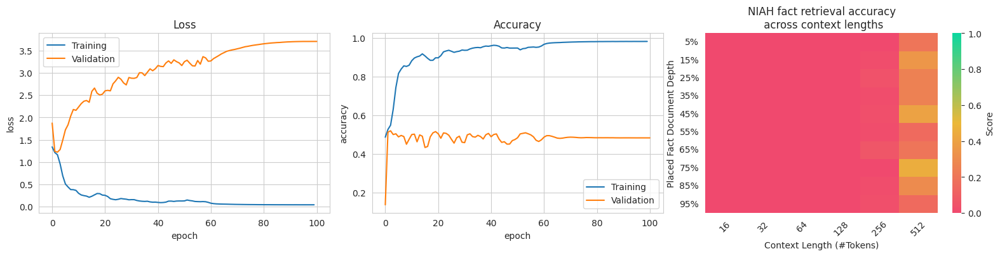

In [ ]:
linformer_train_and_plot_graphs(SimpleLinformer(d_model=32, nhead=4, nlayer=5, seqlength=512, k=64), DFADataset, max_epochs=100, seqlength = 512, n_samples=4096)

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=100` reached.


INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test acc          │     0.63116455078125      │
│         test loss         │    0.9957919120788574     │
└───────────────────────────┴───────────────────────────┘

100%|██████████| 4/4 [00:03<00:00,  1.14it/s]


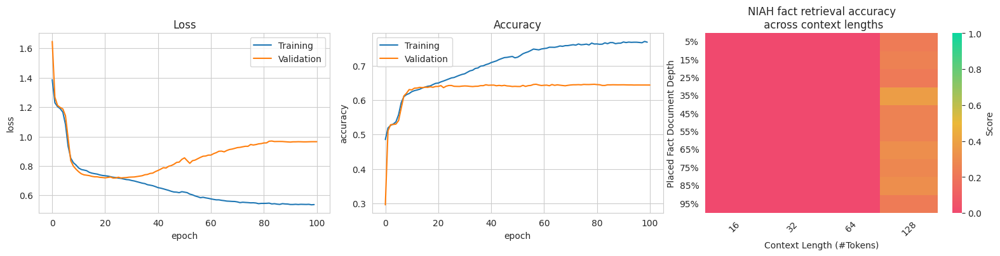

In [ ]:
# I observed that smaller linformers with *severe* bottlenecks generalised better
# this is likely because such a small models were unable to overfit to the dataset and thus had to learn *some* statistical correlations...
# but the statistical correlations learnt were never more learning when to guess 'no token' and when to randomly guess

# d_model=32, nhead=4, nlayer=3, seqlength=128, k=4: test_acc = 0.56
# d_model=32, nhead=4, nlayer=3, seqlength=128, k=2: test_acc = 0.52
# d_model=32, nhead=4, nlayer=4, seqlength=128, k=2: test_acc = 0.52
# d_model=32, nhead=8, nlayer=3, seqlength=128, k=4: test_acc = 0.61
# d_model=16, nhead=8, nlayer=3, seqlength=128, k=4: test_acc = 0.46
# d_model=64, nhead=8, nlayer=3, seqlength=128, k=4: test_acc = 0.52
linformer_train_and_plot_graphs(SimpleLinformer(d_model=32, nhead=8, nlayer=3, seqlength=128, k=4), DFADataset, max_epochs=100, seqlength = 128, n_samples=4096)

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=100` reached.


INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test acc          │     0.545196533203125     │
│         test loss         │    3.0903475284576416     │
└───────────────────────────┴───────────────────────────┘

100%|██████████| 4/4 [00:48<00:00, 12.15s/it]


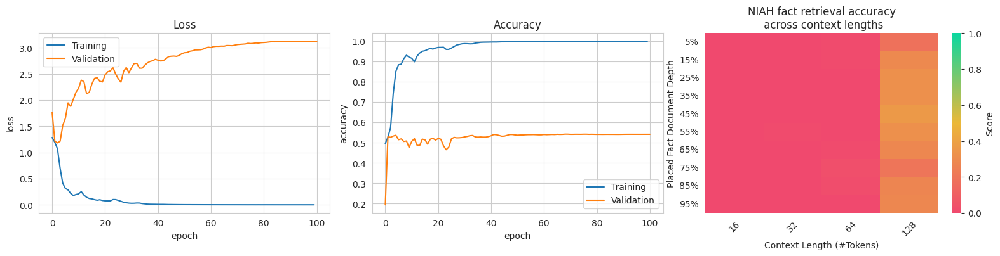

In [ ]:
linformer_train_and_plot_graphs(SimpleLinformer(d_model=64, nhead=4, nlayer=5, seqlength=128, k=1024), DFADataset, max_epochs=100, seqlength = 128, n_samples=4096)

We observe incredibly poor generalisation. I conject that the lack of a causal mask (or ability to add a causal mask) is causing the linformer to overfit dramatically to the training dataset and thus it isn't approximating a Finite Automaton at all -- rather recognising patterns in the (very long and thus very unique) strings it is being passed. I observed minimal generalisation (62% accuracy) when I bottlenecked k to 4! Given that this dataset is relatively simple and that 50% accuracy can be reached by repeatedly asserting that there *is* no key, 62% accuracy is very weak and demonstrates almost no generalisation. This accuracy can be achieved by guessing 'no token' for the first three quarters of the text and guessing a random token in the last quarter of the dataset.

I believe the underlying assumptions for the linformer are violated for the needle in a haystack task. Each position wants to attend only to the position immediately before it. However, all positions are embedded into a low-dimensional space and thus its impossible for the position to determine what position precedes it. If the bottleneck is large enough for this information to be maintained then the model is excessively overparamaterised and overfits.

To validate the conjecture that this is partially because the model has no causality, I take a transformer (which achieved 99.9% accuracy) with causal masking and remove causality. If causality is forcing the models to mimic Finite Automaton then by removing the causal mask from the transformer, we will observe a significant decrease in validation/test performance with no meaningful change in training performance.

In [ ]:
class NoncausalTransformer(nn.Module):
    def __init__(self, in_dims:int = 5, out_dims:int = 5, nlayer=3, dim=64, nhead=4):
        super().__init__()
        self.embedding = nn.Embedding(num_embeddings=in_dims, embedding_dim=dim)
        self.positional_embedding = PositionalEmbedding(embedding_dim=dim, max_len=128)
        self.decoders = nn.ParameterList(
            (
                nn.TransformerEncoderLayer(nhead=nhead, d_model = dim, dim_feedforward=dim, batch_first=True)
                for _ in range(nlayer)
            )
        )
        self.fc = nn.Linear(dim, out_dims)

    def forward(self, x):
        y = self.embedding(x)
        y = self.positional_embedding(y)
        # note we do not use a causal mask in this situation
        for decoder in self.decoders:
            y = decoder(y)
        y = self.fc(y)
        return y

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=100` reached.


INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test acc          │     0.632293701171875     │
│         test loss         │     0.783454418182373     │
└───────────────────────────┴───────────────────────────┘

100%|██████████| 8/8 [00:03<00:00,  2.15it/s]


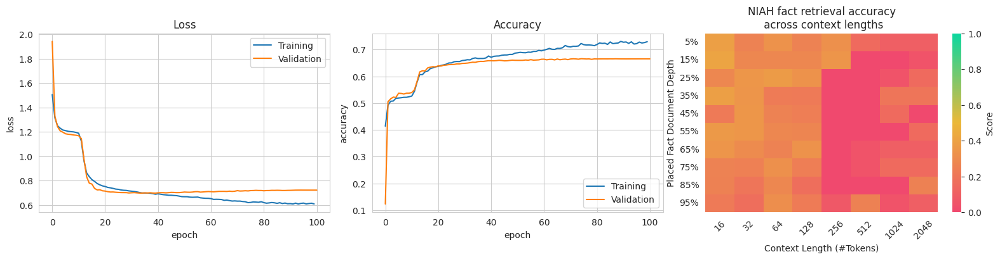

In [ ]:
noncausaltransformer_dfa = NoncausalTransformer(dim = 64, nlayer = 3)
train_and_plot_graphs(noncausaltransformer_dfa, DFADataset) # achieves 99.9% accuracy and generalises well (especially to shorter sequences) when a causal mask is present
del noncausaltransformer_dfa

We have indeed observed a decrease in validation performance (initially we observed a rapid convergence to almost 100%) whereas now, we observe performance around 90% after substantially longer. Furthermore, the generalisation of the model to longer sequence lenghts is substantially poorer. This indicates that causal masking is necessary to force models to learn to approximate Finite Automaton. In light of this observation, I will not investigate Linformer.

As with all negative results, it's essential to check they are not flaws in implementations. To this end, I take an open [source implementation of a linformer](https://github.com/lucidrains/linformer) and **validate that their implementation suffers from the same problems**.

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=100` reached.


INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test acc          │    0.4759082794189453     │
│         test loss         │     5.12821626663208      │
└───────────────────────────┴───────────────────────────┘

100%|██████████| 6/6 [00:15<00:00,  2.52s/it]


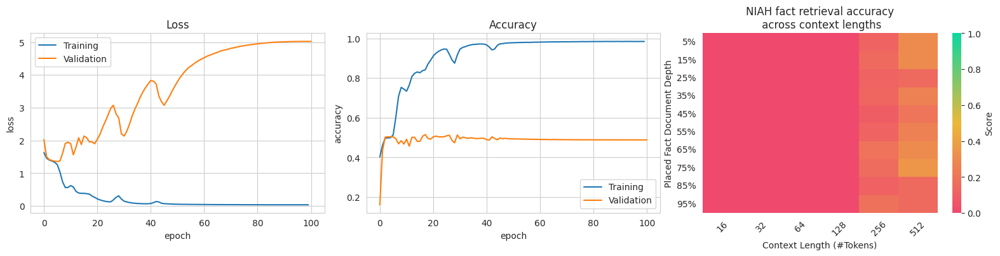

In [ ]:
# the code below is not my own but is an open source implementation

from operator import itemgetter
from torch.autograd.function import Function
from torch.utils.checkpoint import get_device_states, set_device_states

# for routing arguments into the functions of the reversible layer
def route_args(router, args, depth):
    routed_args = [(dict(), dict()) for _ in range(depth)]
    matched_keys = [key for key in args.keys() if key in router]

    for key in matched_keys:
        val = args[key]
        for depth, ((f_args, g_args), routes) in enumerate(zip(routed_args, router[key])):
            new_f_args, new_g_args = map(lambda route: ({key: val} if route else {}), routes)
            routed_args[depth] = ({**f_args, **new_f_args}, {**g_args, **new_g_args})
    return routed_args

def layer_drop(layers, prob):
    to_drop = torch.empty(len(layers)).uniform_(0, 1) < prob
    blocks = [block for block, drop in zip(layers, to_drop) if not drop]
    blocks = layers[:1] if len(blocks) == 0 else blocks
    return blocks

# following example for saving and setting rng here https://pytorch.org/docs/stable/_modules/torch/utils/checkpoint.html
class Deterministic(nn.Module):
    def __init__(self, net):
        super().__init__()
        self.net = net
        self.cpu_state = None
        self.cuda_in_fwd = None
        self.gpu_devices = None
        self.gpu_states = None

    def record_rng(self, *args):
        self.cpu_state = torch.get_rng_state()
        if torch.cuda._initialized:
            self.cuda_in_fwd = True
            self.gpu_devices, self.gpu_states = get_device_states(*args)

    def forward(self, *args, record_rng = False, set_rng = False, **kwargs):
        if record_rng:
            self.record_rng(*args)

        if not set_rng:
            return self.net(*args, **kwargs)

        rng_devices = []
        if self.cuda_in_fwd:
            rng_devices = self.gpu_devices

        with torch.random.fork_rng(devices=rng_devices, enabled=True):
            torch.set_rng_state(self.cpu_state)
            if self.cuda_in_fwd:
                set_device_states(self.gpu_devices, self.gpu_states)
            return self.net(*args, **kwargs)

# heavily inspired by https://github.com/RobinBruegger/RevTorch/blob/master/revtorch/revtorch.py
# once multi-GPU is confirmed working, refactor and send PR back to source
class ReversibleBlock(nn.Module):
    def __init__(self, f, g):
        super().__init__()
        self.f = Deterministic(f)
        self.g = Deterministic(g)

    def forward(self, x, f_args = {}, g_args = {}):
        x1, x2 = torch.chunk(x, 2, dim=2)
        y1, y2 = None, None

        with torch.no_grad():
            y1 = x1 + self.f(x2, record_rng=self.training, **f_args)
            y2 = x2 + self.g(y1, record_rng=self.training, **g_args)

        return torch.cat([y1, y2], dim=2)

    def backward_pass(self, y, dy, f_args = {}, g_args = {}):
        y1, y2 = torch.chunk(y, 2, dim=2)
        del y

        dy1, dy2 = torch.chunk(dy, 2, dim=2)
        del dy

        with torch.enable_grad():
            y1.requires_grad = True
            gy1 = self.g(y1, set_rng=True, **g_args)
            torch.autograd.backward(gy1, dy2)

        with torch.no_grad():
            x2 = y2 - gy1
            del y2, gy1

            dx1 = dy1 + y1.grad
            del dy1
            y1.grad = None

        with torch.enable_grad():
            x2.requires_grad = True
            fx2 = self.f(x2, set_rng=True, **f_args)
            torch.autograd.backward(fx2, dx1, retain_graph=True)

        with torch.no_grad():
            x1 = y1 - fx2
            del y1, fx2

            dx2 = dy2 + x2.grad
            del dy2
            x2.grad = None

            x = torch.cat([x1, x2.detach()], dim=2)
            dx = torch.cat([dx1, dx2], dim=2)

        return x, dx

class _ReversibleFunction(Function):
    @staticmethod
    def forward(ctx, x, blocks, args):
        ctx.args = args
        for block, kwarg in zip(blocks, args):
            x = block(x, **kwarg)
        ctx.y = x.detach()
        ctx.blocks = blocks
        return x

    @staticmethod
    def backward(ctx, dy):
        y = ctx.y
        args = ctx.args
        for block, kwargs in zip(ctx.blocks[::-1], args[::-1]):
            y, dy = block.backward_pass(y, dy, **kwargs)
        return dy, None, None


class SequentialSequence(nn.Module):
    def __init__(self, layers, args_route = {}, layer_dropout = 0.):
        super().__init__()
        assert all(len(route) == len(layers) for route in args_route.values()), 'each argument route map must have the same depth as the number of sequential layers'
        self.layers = layers
        self.args_route = args_route
        self.layer_dropout = layer_dropout

    def forward(self, x, **kwargs):
        args = route_args(self.args_route, kwargs, len(self.layers))
        layers_and_args = list(zip(self.layers, args))

        if self.training and self.layer_dropout > 0:
            layers_and_args = layer_drop(layers_and_args, self.layer_dropout)

        for (f, g), (f_args, g_args) in layers_and_args:
            x = x + f(x, **f_args)
            x = x + g(x, **g_args)
        return x

class ReversibleSequence(nn.Module):
    def __init__(self, blocks, args_route = {}, layer_dropout = 0.):
        super().__init__()
        self.args_route = args_route
        self.layer_dropout = layer_dropout
        self.blocks = nn.ModuleList([ReversibleBlock(f=f, g=g) for f, g in blocks])

    def forward(self, x, **kwargs):
        x = torch.cat([x, x], dim=-1)

        blocks = self.blocks
        args = route_args(self.args_route, kwargs, len(blocks))
        args = list(map(lambda x: {'f_args': x[0], 'g_args': x[1]}, args))

        layers_and_args = list(zip(blocks, args))

        if self.training and self.layer_dropout > 0:
            layers_and_args = layer_drop(layers_and_args, self.layer_dropout)
            blocks, args = map(lambda ind: list(map(itemgetter(ind), layers_and_args)), (0, 1))

        out =  _ReversibleFunction.apply(x, blocks, args)
        return torch.stack(out.chunk(2, dim=-1)).sum(dim=0)

def default(val, default_val):
    return val if val is not None else default_val

def init_(tensor):
    dim = tensor.shape[-1]
    std = 1 / math.sqrt(dim)
    tensor.uniform_(-std, std)
    return tensor

# helper classes

class Residual(nn.Module):
    def __init__(self, fn):
        super().__init__()
        self.fn = fn
    def forward(self, x):
        return x + self.fn(x)

class PreNorm(nn.Module):
    def __init__(self, dim, fn):
        super().__init__()
        self.fn = fn
        self.norm = nn.LayerNorm(dim)
    def forward(self, x):
        x = self.norm(x)
        return self.fn(x)

class GELU_(nn.Module):
    def forward(self, x):
        return 0.5 * x * (1 + torch.tanh(math.sqrt(2 / math.pi) * (x + 0.044715 * torch.pow(x, 3))))

GELU = nn.GELU if hasattr(nn, 'GELU') else GELU_

class FeedForward(nn.Module):
    def __init__(self, dim, mult = 4, dropout = 0., activation = None, glu = False):
        super().__init__()
        activation = default(activation, GELU)

        self.glu = glu
        self.w1 = nn.Linear(dim, dim * mult * (2 if glu else 1))
        self.act = activation()
        self.dropout = nn.Dropout(dropout)
        self.w2 = nn.Linear(dim * mult, dim)

    def forward(self, x, **kwargs):
        if not self.glu:
            x = self.w1(x)
            x = self.act(x)
        else:
            x, v = self.w1(x).chunk(2, dim=-1)
            x = self.act(x) * v

        x = self.dropout(x)
        x = self.w2(x)
        return x

class LinformerSelfAttention(nn.Module):
    def __init__(self, dim, seq_len, k = 256, heads = 8, dim_head = None, one_kv_head = False, share_kv = False, dropout = 0.):
        super().__init__()
        assert (dim % heads) == 0, 'dimension must be divisible by the number of heads'

        self.seq_len = seq_len
        self.k = k

        self.heads = heads

        dim_head = default(dim_head, dim // heads)
        self.dim_head = dim_head

        self.to_q = nn.Linear(dim, dim_head * heads, bias = False)

        kv_dim = dim_head if one_kv_head else (dim_head * heads)
        self.to_k = nn.Linear(dim, kv_dim, bias = False)
        self.proj_k = nn.Parameter(init_(torch.zeros(seq_len, k)))

        self.share_kv = share_kv
        if not share_kv:
            self.to_v = nn.Linear(dim, kv_dim, bias = False)
            self.proj_v = nn.Parameter(init_(torch.zeros(seq_len, k)))

        self.dropout = nn.Dropout(dropout)
        self.to_out = nn.Linear(dim_head * heads, dim)

    def forward(self, x, context = None, **kwargs):
        b, n, d, d_h, h, k = *x.shape, self.dim_head, self.heads, self.k

        kv_len = n if context is None else context.shape[1]
        assert kv_len <= self.seq_len, f'the sequence length of the key / values must be {self.seq_len} - {kv_len} given'

        queries = self.to_q(x)

        proj_seq_len = lambda args: torch.einsum('bnd,nk->bkd', *args)

        kv_input = x if context is None else context

        keys = self.to_k(kv_input)
        values = self.to_v(kv_input) if not self.share_kv else keys

        kv_projs = (self.proj_k, self.proj_v if not self.share_kv else self.proj_k)

        # allow for variable sequence lengths (less than maximum sequence length) by slicing projections

        if kv_len < self.seq_len:
            kv_projs = map(lambda t: t[:kv_len], kv_projs)

        # project keys and values along the sequence length dimension to k

        keys, values = map(proj_seq_len, zip((keys, values), kv_projs))

        # merge head into batch for queries and key / values

        queries = queries.reshape(b, n, h, -1).transpose(1, 2)

        merge_key_values = lambda t: t.reshape(b, k, -1, d_h).transpose(1, 2).expand(-1, h, -1, -1)
        keys, values = map(merge_key_values, (keys, values))

        # attention

        dots = torch.einsum('bhnd,bhkd->bhnk', queries, keys) * (d_h ** -0.5)
        attn = dots.softmax(dim=-1)
        attn = self.dropout(attn)
        out = torch.einsum('bhnk,bhkd->bhnd', attn, values)

        # split heads
        out = out.transpose(1, 2).reshape(b, n, -1)
        return self.to_out(out)

class Linformer(nn.Module):
    def __init__(self, dim, seq_len, depth, k = 256, heads = 8, dim_head = None, one_kv_head = False, share_kv = False, reversible = False, dropout = 0.):
        super().__init__()
        layers = nn.ModuleList([])
        for _ in range(depth):
            attn = LinformerSelfAttention(dim, seq_len, k = k, heads = heads, dim_head = dim_head, one_kv_head = one_kv_head, share_kv = share_kv, dropout = dropout)
            ff = FeedForward(dim, dropout = dropout)

            layers.append(nn.ModuleList([
                PreNorm(dim, attn),
                PreNorm(dim, ff)
            ]))

        execute_type = ReversibleSequence if reversible else SequentialSequence
        self.net = execute_type(layers)

    def forward(self, x):
        return self.net(x)

class LinformerLM(nn.Module):
    def __init__(self, num_tokens, dim, seq_len, depth, k = 256, heads = 8, dim_head = None, one_kv_head = False, share_kv = False, reversible = False, dropout = 0.):
        super().__init__()
        self.token_emb = nn.Embedding(num_tokens, dim)
        self.pos_emb = nn.Embedding(seq_len, dim)
        self.linformer = Linformer(dim, seq_len, depth, k = k, heads = heads, dim_head = dim_head,
                one_kv_head = one_kv_head, share_kv = share_kv, reversible = reversible, dropout = dropout)
        self.to_logits = nn.Linear(dim, num_tokens)

    def forward(self, x):
        x = self.token_emb(x)
        x = self.pos_emb(torch.arange(x.shape[1], device=x.device)) + x
        x = self.linformer(x)
        out = self.to_logits(x)
        return out

linformer_dfa_oss = LinformerLM(num_tokens=5, dim=64, heads=4,seq_len=512, depth=3, k=128, dropout=0.1)
linformer_train_and_plot_graphs(linformer_dfa_oss, DFADataset, max_epochs=100, seqlength = 512, n_samples=1024)
del linformer_dfa_oss

It seems like the lack of causality combined with the bottleneck limits the generalisation of the Linformer achitecture and causing it to overfit and *not approximate a DFA at all*. Due to the incredibly poor performance in this setting both of my own implementation and of open source implementations for all hyperparameters (I tried *many* more which are not listed here); I do no further investigation.

#### Sparse Transformer

Next, I implement a sparse transformer. We observe worse performance than the transformer -- but significantly better performance than the linformer. This is expected -- the sparse transformer has a more restricted form of attention than the transformer but much less restricted attention than the linformer.

I hypothesise that this performance difference is due to the limited information flow in a Sparse Transformer and the inherant requirement for information propagation from previous positions to one specific position and then from that position to all later positions.

In [ ]:
import torch.nn.functional as F
import math

class SparseMultiheadAttention(nn.Module):
    def __init__(self, nhead: int, d_model: int, dim_feedforward: int, stride: int, dropout: float = 0.1):
        super().__init__()
        self.nhead = nhead
        self.l = stride
        self.d = d_model
        self.dropout = dropout
        self.query_local = nn.Linear(d_model, d_model // 2, bias=False)
        self.key_local = nn.Linear(d_model, d_model // 2, bias=False)
        self.value_local = nn.Linear(d_model, d_model // 2, bias=False)
        self.query_strided = nn.Linear(d_model, d_model // 2, bias=False)
        self.key_strided = nn.Linear(d_model, d_model // 2, bias=False)
        self.value_strided = nn.Linear(d_model, d_model // 2, bias=False)

        self.proj = nn.Linear(d_model, d_model)

    def forward(self, x):
        b, n, d = *x.size(),

        local_mask = torch.zeros((n, n))
        arange = torch.arange(n).reshape(1, -1).expand(n, n)
        # causality
        local_mask[arange > torch.arange(n).reshape(-1, 1)] = -torch.inf
        # locality
        local_mask[(arange // self.l) != (torch.arange(n).reshape(-1, 1) // self.l)] = -torch.inf

        strided_mask = torch.zeros((n, n))
        # causality
        strided_mask[arange > torch.arange(n).reshape(-1, 1)] = -torch.inf
        # striding
        strided_mask[arange % self.l != 0] = -torch.inf

        q_l = self.query_local(x).reshape(b, n, self.nhead // 2, -1).permute(0, 2, 1, 3)
        k_l = self.key_local(x).reshape(b, n, self.nhead // 2, -1).permute(0, 2, 1, 3)
        v_l = self.value_local(x).reshape(b, n, self.nhead // 2, -1).permute(0, 2, 1, 3)
        attention_local = F.scaled_dot_product_attention(q_l, k_l, v_l, local_mask.cuda(), self.dropout, scale=1 / math.sqrt(2 * q_l.size(-1)))

        q_s = self.query_strided(x).reshape(b, n, self.nhead // 2, -1).permute(0, 2, 1, 3)
        k_s = self.key_strided(x).reshape(b, n, self.nhead // 2, -1).permute(0, 2, 1, 3)
        v_s = self.value_strided(x).reshape(b, n, self.nhead // 2, -1).permute(0, 2, 1, 3)
        attention_strided = F.scaled_dot_product_attention(q_s, k_s, v_s, strided_mask.cuda(), self.dropout, scale=1 / math.sqrt(2 * q_s.size(-1)))

        attention = torch.cat((attention_local, attention_strided), dim=-1).reshape(b, n, -1)

        y = self.proj(attention)

        return y


class SparseTransformerEncoderLayer(nn.Module):
    def __init__(self, nhead: int, d_model: int, seqlength: int, stride: int = None, dim_feedforward: int = 2048, dropout: float = 0.1, norm_first: bool = False):
        super().__init__()
        if stride is None:
            stride = round(seqlength ** 0.5)
        self.self_attn = SparseMultiheadAttention(nhead, d_model, seqlength, stride = stride, dropout=dropout)
        self.linear1 = nn.Linear(d_model, dim_feedforward, bias=False)
        self.dropout = nn.Dropout(dropout)
        self.linear2 = nn.Linear(dim_feedforward, d_model, bias=False)

        self.norm_first = norm_first
        self.norm1 = nn.LayerNorm(d_model, eps=1e-5, bias=False)
        self.norm2 = nn.LayerNorm(d_model, eps=1e-5, bias=False)
        self.dropout1 = nn.Dropout(dropout)
        self.dropout2 = nn.Dropout(dropout)

    def forward(self, x):
        if self.norm_first:
            x = x + self._sa_block(self.norm1(x))
            x = x + self._ff_block(self.norm2(x))
        else:
            x = self.norm1(x + self._sa_block(x))
            x = self.norm2(x + self._ff_block(x))
        return x

    def _sa_block(self, x):
        x = self.self_attn(x)
        return self.dropout1(x)

    def _ff_block(self, x):
        x = self.linear2(self.dropout(F.relu(self.linear1(x))))
        return self.dropout2(x)


class SparseTransformer(nn.Module):
    def __init__(self, in_dims:int = 5, out_dims:int = 5, nlayer=3, dim=64, nhead=4, seqlength = 128, stride = None):
        super().__init__()
        self.embedding = nn.Embedding(num_embeddings=in_dims, embedding_dim=dim)
        self.positional_embedding = PositionalEmbedding(embedding_dim=dim, max_len=128)
        self.decoders = nn.ParameterList(
            (
                SparseTransformerEncoderLayer(nhead=nhead, d_model = dim, dim_feedforward=dim, seqlength=seqlength, stride=stride)
                for _ in range(nlayer)
            )
        )
        self.fc = nn.Linear(dim, out_dims)

    def forward(self, x):
        y = self.embedding(x)
        y = self.positional_embedding(y)
        # note that we use masking to limit what the sparse transformer can see
        # this does not lead to computational efficiency -- but the sparse transformer requires a custom GPU kernels to efficiently implement sparse operations
        # so, I consider this simulated sparseness sufficient
        for decoder in self.decoders:
            y = decoder(y)
        y = self.fc(y)
        return y

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=100` reached.


INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test acc          │     0.573089599609375     │
│         test loss         │     1.082118272781372     │
└───────────────────────────┴───────────────────────────┘

100%|██████████| 8/8 [01:37<00:00, 12.22s/it]


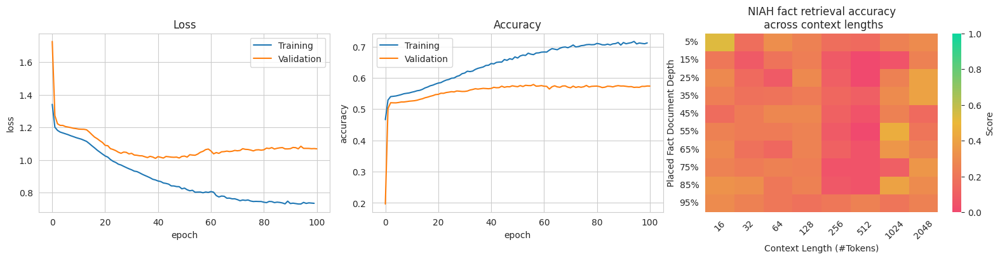

In [ ]:
sparsetransformer_dfa = SparseTransformer(dim = 64, nhead=4, nlayer = 4, seqlength=128)
train_and_plot_graphs(sparsetransformer_dfa, DFADataset, max_epochs=100)

I conject that the limited information flow of a sparse transformer means the architecture is physically unable to represent the function required with only 4 layers. I therefore increase the number of layers to 8!

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=100` reached.


INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test acc          │     0.62567138671875      │
│         test loss         │    1.3713589906692505     │
└───────────────────────────┴───────────────────────────┘

100%|██████████| 8/8 [03:06<00:00, 23.35s/it]


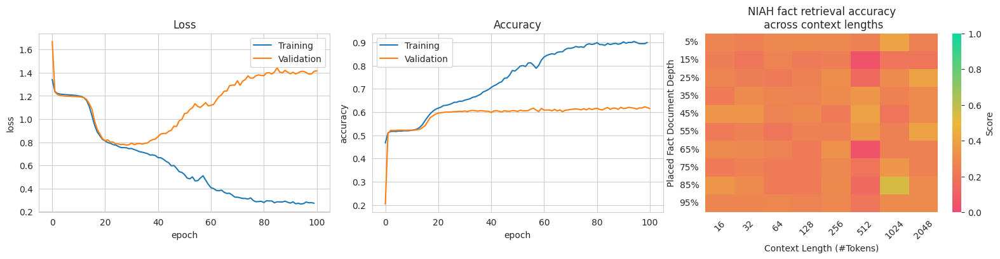

In [ ]:
sparsetransformer_dfa = SparseTransformer(dim = 64, nhead=8, nlayer = 8, seqlength=128)
train_and_plot_graphs(sparsetransformer_dfa, DFADataset, max_epochs=100, n_samples=1024)

As hypothesised, we observed increased marginally increased generalisation. I increase the depth further and decrease the dimensions and heads in an attempt to prevent overfitting.

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=100` reached.


INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test acc          │     0.623016357421875     │
│         test loss         │    0.7444357872009277     │
└───────────────────────────┴───────────────────────────┘

100%|██████████| 8/8 [03:46<00:00, 28.34s/it]


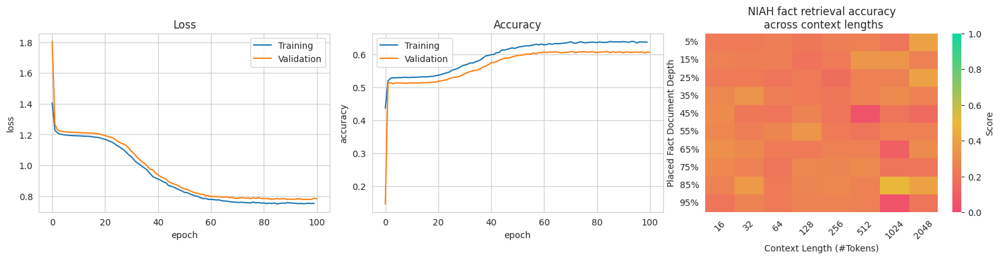

In [ ]:
sparsetransformer_dfa = SparseTransformer(dim = 32, nhead=4, nlayer = 10, seqlength=128)
train_and_plot_graphs(sparsetransformer_dfa, DFADataset, max_epochs=100, n_samples=1024)

Now, try a larger dataset size to demonstrate that the model will learn, evaluate its generalisation better and demonstrate that it is functionally correct.

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=100` reached.


INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test acc          │    0.7718658447265625     │
│         test loss         │    0.5997133851051331     │
└───────────────────────────┴───────────────────────────┘

100%|██████████| 8/8 [03:04<00:00, 23.12s/it]


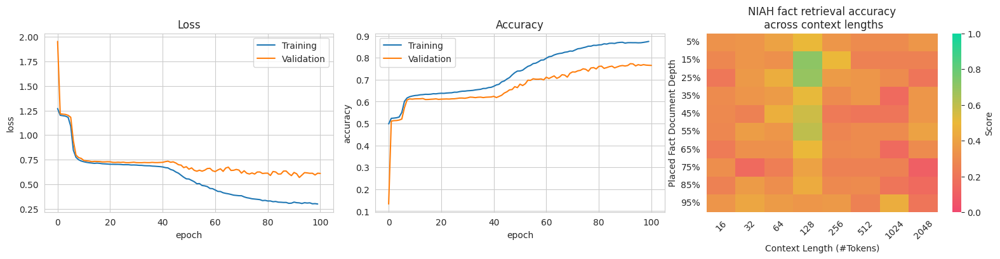

In [ ]:
sparsetransformer_dfa = SparseTransformer(dim = 64, nhead=8, nlayer = 8, seqlength=128)
train_and_plot_graphs(sparsetransformer_dfa, DFADataset, max_epochs=100, n_samples=4096)
del sparsetransformer_dfa

We observe that by increasing the dataset size, we can make the model learn to approximate the DFA. Note furthermore that a much *deeper* network was required to learn this. I realised that the sparse transformers expressivity was limited for this task. To propagate an arbitrary position to another arbitrary position (after it) requires 3 layers! Given that the original transformers were 3 layers deep, this would require them to recognise the trigger instantly. Furthermore, if the trigger is on the border between two local masks, then the network requires 4 layers to even propagate the information. As such, the network must be much deeper to send information through. The architecture of the sparse transformer is therefore ill-suited to the NIAH task. Although this does not fundamentally limit its expressivity, it limits is performance empirically.

---

### Adversarial Attacks

#### Introduction

I implement adversarial attacks to evaluate the robustness of the representations that the transformer and GRNN are learning. I do this by searching (white-box) for adversarial samples. I search for the cases where models *do not* approximate finite automaton. If we are generally unable to; then this indicates that the model is truly approximating a finite automaton.

I start off by a greedy hill climbing algorithm which operates on discrete datapoints. I then implement a [gridient-based attack](https://arxiv.org/abs/1604.08275) -- when it fails I then try to generalise and improve it s.t. it works on this dataset. This does not succeed. I conject the reason the gradient-based methods fail in this situation is that gradient approximations are only locally valid -- and there are so few tokens that any changes we make are *not* local.

#### Methodology

##### Greedy Algorithm (simple first attempt)

A greedy brute-force hill climbing search for adversarial examples; I augment valid data into adversarial examples. The algorithm I try is: select $n$ random (possibly duplicated) indices, and for each index (if it does not make up part of the key), change the word there to the word which maximises the loss (and does not create a new key). This attack is highly successful on both transformers and GRNNs. I plot graphs similar to NIAH to show effectiveness at different needle positions.

#### [Projected FSGM](https://arxiv.org/abs/1604.08275)

The previous attack works but is computationally intensive. I now start searching for more computationally efficient attacks.

I select $k$ random features; and for each feature $w$, replace it by $w'$ such that $\|\mathrm{sign}(\mathrm{emb}(w') - \mathrm{emb}(w)) - \mathrm{sign}(\nabla f)\|$ is minimised.

#### Saliency FGSM [described here](https://www.jmlr.org/papers/volume21/19-569/19-569.pdf)

I use the gradients to select the top $k$ features by the gradient magnitude and for each of those features $w$, replace it by $w'$ such that $\|\mathrm{sign}(\mathrm{emb}(w') - \mathrm{emb}(w)) - \mathrm{sign}(\nabla f)\|$ is minimised *i.e.* apply FGSM to the $k$ most important words which do not form part of the key. This aims to be a computationally efficient attack. However, this *does not work*, even when iterated many times.

#### CosineSimilarity Augmentation (adaptation of method above)

In light of the inneffectiveness of Saliency FSGM, I propose a generalisation where we use the cosine similarity of the direction $w' - w$ and the gradient $\nabla \mathcal L$ rather than just the sign. I find that this method suffers from the same problems as the FGSM method and conclude that efficient gradient-based approaches for discrete data with such sparse datapoints is unlikely to be achievable.

i.e. for all positions, we find $S = (\mathrm{emb}(w') - \mathrm{emb}(w)) \cdot \nabla \mathcal L$. This is a metric of the *similarity* of any particular change to the direction of the gradient. We then find the changes with the largest values of $S$ and make them. Similar to FSGM, this can be iterated. Once again, we prevent changing the key.

##### Adversarial Suffixes (ambitious exploration)

In light of the success of the greedy method, I decide for a more ambitious gradient-based approach; searching for adversarial suffixes which can be concatenated onto *any* sequence and will cause misclassification to the target class. This approach is methodologically interesting but empirically does discretisation prevents it from working well. I hypothesise that it *would* work if the embedding space was more densely populated. Similar attacks are known to have worked on "early" LLMs (*i.e.* GPT2).

I try both targeted and untargeted attacks. The goal of both of these is to find an adversarial suffix causing misclassification in the desired way; such that this adversarial perturbation is sufficiently close to the embeddings of real words that when it is discretised, the discretisation is *still* an adversarial suffix.

This algorithm applied gradient descent using the following loss function
$$
\mathcal{L} = -\mathsf{CSE}(m(\mathbf{X} \parallel \mathsf{suffix}), \mathbf{Y}) + \alpha \sum_{s \in \mathsf{suffix}} \min_{e \in \text{embeddings}} \|s - e\|
$$

#### Findings

I have *great success* in finding adversarial examples via greedy augmentation on all networks which I tried the attack on. The attack was more successful if the needle was hidden deeper in the network; and even greater success on longer examples. This indicates methodological success; and also indicates that the models learnt to approximate finite automaton well -- in-that we were unable to find adversarial examples on data like that which they were trained on. This indicates strong robustness.

Saliency-FSGM was generally inneffective in this example -- being unable to find adversarial examples in almost all cases.

My method: CosineSimilarity Augmentation was able to quickly and efficiently find adversarial examples.

Once again; I have *success* in finding *continuous* adversarial suffixes which cause misclassification. However, in all cases on DFADataset upon discretisation for all values of $\alpha$ no adversarial suffixes result in accuracy significanly lower than the accuracy with a randomly appended suffix. This is evidence that the models are *well* approximating the desired DFAs and that none of the languages recognisable by either RNNs, GRNNs or transformers are subsets of regular languages. Moreover, this implies that the weights necessary to recognise such languages are in a section of the loss-landscape which is comparatively well-behaved and is learnable.

### Greedy Search for Adversarial Samples

I start by demonstrating the methodology in a minimal example. I then show the increase in loss and the adversarial example found.

Later, I will thoroughly evaluate the success of this attack in the same format as NIAH.

In [ ]:
def greedy_adv_inputs(model, xs, ys, n_iter = 500):
    n_samples = xs.size(0)
    key = torch.argmax(1 * (xs == 4), dim=-1)

    model.eval()

    xs = xs.reshape(-1, *xs.size()).cuda()
    ys = ys.expand(4, *ys.size()).flatten().cuda()
    for i in torch.randint(xs.size(-1), (n_iter,)):

        # change the value to the worst word!
        probe = xs.expand(4, *xs.size()[1:]).clone()
        probe[:, :, i] = torch.arange(4).reshape(-1, 1)
        logits = model(probe.flatten(0, 1)).reshape(4, *xs.size()[1:], 5)
        loss = F.cross_entropy(logits.flatten(0, 2), ys, reduction='none').reshape(4, n_samples, -1).sum(-1)

        # choose the worst if we are not at a key!
        replace = loss.argmax(dim=0)
        replace[key == i] = 4
        replace[key + 1 == i] = xs[:, key + 1 == i, i]
        xs[:, :, i] = replace

    xs = xs.flatten(0, 1)
    return xs

In [ ]:
def plot_greedy_adv_success_grid(model, dataset, n_iter, name, lgmax=11):

    pre_loss_grid = torch.zeros((lgmax - 3, 5))
    acc_grid = torch.zeros((lgmax - 3, 5))
    post_loss_grid = torch.zeros((lgmax - 3, 5))

    plt.figure(figsize = (15,4))

    for i, seqlength in enumerate(map(lambda x: 2 ** x, trange(4, lgmax + 1))):
        for j, position in enumerate(map(lambda x: (seqlength * x) // 5, range(5))):
            size = 50
            xs, ys = dataset(n_samples = size, seqlength = seqlength, pos=(position, position + seqlength // 10)).tensors
            xs = xs.cuda()
            ys = ys.cuda()
            pre_loss_grid[i, j] = F.cross_entropy(model(xs.cuda()).flatten(0, 1), ys.cuda().flatten()).cpu()
            acc_grid[i, j] -= torch.count_nonzero(model(xs).argmax(dim=-1) != ys.cuda()).item() / size
            xs = greedy_adv_inputs(model, xs, ys, n_iter)
            acc_grid[i, j] += torch.count_nonzero(model(xs).argmax(dim=-1) != ys.cuda()).item() / size
            post_loss_grid[i, j] = F.cross_entropy(model(xs.cuda()).flatten(0, 1), ys.cuda().flatten()).cpu()

    cmap = LinearSegmentedColormap.from_list("custom_cmap", ["#F0496E", "#EBB839", "#0CD79F"])

    plt.subplot(1, 3, 1)
    sns.heatmap(
        torch.nan_to_num(pre_loss_grid.transpose(0, 1), torch.nan_to_num(pre_loss_grid, 0.).max().item()).detach(),
        fmt="g",
        cmap=cmap,
        cbar_kws={'label': 'Score'},
    )
    plt.title(f'NIAH Initial Loss \n across context lengths for a {name}')
    plt.xticks(ticks=list(i + 0.5 for i in range(lgmax - 3)), labels=[f'{2 ** i}' for i in range(4, lgmax + 1)], rotation=45)
    plt.yticks(ticks=list(i + 0.5 for i in range(5)), labels=[f'{i}%' for i in range(10, 100, 20)], rotation=0)
    plt.tight_layout()
    plt.xlabel('Context Length (#Tokens)')
    plt.ylabel('Placed Fact Document Depth')

    plt.subplot(1, 3, 2)
    sns.heatmap(
        torch.nan_to_num(post_loss_grid.transpose(0, 1), torch.nan_to_num(post_loss_grid, 0.).max().item()).detach(),
        fmt="g",
        cmap=cmap,
        cbar_kws={'label': 'Score'},
    )
    plt.title(f'NIAH Loss on Adversarial Inputs\n across context lengths for a {name}')
    plt.xticks(ticks=list(i + 0.5 for i in range(lgmax - 3)), labels=[f'{2 ** i}' for i in range(4, lgmax + 1)], rotation=45)
    plt.yticks(ticks=list(i + 0.5 for i in range(5)), labels=[f'{i}%' for i in range(10, 100, 20)], rotation=0)
    plt.tight_layout()
    plt.xlabel('Context Length (#Tokens)')
    plt.ylabel('Placed Fact Document Depth')

    plt.subplot(1, 3, 3)
    sns.heatmap(
        acc_grid.transpose(0, 1).detach(),
        fmt="g",
        cmap=cmap,
        cbar_kws={'label': 'Score'},
        vmin=0,
        vmax=1
    )
    plt.title(f'NIAH Greedy Attack Success Rate \n across context lengths for a {name}')
    plt.xticks(ticks=list(i + 0.5 for i in range(lgmax - 3)), labels=[f'{2 ** i}' for i in range(4, lgmax + 1)], rotation=45)
    plt.yticks(ticks=list(i + 0.5 for i in range(5)), labels=[f'{i}%' for i in range(10, 100, 20)], rotation=0)
    plt.tight_layout()
    plt.xlabel('Context Length (#Tokens)')
    plt.ylabel('Placed Fact Document Depth')

100%|██████████| 8/8 [00:13<00:00,  1.66s/it]


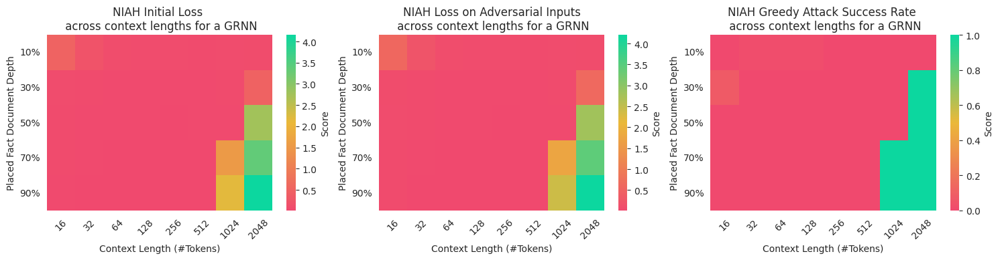

In [ ]:
plot_greedy_adv_success_grid(grnn_dfa.cuda(), DFADataset, 100, 'GRNN')

100%|██████████| 6/6 [00:18<00:00,  3.16s/it]


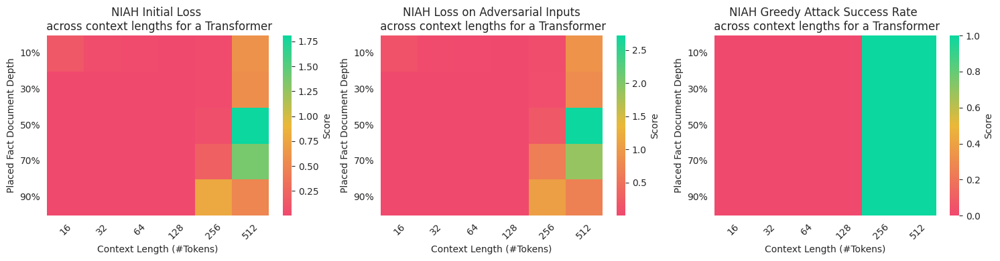

In [ ]:
# attacks on long contexts are computationally intractible but the results are conclusive enough that it's evident it would work
plot_greedy_adv_success_grid(transformer_dfa, DFADataset, 100, 'Transformer', lgmax=9)

We observe that the greedy attack works in the discrete case! Specifically, we observe that attacks on the GRNN are more successful when the needle is embedded very deeply in the input. However, attacks on the transformer are much more successful in general.

Observe that the axis for the loss-plots are different

Now that we know attacks are possible on the transformer, I try to implement more efficient attacks.

#### Projected FSGM

The previous attack *works*. But its computationally intensive. Now, I implement a method which attempts to generalise FSGM to the problem of adversarial examples in a *discrete* case. The goal is to get a *fast* and *efficient* attack against discrete data.


In [ ]:
def plot_salience_asr(fn, model, dataset, k, name, n_iter=1, lgmax=11):
    model.eval()

    pre_loss_grid = torch.zeros((lgmax - 3, 5))
    acc_grid = torch.zeros((lgmax - 3, 5))
    post_loss_grid = torch.zeros((lgmax - 3, 5))

    plt.figure(figsize = (15,4))

    for i, seqlength in enumerate(map(lambda x: 2 ** x, trange(4, lgmax + 1))):
        for j, position in enumerate(map(lambda x: (seqlength * x) // 5, range(5))):
            size = 50
            xs, ys = dataset(n_samples = size, seqlength = seqlength, pos=(position, position + seqlength // 10)).tensors
            xs = xs.cuda()
            ys = ys.cuda()
            pre_loss_grid[i, j] = F.cross_entropy(model(xs).flatten(0, 1), ys.flatten()).cpu()
            acc_grid[i, j] -= torch.count_nonzero(model(xs).argmax(dim=-1) != ys.cuda()).item() / ys.numel()
            for _ in range(n_iter):
                xs = fn(model, xs, ys, k)
            acc_grid[i, j] += torch.count_nonzero(model(xs).argmax(dim=-1) != ys.cuda()).item() / ys.numel()
            post_loss_grid[i, j] = F.cross_entropy(model(xs).flatten(0, 1), ys.flatten()).cpu()

    cmap = LinearSegmentedColormap.from_list("custom_cmap", ["#F0496E", "#EBB839", "#0CD79F"])

    plt.subplot(1, 3, 1)
    sns.heatmap(
        pre_loss_grid.transpose(0, 1).detach(),
        fmt="g",
        cmap=cmap,
        cbar_kws={'label': 'Score'},
    )
    plt.title(f'NIAH Initial Loss\n across context lengths for a {name}')
    plt.xticks(ticks=list(i + 0.5 for i in range(lgmax - 3)), labels=[f'{2 ** i}' for i in range(4, lgmax + 1)], rotation=45)
    plt.yticks(ticks=list(i + 0.5 for i in range(5)), labels=[f'{i}%' for i in range(10, 100, 20)], rotation=0)
    plt.tight_layout()
    plt.xlabel('Context Length (#Tokens)')
    plt.ylabel('Placed Fact Document Depth')

    plt.subplot(1, 3, 2)
    sns.heatmap(
        post_loss_grid.transpose(0, 1).detach(),
        fmt="g",
        cmap=cmap,
        cbar_kws={'label': 'Score'},
    )
    plt.title(f'NIAH Loss on Adversarial Inputs\n across context lengths for a {name}')
    plt.xticks(ticks=list(i + 0.5 for i in range(lgmax - 3)), labels=[f'{2 ** i}' for i in range(4, lgmax + 1)], rotation=45)
    plt.yticks(ticks=list(i + 0.5 for i in range(5)), labels=[f'{i}%' for i in range(10, 100, 20)], rotation=0)
    plt.tight_layout()
    plt.xlabel('Context Length (#Tokens)')
    plt.ylabel('Placed Fact Document Depth')

    plt.subplot(1, 3, 3)
    sns.heatmap(
        acc_grid.transpose(0, 1).detach(),
        fmt="g",
        cmap=cmap,
        cbar_kws={'label': 'Score'},
        vmin=0,
        vmax=1
    )
    plt.title(f'NIAH Saliency-FSGM Attack Success Rate \n across context lengths for a {name}')
    plt.xticks(ticks=list(i + 0.5 for i in range(lgmax - 3)), labels=[f'{2 ** i}' for i in range(4, lgmax + 1)], rotation=45)
    plt.yticks(ticks=list(i + 0.5 for i in range(5)), labels=[f'{i}%' for i in range(10, 100, 20)], rotation=0)
    plt.tight_layout()
    plt.xlabel('Context Length (#Tokens)')
    plt.ylabel('Placed Fact Document Depth')

In [ ]:
import copy


def projected_fgsm_dfa(model, xs, ys, k=100):
    model.train()
    [dropout.eval() for dropout in model.modules() if isinstance(dropout, nn.Dropout)]

    # we remove embedding layer so *need* to copy!
    model = copy.deepcopy(model)
    innermodel = model
    # extract the true model from the trainer
    while hasattr(innermodel, 'model'):
        innermodel = innermodel.model
    embedding = innermodel.embedding
    innermodel.embedding = nn.Identity()

    # compute the k most important features
    emb = nn.Parameter(embedding(xs).detach(), requires_grad=True)

    # compute the loss
    logits = model(emb)
    loss = F.cross_entropy(logits.flatten(0, 1), ys.flatten())
    loss.backward()

    # find the most salient features (which do not form part of the key)
    key = torch.argmax(1 * (xs == 4), dim=-1)
    # saliency[0] is the most important feature; saliency[-1] is the least important
    # get the k most salient features which are not the key
    kmost = torch.randperm(xs.size(-1)).reshape(1, -1).expand(xs.size(0), -1).cuda()
    kmost = kmost[(kmost != key.reshape(-1, 1)) & (kmost != key.reshape(-1, 1) + 1)].reshape(xs.size(0), xs.size(1) - 2)[:, :k]

    # features which maximise loss (except for the trigger)
    features = ((embedding.weight[:4].reshape(1, 1, -1, emb.size(-1)) - emb.reshape(xs.size(0), -1, 1, emb.size(-1))).sign() - emb.grad.reshape(xs.size(0), -1, 1, emb.data.size(-1)).sign()).pow(2).sum(-1).argmin(-1)

    # replace the k most salient features
    indx = torch.arange(xs.size(0)).reshape(-1, 1).expand(-1, kmost.size(-1)).flatten()
    xs[indx, kmost.flatten()] = features[indx, kmost.flatten()]

    return xs


100%|██████████| 8/8 [00:06<00:00,  1.24it/s]


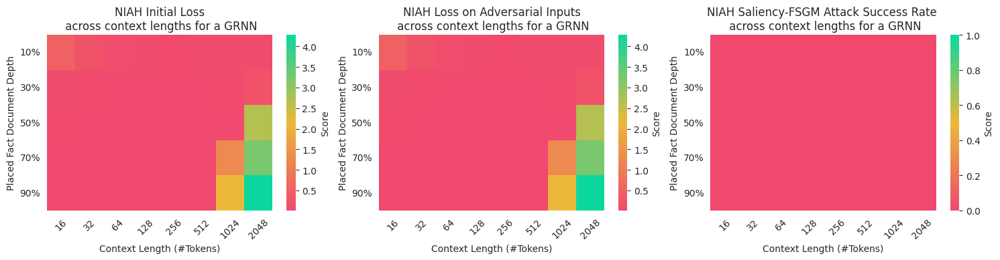

In [ ]:
plot_salience_asr(projected_fgsm_dfa, grnn_dfa, DFADataset, 50, n_iter=20, name='GRNN')

100%|██████████| 6/6 [00:21<00:00,  3.63s/it]


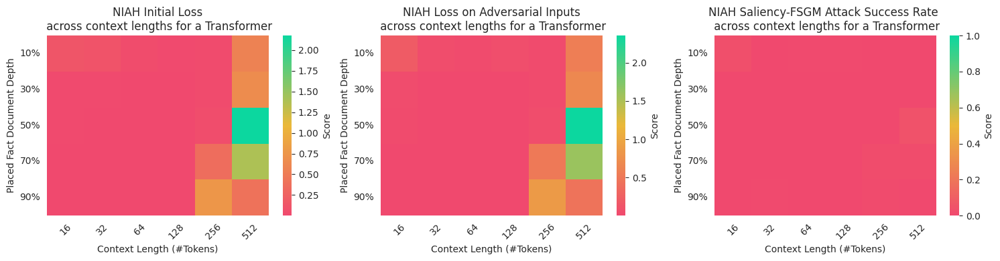

In [ ]:
plot_salience_asr(projected_fgsm_dfa, transformer_dfa, DFADataset, 100, n_iter=50, name='Transformer', lgmax=9)

We see that this attack can slightly increase the loss -- but it is unable to create adversarial examples for this dataset.

#### Saliency-FGSM

We aim to use a saliency map (i.e. find the features which the highest gradients) and then use FSGM to approximate which words replacing them with would do the most damage to model performance.

In [ ]:
import copy


def saliency_fgsm_dfa(model, xs, ys, k=100):
    model.train()
    [dropout.eval() for dropout in model.modules() if isinstance(dropout, nn.Dropout)]

    # we remove embedding layer so *need* to copy!
    model = copy.deepcopy(model)
    innermodel = model
    # extract the true model from the trainer
    while hasattr(innermodel, 'model'):
        innermodel = innermodel.model
    embedding = innermodel.embedding
    innermodel.embedding = nn.Identity()

    # compute the k most important features
    emb = nn.Parameter(embedding(xs).detach(), requires_grad=True)

    # compute the loss
    logits = model(emb)
    loss = F.cross_entropy(logits.flatten(0, 1), ys.flatten())
    loss.backward()

    # find the most salient features (which do not form part of the key)
    key = torch.argmax(1 * (xs == 4), dim=-1)
    saliency = emb.grad.abs().sum(-1).argsort(-1, True)
    # saliency[0] is the most important feature; saliency[-1] is the least important
    # get the k most salient features which are not the key
    kmost = saliency[(saliency != key.reshape(-1, 1)) & (saliency != key.reshape(-1, 1) + 1)].reshape(xs.size(0), xs.size(1) - 2)[:, :k]

    # features which maximise loss (except for the trigger)
    features = ((embedding.weight[:4].reshape(1, 1, -1, emb.size(-1)) - emb.reshape(xs.size(0), -1, 1, emb.size(-1))).sign() - emb.grad.reshape(xs.size(0), -1, 1, emb.data.size(-1)).sign()).pow(2).sum(-1).argmin(-1)

    # replace the k most salient features
    indx = torch.arange(xs.size(0)).reshape(-1, 1).expand(-1, kmost.size(-1)).flatten()
    xs[indx, kmost.flatten()] = features[indx, kmost.flatten()]

    return xs

100%|██████████| 8/8 [00:06<00:00,  1.19it/s]


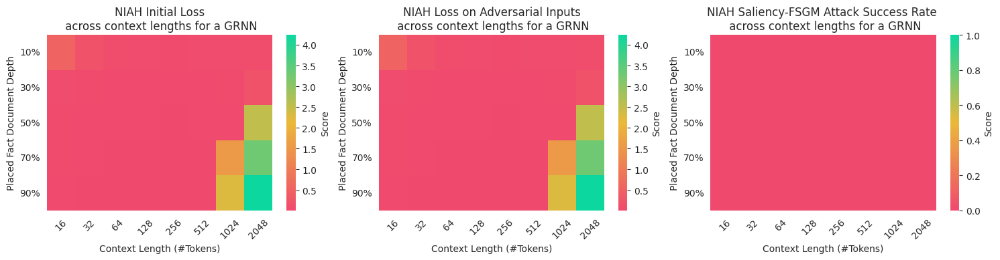

In [ ]:
plot_salience_asr(saliency_fgsm_dfa, grnn_dfa, DFADataset, 50, n_iter=20, name='GRNN')

100%|██████████| 6/6 [00:09<00:00,  1.55s/it]


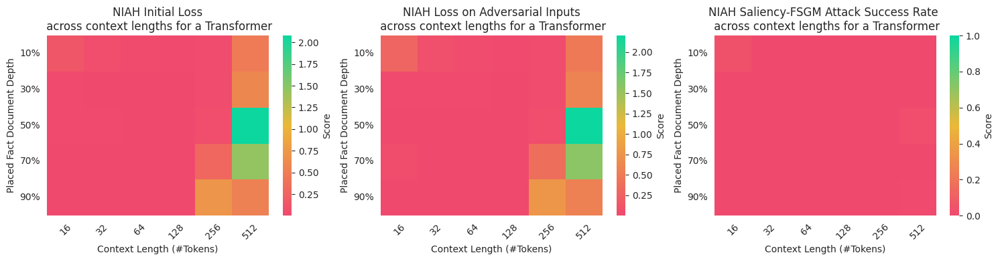

In [ ]:
plot_salience_asr(saliency_fgsm_dfa, transformer_dfa, DFADataset, 100, n_iter=20, name='Transformer', lgmax=9)

We observe that the FSGM (typically used to change pixels) does not fully generalise to the discrete case (with so few symbols). This is because the changes which can be made are so large that they are not well-approximated by the sign of the gradient alone.

#### CosineDistance Adversarial

I propose the natural modification: consider not just the sign but also the magnitude. Specifically when considering how good a new word is likely to be, we use the cosine similarity of the difference between the words and the gradient as the similarity metric. The hope is that this will lead to a better approximation.


In [ ]:
import copy


def projected_grad_dfa(model, xs, ys, k=100):
    # we remove embedding layer so *need* to copy!
    model = copy.deepcopy(model)
    innermodel = model
    # extract the true model from the trainer
    while hasattr(innermodel, 'model'):
        innermodel = innermodel.model
    embedding = innermodel.embedding
    innermodel.embedding = nn.Identity()

    # compute the k most important features
    emb = nn.Parameter(embedding(xs).detach(), requires_grad=True)

    # compute the loss
    logits = model(emb)
    loss = F.cross_entropy(logits.flatten(0, 1), ys.flatten())
    loss.backward()
    # ✓

    # find the most salient features (which do not form part of the key)
    key = torch.argmax(1 * (xs == 4), dim=-1)

    # now, find the transformations which are maximally similar to the direction of the gradient
    # dot product of possible substitutions and their gradients gives a similarity metric between the transformations we *can* do and those we want to do
    similarity = (F.normalize(embedding.weight[:4].reshape(1, 1, -1, emb.size(-1)) - emb.reshape(xs.size(0), emb.size(1), 1, emb.size(-1)), 2, -1) * F.normalize(emb.grad.reshape(emb.size(0), emb.size(1), 1, emb.data.size(-1)), 2, -1)).sum(-1)

    # now, choose the k most similar transformations and make them!
    args = similarity.amax(dim=-1).argsort(-1, True)
    kmost = args[(args != key.reshape(-1, 1)) & (args != key.reshape(-1, 1) + 1)].reshape(args.size(0), args.size(1) - 2)[:, :k]
    subs = similarity.argmax(dim=-1)

    # replace the k most salient features
    indx = torch.arange(xs.size(0)).reshape(-1, 1).expand(-1, kmost.size(-1)).flatten()
    xs[indx, kmost.flatten()] = subs[indx, kmost.flatten()]

    return xs

100%|██████████| 8/8 [00:15<00:00,  1.91s/it]


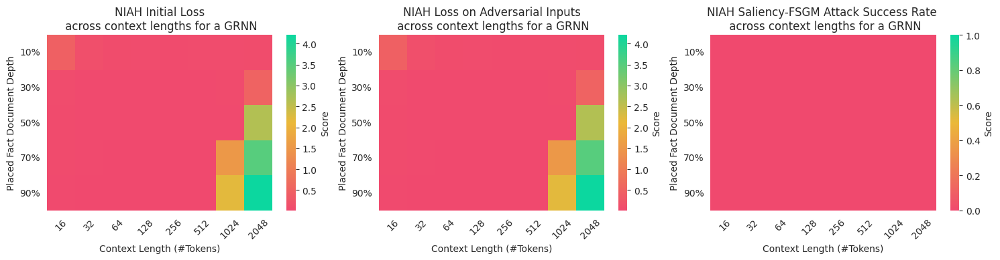

In [ ]:
plot_salience_asr(projected_fgsm_dfa, grnn_dfa, DFADataset, 50, 'GRNN', n_iter=50)

100%|██████████| 8/8 [01:09<00:00,  8.66s/it]


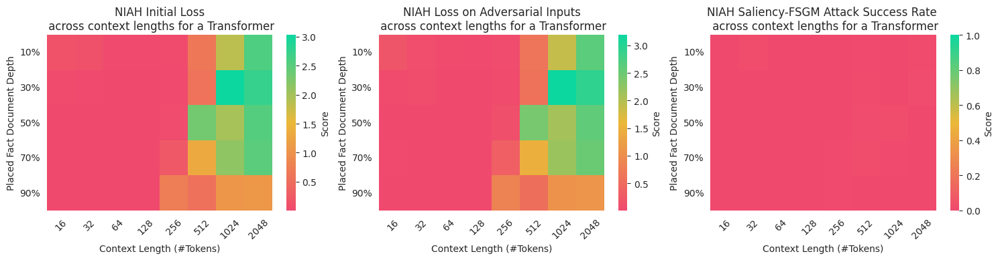

In [ ]:
plot_salience_asr(projected_fgsm_dfa, transformer_dfa, DFADataset, 50, name='Transformer', n_iter=50)

Once again, this attack does not work. I conject that gradient based approaches which operate on discrete datapoints are unlikely to be successful due to the extent of the discrete nature *i.e.* gradients are only locally valid -- but for a gradient-based approach to work here, we *have* to assume gradients are valid in some more general sense.

### Adversarial Suffixes

After the success of the greedy hill-climbing algorithm, we now look for gradient-based approaches which *do* work. This time I introduce a new problem setting. I now look to find a suffix which can be appended to an arbitrary sequence and will cause it to be classified in the target way.

I approach this by optimising the objective function:
$$
    \mathcal{L} = -\mathsf{CSE}(m(\mathbf{X} \parallel \mathsf{suffix}), \mathbf{Y}) + \alpha \sum_{s \in \mathsf{suffix}} \min_{e \in \text{embeddings}} \|s - e\|
$$
where $\alpha$ starts very small and is then increased -- similar to learning rate scheduling.

In [ ]:
import math


# redefine transformer -- the only difference is that this appends our prefix after the positional embedding -- allowing for a gradient based attack
class AdversarialTransformer(nn.Module):
    def __init__(self, model, suffix):
        super().__init__()
        self.suffix = suffix
        self.model = model # the un-augmented transformer

    def forward(self, x):
        y = self.model.embedding(x)
        y = torch.cat((y, self.suffix.reshape(1, -1, 32).expand(y.size(0), -1, -1)), dim=1)
        y = self.model.positional_embedding(y)
        src_mask = nn.Transformer.generate_square_subsequent_mask(y.size(1), 'cuda')
        for decoder in self.model.decoders:
            y = decoder(y, is_causal=True, src_mask=src_mask)
        y = self.model.fc(y)
        return y



class AdvTrainer(pl.LightningModule):
    def __init__(self, transformer, suffixlen, epochs, alpha, target, optimkwargs={'lr': 0.001}):
        super().__init__()
        self.suffix = nn.Parameter(torch.zeros(suffixlen, 32).cuda())
        self.model = AdversarialTransformer(transformer, self.suffix)
        self.epochs = epochs
        self.acc = torchmetrics.Accuracy(task='multiclass', num_classes=5)
        self.train_num = 0
        self.batch_train_loss = 0
        self.batch_train_acc = 0
        self.val_num = 0
        self.batch_val_loss = 0
        self.batch_val_acc = 0
        self.train_loss = []
        self.train_acc = []
        self.val_loss = []
        self.val_acc = []
        self.optimkwargs = optimkwargs
        self.alpha = alpha
        self.target = target

    def forward(self, x):
        return self.model(x)

    def training_step(self, batch, batch_idx):
        x, y = batch
        logits = self(x)
        logits = logits[:, -1].reshape(-1, logits.size(-1))
        y = y[:, -1:].expand(-1, 1).flatten()
        loss = F.cross_entropy(logits, y)
        acc = self.acc(logits, y)
        self.batch_train_loss += loss.item() * y.numel()
        self.batch_train_acc += acc.item() * y.numel()
        self.train_num += y.numel()
        self.log('train loss', loss, prog_bar=True)

        # add a regularisation term to make the suffix close to encodings for real characters!
        # this is the mse between each suffix and its nearest embedding
        mse = (self.suffix.reshape(1, -1, 32) - self.model.model.embedding.weight.data[:4].reshape(4, 1, 32)).pow(2).sum(2).amin(0).sum()

        # minima now has "real" loss = self.target and is found with valid codewords!
        loss = (self.target - loss) ** 2 + self.alpha * mse
        return loss

    def on_train_epoch_end(self):
        self.train_loss.append(self.batch_train_loss / self.train_num)
        self.train_acc.append(self.batch_train_acc / self.train_num)
        self.batch_train_loss = 0
        self.batch_train_acc = 0
        self.train_num = 0

    def validation_step(self, batch, batch_idx):
        x, y = batch
        logits = self(x)
        logits = logits[:, -self.suffix.size(0):].reshape(-1, logits.size(-1))
        y = y[:, -1:].expand(-1, self.suffix.size(0)).flatten()
        loss = F.cross_entropy(logits, y)
        acc = self.acc(logits, y)
        self.batch_val_loss += loss.item() * y.numel()
        self.batch_val_acc += acc.item() * y.numel()
        self.val_num += y.numel()
        self.log('val loss', loss, prog_bar=True)

    def on_validation_epoch_end(self):
        self.val_loss.append(self.batch_val_loss / self.val_num)
        self.val_acc.append(self.batch_val_acc / self.val_num)
        self.batch_val_loss = 0
        self.batch_val_acc = 0
        self.val_num = 0

    def on_train_end(self):
        plt.figure(figsize = (14,4))

        plt.subplot(1, 2, 1)
        plt.plot(np.arange(len(self.train_loss)), self.train_loss, label='Training')
        plt.plot(np.arange(len(self.val_loss)), self.val_loss, label='Validation')
        plt.xlabel('epoch')
        plt.ylabel('loss')
        plt.title('Loss')
        plt.legend()

        plt.subplot(1, 2, 2)
        plt.plot(np.arange(len(self.train_acc)), self.train_acc, label='Training')
        plt.plot(np.arange(len(self.val_acc)), self.val_acc, label='Validation')
        plt.xlabel('epoch')
        plt.ylabel('accuracy')
        plt.title('Accuracy')
        plt.legend()

    def test_step(self, batch, batch_idx):
        x, y = batch
        logits = self(x)
        logits = logits[:, x.size(1):].reshape(-1, logits.size(-1))
        y = y[:, -1:].expand(-1, self.suffix.size(0)).flatten()
        loss = F.cross_entropy(logits, y)
        accuracy = self.acc(logits, y)
        self.log('test acc', accuracy)
        self.log('test loss', loss)
        return loss

    def configure_optimizers(self):
        return torch.optim.Adam((self.suffix,), **self.optimkwargs)


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=10` reached.


INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test acc          │    0.8514556884765625     │
│         test loss         │    0.6580004096031189     │
└───────────────────────────┴───────────────────────────┘

tensor(0.9189)
tensor(0.9627)


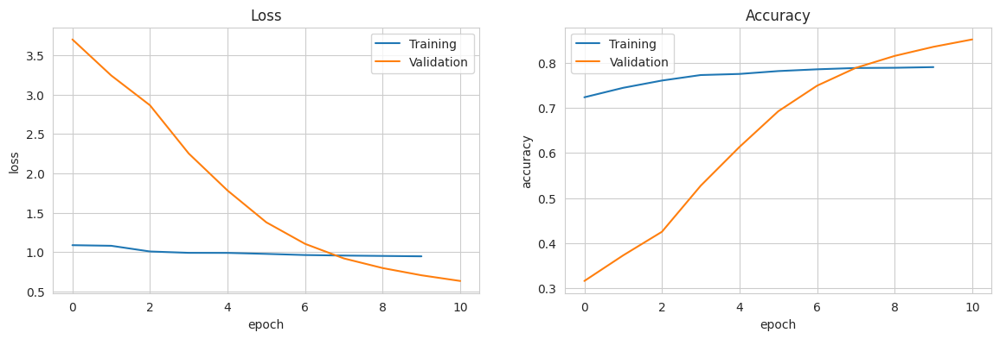

In [ ]:
l = 256
max_epochs = 10

advtransformer = AdvTrainer(
    transformer_dfa,    # the transformer trained above
    l,                  # searching for a suffix of length l
    max_epochs,         # max epochs
    0.5,                # regularisation term!
    1,                  # target loss!
    {'lr': 0.01}
)

datamodule = PLDatamodule(DFADataset, n_samples=2048, seqlength=128)

trainer = pl.Trainer(
    max_epochs = max_epochs,
    enable_model_summary = False,
    enable_checkpointing=False,
    callbacks=[RichProgressBar()],
)

trainer.fit(
    model=advtransformer,
    datamodule=datamodule,
)

trainer.test(
    model=advtransformer,
    datamodule=datamodule
)

# these are the words we want to append to our data!
word_suffix = (advtransformer.suffix.data.reshape(1, -1, 32) - transformer_dfa.embedding.weight[:4].data.reshape(-1, 1, 32)).pow(2).sum(2).argmin(0)

# take the test dataset and concatenate the found words onto it
x, y = datamodule.test_data.tensors

acc_fn = torchmetrics.Accuracy(task='multiclass', num_classes=5)

transformer_dfa.eval()

# print accuracy!
x_adv = torch.cat((x, word_suffix.reshape(1, -1).expand(x.size(0), -1)), dim=1)
y_adv = torch.cat((y, y[:, -1].reshape(-1, 1).expand(y.size(0), word_suffix.size(0))), dim=1)
transformer_dfa.cuda()(x_adv.cuda())
print(acc_fn(transformer_dfa(x_adv.cuda())[:, -l:].flatten(0, 1).cpu(), y_adv[:, -l:].flatten()))
x_rng = torch.cat((x, torch.randint(4, (x.size(0), l))), dim=1)
print(acc_fn(transformer_dfa(x_rng.cuda())[:, -l:].flatten(0, 1).cpu(), y_adv[:, -l:].flatten()))

This attack proved to be largely inneffective, being unable to produce suffixes which cause significant misclassification -- even for long sequences with huge dataset sizes. We observed that in all cases, the performance of the continuous suffix on the training set could be made as low as desired; however, when discretised the performance on the performance on the test and validation sets returned to normal levels.

This helps to ground the conjecture that gradient-based attacks will not work well due to the sparsity of discrete datapoints.

I experimented with many other methods to try to help convergence -- and observed no accuracy drop. Methods I tried included:
- adding noise to the datapoints
- regularisation scheduling
- random initialisation
- minimising the difference between the train loss and a specific target loss vs minimising loss overall
- varying suffix lengths

It's well-known that attacks on discrete samples are hard -- and that gradient-based approaches often struggle.

We observe that:
- with high regularisation, the words formed are valid and the model has high accuracy, even with continuous inputs.
- with low regularisation, the model achieves the desired accuracy on the test set but largely ignores real words, using instead "soft" words.

This characterisation of behaviour is a hallmark of a very difficult optimisation problem.